# Strategies for Fairer Council Tax in London

__Student ID: 201798764  
Module code: GEOG5404M  
Module title: Analytics for Urban Policy__  

<br>

## Introduction  
Council tax is a critical source of revenue that local councils use to fund essential services such as adult social care, education, and waste management. In England, the amount of council tax is determined by the property's assigned band, which ranges from A (the lowest) to H (the highest). These bands were originally set based on property values assessed on April 1, 1991, by the Valuation Office Agency (VOA).
Despite its importance, the council tax system has faced increasing scrutiny over its fairness and responsiveness to current economic conditions. The financial challenges of local councils have been exacerbated by demographic changes, economic shifts, and dramatic housing price increases. These issues came to a head following the COVID-19 pandemic, which further strained local government finances and highlighted the need for fiscal reforms. The bankruptcy of Croydon Borough in 2023 underscored the severe challenges local councils can face and sparked widespread calls for a thorough reassessment of the council tax system.
This study aims to analyse council tax trends across various London boroughs, focusing on their temporal and geographical distributions. It evaluates the tax burden through a specifically developed index and compares boroughs within similar clusters to identify features that contribute to higher taxation. The study also assesses the adequacy of current tax bands in reflecting contemporary property values. By doing so, it seeks to develop informed recommendations that could make the council tax system fairer for all London residents, thereby enhancing the financial resilience of local governments.


<br>

## Analysis Plan 

__1.	Data Collection__  
Datasets encompassing various borough profiles—including demographic, economic, employment, housing, education, health, crime, and public infrastructure, along with geographical boundaries—were sourced from GOV.UK, the Urban Big Data Center, the London Database, and the Office of National Statistics. To enrich these datasets, web scraping techniques were used to gather additional data on council tax amounts from GOV.UK. Furthermore, information regarding council tax rates and the number of properties across different boroughs was also included.  

__2.	Data Wrangling__  
Information on London boroughs was compiled into a primary dataset for 2022, the year with the most complete data. Additionally, two datasets were developed to track changes from 2010 to 2022: one for the ratio of council tax to average housing prices, and another for the ratio of council tax to average income. Missing values (NAs) were filled based on set conditions, and data types were standardized across all datasets to support subsequent analysis.

__3.	Descriptive Statistic and Visualisation__  
This stage focuses on exploring and visualizing the relationships between council tax and various socio-economic indicators across London boroughs. The objectives are as follows:
  a.	Relationship Between Council Tax and Current Housing Prices
  b.	Distribution of Council Tax by Borough
  c.	Proportion of Council Tax Bands by Borough
  d.	Fairness of Council Tax
  Assess the fairness of council tax using two specific evaluation methods:
   - The ratio of Council Tax to Average Housing Price (2010-2024)
   - The ratio of Council Tax to Average Income (2010-2021)
   - Fairness Index: This index is derived from the above ratios to identify areas that require more attention.
     These assessments will be further categorized into:
          i.	Temporal Trends in Fairness
      The analysis was structured by grouping the years into five-year intervals. Specifically, the period from 2020 to 2022 was analys
          ii.	ed to capture the impact of the pandemic, with an extension into 2023 where data is available.
          iii.	Geographical Distribution of Fairness

__4.	Correlation Matrix__  
Initial analysis assessed the correlation between council tax and socio-economic features across different boroughs. Features with correlation coefficients exceeding 0.5 or falling below -0.5 were selected as potential candidates for further analysis.

__5.	Clustering__  
Hierarchical(Dendrogram) and K-means clustering were selected to analyse the small dataset (33 rows and 34 columns). To tackle multicollinearity, the correlation matrix for the selected features was recalculated to identify high correlations, with coefficients above 0.8 or below -0.8. Multicollinearity severity was assessed using the Variance Inflation Factor (VIF). If high VIF values indicated significant linear dependencies, Principal Component Analysis (PCA) was applied to reduce these dependencies and extract principal components that best represent the data structure, enhancing clustering analysis. After clustering completion, the cluster distributions were compared with council tax distributions to identify common patterns and factors influencing council tax variations.

### 1. Data Collection

#### Data

- **Borough Profile**  
The dataset consists of 15 Excel/CSV files, spanning categories such as Population, Economic Indicators, Employment, Housing, Education, Health, Safety, and Public Infrastructure.

| Category                | Data                                  | File Type | Coverage         | Data Source                                                                                                 |
|-------------------------|-----------------------------------------------|-----------|------------------|-------------------------------------------------------------------------------------------------------------|
| **Population Data**     | Total Population (Estimates)                  | Excel     | National, 2022   | [Office for National Statistics](https://www.ons.gov.uk/peoplepopulationandcommunity/populationandmigration/populationestimates/bulletins/annualmidyearpopulationestimates/mid2022) |
|                         | Estimates of the population age               | CSV       | Borough, 2015    | [London Datastore](https://data.london.gov.uk/dataset/office-national-statistics-ons-population-estimates-borough) |
|                         | Proportion of Population by Ethnicity         | CSV       | National, 2020   | [London Datastore](https://data.london.gov.uk/dataset/ethnic-groups-borough) |
| **Economic Indicators** | GDP per Capita by Borough                     | CSV       | Borough, 2022    | [Office for National Statistics](https://www.ons.gov.uk/datasets/gdp-by-local-authority/editions/time-series/versions/2) |
|                         | Average Income of Tax Payer         | CSV       | Borough, 2022    | [London Datastore](https://data.london.gov.uk/dataset/average-income-tax-payers-borough) |
|                         | Local Units and Enterprises by Employment Size, Borough | CSV | Borough, 2023 | [London Datastore](https://data.london.gov.uk/dataset/local-units-employment-size-borough) |
| **Employment**          | Unemployment Rate                             | CSV       | Borough, 2023    | [NOMIS](https://www.nomisweb.co.uk/customerrors/nodataset.asp) |
| **Housing**             | Average Housing Price              | PDF       | Borough, 2023    | [RightMove](https://www.rightmove.co.uk/news/content/uploads/2023/07/Rightmove-House-Price-Index-17th-July-2023.pdf) |
|                         | Number of Properties                          | CSV       | Borough, 2022    | [Ministry of Housing, Communities & Local Government (MHCLG)](https://data.london.gov.uk/dataset/net-additional-dwellings-borough) |
|                         | Property Type Distribution                    | CSV       | Borough, 2023    | [Valuation Office Agency](https://data.london.gov.uk/dataset/property-build-period-lsoa) |
|                         | Home Ownership and Renting Statistics         | CSV       | Borough, 2018    | [Ministry of Housing, Communities & Local Government (MHCLG)](https://www.ons.gov.uk/peoplepopulationandcommunity/housing/bulletins/housingenglandandwales/census2021) |
|                         | Net Addition of Properties                    | CSV       | Borough, 2022    | [Ministry of Housing, Communities & Local Government (MHCLG)](https://data.london.gov.uk/dataset/net-additional-dwellings-borough) |
|                         | Vacant Dwellings                              | Excel     | Borough, 2023    | [Ministry of Housing, Communities & Local Government (MHCLG)](https://data.london.gov.uk/dataset/vacant-dwellings) |
| **Education**           | School Funding per Pupil                      | CSV       | Borough, 2013    | [Greater London Authority (GLA)](https://data.london.gov.uk/dataset/london-ward-well-being-scores) |
| **Health**              | Life Expectancy                               | Excel     | Borough, 2013    | [Greater London Authority (GLA)](https://data.london.gov.uk/dataset/london-ward-well-being-scores) |
|                         | Childhood Obesity Rate                        | Excel     | Borough, 2013    | [Greater London Authority (GLA)](https://data.london.gov.uk/dataset/london-ward-well-being-scores) |
|                         | Incapacity Benefit Rate                       | Excel     | Borough, 2013    | [Greater London Authority (GLA)](https://data.london.gov.uk/dataset/london-ward-well-being-scores) |
|                         | Subjective Well-Being Average Score           | Excel     | Borough, 2013    | [Greater London Authority (GLA)](https://data.london.gov.uk/dataset/london-ward-well-being-scores) |
| **Safety**            | Crime Rate - Index             | Excel     | Borough, 2013| Greater London Authority (GLA) | [Link](https://data.london.gov.uk/dataset/london-ward-well-being-scores)                        |
|                      | Deliberate Fires               | Excel     | Borough, 2013| Greater London Authority (GLA) | [Link](https://data.london.gov.uk/dataset/london-ward-well-being-scores)                        |
| **Public Infrastructure** | Public Transport Accessibility | Excel     | Borough, 2013| Greater London Authority (GLA) | [Link](https://data.london.gov.uk/dataset/london-ward-well-being-scores)                        |
|                      | Homes with Access to Open Space and Nature | Excel | Borough, 2013| Greater London Authority (GLA) | [Link](https://data.london.gov.uk/dataset/london-ward-well-being-scores)                        |
|                      | Percentage of Green and Blue Space | Excel   | Borough, 2013| Greater London Authority (GLA) | [Link](https://data.london.gov.uk/dataset/london-ward-well-being-scores)                        |
| **Additional**           | Geographical Boundary                 | SHP       | Borough, 2014| Greater London Authority (GLA) | [Link](https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london)                |



<br>

- **Annual Variation**  
Three datasets are used to examine the yearly variation. Further analysis utilizes the council tax dataset along with other datasets (Average Housing Price and Average Income) to identify tax pressure across boroughs.

| Data                                         | File Type | Coverage          | Data Source                                                                                                             |
|----------------------------------------------------|-----------|-------------------|-------------------------------------------------------------------------------------------------------------------------|
| Band D Council Tax figures 1993 onwards (Annual Council Tax) | Excel     | Borough, 1993-2023 | [Valuation Office Agency](https://www.gov.uk/government/statistical-data-sets/live-tables-on-council-tax#average-council-tax-per-dwelling) |
| UK House Price Index (Annual Average Housing Price) | Excel     | Borough, 1995-2024 | [HM Land Registry](https://www.gov.uk/government/statistical-data-sets/uk-house-price-index-data-downloads-january-2017?utm_medium=GOV.UK&utm_source=summary&utm_campaign=section9&utm_term=9.30_21_03_17&utm_content=download_data) |
| Annual Average Income of Tax Payers                 | Excel     | Borough, 1999-2022 | [HM Revenue & Customs](https://www.gov.uk/government/statistics/income-and-tax-by-county-and-region-2010-to-2011)       |



- **Property Council Tax Band in London**  

To enhance the richness of the council tax band data across different boroughs, web scraping is employed. The method involves using the first four characters of the postcode to scrape actual property details from the "Check your Council Tax band" website ([Check your Council Tax band](https://www.tax.service.gov.uk/check-council-tax-band/search)). For each postcode, three properties are randomly selected. This approach is chosen because there is a limit of 10,000 records per search.

| Data Point                       | File Type | Coverage            | Data Source     | Link                                                     |
|----------------------------------|-----------|---------------------|-----------------|----------------------------------------------------------|
| Property Council Tax Band in London | CSV       | London, current     | Web scraping from GOV.UK | [GOV.UK](https://www.tax.service.gov.uk/check-council-tax-band/search) |
| London Postcodes                 | CSV       | London, not mentioned | doogal.co.uk    | [doogal.co.uk](https://www.doogal.co.uk/london_postcodes) |


The dataset is used to expand the dataset size for the regression model; however, due to the low R-squared and multicollinearity, the results are not adopted in the research. The development of the regression model can be found in the last part of the Jupyter Notebook.


<br>
<br>

### 2. Data Wrangling

##### Import Library

In [1]:
import pandas as pd
import numpy as np
import glob

import os
import csv
import time
import re
import random
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from webdriver_manager.chrome import ChromeDriverManager
from selenium.common.exceptions import NoSuchElementException, TimeoutException

from sklearn.preprocessing import StandardScaler # Standardization of Data
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm # multiple regression
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Patch
import matplotlib.dates as mdates
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from matplotlib import patheffects
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
import matplotlib.cm as cm
import matplotlib.patheffects as patheffects
import matplotlib.colors as mcolors

import plotly.graph_objects as go
import plotly.express as px
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')

In [2]:
borough_names = [
    "Barking and Dagenham", "Barnet", "Bexley", "Brent", "Bromley", "Camden", "City of London",
    "Croydon", "Ealing", "Enfield", "Greenwich", "Hackney", "Hammersmith and Fulham", "Haringey",
    "Harrow", "Havering", "Hillingdon", "Hounslow", "Islington", "Kensington and Chelsea",
    "Kingston upon Thames", "Lambeth", "Lewisham", "Merton", "Newham", "Redbridge", "Richmond upon Thames",
    "Southwark", "Sutton", "Tower Hamlets", "Waltham Forest", "Wandsworth", "Westminster"
]

data = np.array(borough_names)
df = pd.DataFrame(data, columns=['borough'])

df.head()

,borough
0,Barking and Dagenham
1,Barnet
2,Bexley
3,Brent
4,Bromley


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   borough  33 non-null     object
dtypes: object(1)
memory usage: 396.0+ bytes


In [4]:
def clean_data(df, columns, replace_dict):
    """
    Clean specified columns in a DataFrame.
    
    Parameters:
    df (pandas.DataFrame): The DataFrame to be cleaned.
    columns (list): List of column names to clean.
    replace_dict (dict): Replacement rules, where keys are the content to replace and values are the new content.
    
    Returns:
    pandas.DataFrame: The cleaned DataFrame.
    """
    for col in columns:
        if col in df.columns:
            # Iterate through each replacement rule in the dictionary and apply
            for old, new in replace_dict.items():
                df[col] = df[col].replace(old, new, regex=True)
            # Attempt to convert the column to integer
            try:
                df[col] = df[col].astype(int)
            except ValueError:
                print(f"Warning: Column '{col}' could not be converted to integer.")
    return df

#### Council Tax (2022 - 2023)

In [5]:
df_tax = pd.read_csv('Dataset/Council Tax/council_tax_bands_borough_2022_2023.csv')
df_tax.head()

,Code,Local authority,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,E09000001,City of London,716,836,955,"1,075","1,313","1,552","1,791","2,149"
1,E09000002,Barking & Dagenham,"1,190","1,388","1,587","1,785","2,181","2,578","2,975","3,570"
2,E09000003,Barnet,"1,164","1,358","1,552","1,746","2,134","2,522","2,910","3,493"
3,E09000004,Bexley,"1,282","1,496","1,709","1,923","2,350","2,778","3,205","3,846"
4,E09000005,Brent,"1,210","1,412","1,613","1,815","2,218","2,622","3,025","3,630"


In [6]:
df_tax = df_tax[['Local authority', 'Band D']]
df_tax = df_tax.rename(columns={'Local authority': 'borough'})

In [7]:
columns_to_clean = ['borough', 'Band D']
replacements = {',': '', '&': 'and', '-': ' '}

df_tax = clean_data(df_tax, columns_to_clean, replacements)

df_tax.head()

,borough,Band D
0,City of London,1075
1,Barking and Dagenham,1785
2,Barnet,1746
3,Bexley,1923
4,Brent,1815


In [8]:
df = df.merge(df_tax, on='borough')
df.head()

,borough,Band D
0,Barking and Dagenham,1785
1,Barnet,1746
2,Bexley,1923
3,Brent,1815
4,Bromley,1737


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   borough  33 non-null     object
 1   Band D   33 non-null     int32 
dtypes: int32(1), object(1)
memory usage: 528.0+ bytes


<br>

#### Population data  

- Total Population(Estimates)
- Estimates of the population age
- Proportion of Population by Ethnicity

- Total Population(Estimates)

In [10]:
df_pop = pd.read_csv('Dataset/London Borough Profile/1. Population/population-of-london-2022-by-borough.csv')
df_pop.head()

,borough,population
0,Croydon,"392,224"
1,Barnet,"389,101"
2,Ealing,"369,937"
3,Newham,"358,645"
4,Brent,"341,221"


In [11]:
columns_to_clean = ['population']
replacements = {',': ''}

df_pop = clean_data(df_pop, columns_to_clean, replacements)

df_pop.head()

,borough,population
0,Croydon,392224
1,Barnet,389101
2,Ealing,369937
3,Newham,358645
4,Brent,341221


In [12]:
df = df.merge(df_pop, on='borough')
df

,borough,Band D,population
0,Barking and Dagenham,1785,219992
1,Barnet,1746,389101
2,Bexley,1923,247835
3,Brent,1815,341221
4,Bromley,1737,329578
5,Camden,1792,218049
6,City of London,1075,10847
7,Croydon,1966,392224
8,Ealing,1735,369937
9,Enfield,1842,327224


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   borough     33 non-null     object
 1   Band D      33 non-null     int32 
 2   population  33 non-null     int32 
dtypes: int32(2), object(1)
memory usage: 660.0+ bytes


- Estimates of the population age

In [14]:
df_age = pd.read_csv('Dataset/London Borough Profile/1. Population/Estimates of the population age london borough.csv')
df_age.head()

,Code,Name,All ages,0,1,2,3,4,5,6,...,81,82,83,84,85,86,87,88,89,90+
0,E09000007,Camden,"218,049","2,155","2,039","1,967","1,910","1,906","1,924","2,018",...,660,689,609,597,474,445,391,304,279,"1,182"
1,E09000001,City of London,"10,847",68,43,33,35,28,39,25,...,36,41,27,34,15,24,13,16,8,43
2,E09000012,Hackney,"261,491","3,609","3,409","3,181","3,062","2,916","2,984","3,060",...,502,479,430,382,352,361,316,233,223,762
3,E09000013,Hammersmith and Fulham,"185,238","2,040","1,925","1,762","1,762","1,645","1,779","1,754",...,543,547,516,415,371,340,272,253,212,777
4,E09000014,Haringey,"261,811","3,224","3,030","2,993","2,891","2,886","2,781","3,033",...,704,721,671,663,548,537,425,403,298,"1,138"


In [15]:
for col in df_age.columns:
    if col not in ['Code', 'Name']:
        df_age[col] = df_age[col].replace(',', '', regex=True).astype(int)

df_age.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 94 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Code      33 non-null     object
 1   Name      33 non-null     object
 2   All ages  33 non-null     int32 
 3   0         33 non-null     int32 
 4   1         33 non-null     int32 
 5   2         33 non-null     int32 
 6   3         33 non-null     int32 
 7   4         33 non-null     int32 
 8   5         33 non-null     int32 
 9   6         33 non-null     int32 
 10  7         33 non-null     int32 
 11  8         33 non-null     int32 
 12  9         33 non-null     int32 
 13  10        33 non-null     int32 
 14  11        33 non-null     int32 
 15  12        33 non-null     int32 
 16  13        33 non-null     int32 
 17  14        33 non-null     int32 
 18  15        33 non-null     int32 
 19  16        33 non-null     int32 
 20  17        33 non-null     int32 
 21  18        33 non-n

In [16]:
df_age['0-18'] = 0
df_age['19-64'] = 0
df_age['65+'] = 0

for col in df_age.columns:
    if col.isdigit():
        age = int(col)
        if age <= 18:
            df_age['0-18'] += df_age[col]
        elif 19 <= age <= 64:
            df_age['19-64'] += df_age[col]
        elif age >= 65:
            df_age['65+'] += df_age[col]

df_age = df_age[['Name', 'All ages', '0-18', '19-64', '65+']]

df_age.head()

,Name,All ages,0-18,19-64,65+
0,Camden,218049,39179,153492,24196
1,City of London,10847,691,8856,1257
2,Hackney,261491,58112,182113,20504
3,Hammersmith and Fulham,185238,33598,132194,18669
4,Haringey,261811,56915,176287,27471


In [17]:
df_age['0-18 ratio'] = df_age['0-18'] / df_age['All ages']
df_age['19-64 ratio'] = df_age['19-64'] / df_age['All ages']
df_age['65+ ratio'] = df_age['65+'] / df_age['All ages']

df_age.head()

,Name,All ages,0-18,19-64,65+,0-18 ratio,19-64 ratio,65+ ratio
0,Camden,218049,39179,153492,24196,0.179680,0.703934,0.110966
1,City of London,10847,691,8856,1257,0.063704,0.816447,0.115885
2,Hackney,261491,58112,182113,20504,0.222233,0.696441,0.078412
3,Hammersmith and Fulham,185238,33598,132194,18669,0.181377,0.713644,0.100784
4,Haringey,261811,56915,176287,27471,0.217390,0.673337,0.104927


In [18]:
df_age = df_age.rename(columns={'Name': 'borough'})
df_age.head()

,borough,All ages,0-18,19-64,65+,0-18 ratio,19-64 ratio,65+ ratio
0,Camden,218049,39179,153492,24196,0.179680,0.703934,0.110966
1,City of London,10847,691,8856,1257,0.063704,0.816447,0.115885
2,Hackney,261491,58112,182113,20504,0.222233,0.696441,0.078412
3,Hammersmith and Fulham,185238,33598,132194,18669,0.181377,0.713644,0.100784
4,Haringey,261811,56915,176287,27471,0.217390,0.673337,0.104927


In [19]:
col = ['borough'] + [col for col in df_age.columns if 'ratio' in col.lower()]

df_age = df_age[col]
df_age.head()

,borough,0-18 ratio,19-64 ratio,65+ ratio
0,Camden,0.179680,0.703934,0.110966
1,City of London,0.063704,0.816447,0.115885
2,Hackney,0.222233,0.696441,0.078412
3,Hammersmith and Fulham,0.181377,0.713644,0.100784
4,Haringey,0.217390,0.673337,0.104927


In [20]:
df = df.merge(df_age, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162
1,Barnet,1746,389101,0.244024,0.607757,0.139275
2,Bexley,1923,247835,0.242423,0.590219,0.158517
3,Brent,1815,341221,0.227375,0.653430,0.113533
4,Bromley,1737,329578,0.231089,0.590537,0.167645


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   borough      33 non-null     object 
 1   Band D       33 non-null     int32  
 2   population   33 non-null     int32  
 3   0-18 ratio   33 non-null     float64
 4   19-64 ratio  33 non-null     float64
 5   65+ ratio    33 non-null     float64
dtypes: float64(3), int32(2), object(1)
memory usage: 1.4+ KB


- Proportion of Population by Ethnicity

In [22]:
df_ethnic = pd.read_csv('Dataset/London Borough Profile/1. Population/ethnic-groups-by-borough.csv')
df_ethnic.head()

,borough,White,Asian,Black,Mixed/ Other,Total
0,City of London,"12,000",-,-,-,"12,000"
1,Barking and Dagenham,"99,000","55,000","51,000","16,000","222,000"
2,Barnet,"255,000","79,000","28,000","35,000","398,000"
3,Bexley,"188,000","20,000","28,000","18,000","254,000"
4,Brent,"117,000","138,000","40,000","37,000","332,000"


In [23]:
columns_to_clean = ['White', 'Asian', 'Black', 'Mixed/ Other', 'Total']
replacements = {',': '', '-': '0'}

df_ethnic = clean_data(df_ethnic, columns_to_clean, replacements)

df_ethnic.head()

,borough,White,Asian,Black,Mixed/ Other,Total
0,City of London,12000,0,0,0,12000
1,Barking and Dagenham,99000,55000,51000,16000,222000
2,Barnet,255000,79000,28000,35000,398000
3,Bexley,188000,20000,28000,18000,254000
4,Brent,117000,138000,40000,37000,332000


In [24]:
df_ethnic['White ratio'] = df_ethnic['White'] / df_ethnic['Total']
df_ethnic['Asian ratio'] = df_ethnic['Asian'] / df_ethnic['Total']
df_ethnic['Black ratio'] = df_ethnic['Black'] / df_ethnic['Total']
df_ethnic['Mixed/ Other'] = df_ethnic['Mixed/ Other'] / df_ethnic['Total']

df_ethnic.head()

,borough,White,Asian,Black,Mixed/ Other,Total,White ratio,Asian ratio,Black ratio
0,City of London,12000,0,0,0.000000,12000,1.000000,0.000000,0.000000
1,Barking and Dagenham,99000,55000,51000,0.072072,222000,0.445946,0.247748,0.229730
2,Barnet,255000,79000,28000,0.087940,398000,0.640704,0.198492,0.070352
3,Bexley,188000,20000,28000,0.070866,254000,0.740157,0.078740,0.110236
4,Brent,117000,138000,40000,0.111446,332000,0.352410,0.415663,0.120482


In [25]:
df_ethnic = df_ethnic.rename(columns={'Total': 'Total_Age'})

In [26]:
col = ['borough'] + [col for col in df_ethnic.columns if 'ratio' in col.lower()]

df_ethnic = df_ethnic[col]
df_ethnic.head()

,borough,White ratio,Asian ratio,Black ratio
0,City of London,1.000000,0.000000,0.000000
1,Barking and Dagenham,0.445946,0.247748,0.229730
2,Barnet,0.640704,0.198492,0.070352
3,Bexley,0.740157,0.078740,0.110236
4,Brent,0.352410,0.415663,0.120482


In [27]:
df = df.merge(df_ethnic, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   borough      33 non-null     object 
 1   Band D       33 non-null     int32  
 2   population   33 non-null     int32  
 3   0-18 ratio   33 non-null     float64
 4   19-64 ratio  33 non-null     float64
 5   65+ ratio    33 non-null     float64
 6   White ratio  33 non-null     float64
 7   Asian ratio  33 non-null     float64
 8   Black ratio  33 non-null     float64
dtypes: float64(6), int32(2), object(1)
memory usage: 2.2+ KB


<br>
<br>

#### Economic Indicators  
- GDP per Capita by Borough
- Average Income of Tax Payer
- Local Units and Enterprises by Employment Size

- GDP per Capita by Borough

In [29]:
df_gdp = pd.read_csv('Dataset/London Borough Profile/2. Economic Indicator/gdp_by_borough_2022.csv')
df_gdp.head()

,borough,gdp_2022
0,City of London,"99,277"
1,Camden,"37,966"
2,Westminster,"92,008"
3,Hammersmith and Fulham,"12,433"
4,Kensington and Chelsea,"11,343"


In [30]:
columns_to_clean = ['gdp_2022']
replacements = {',': ''}

df_gdp = clean_data(df_gdp, columns_to_clean, replacements)

df_gdp.head()

,borough,gdp_2022
0,City of London,99277
1,Camden,37966
2,Westminster,92008
3,Hammersmith and Fulham,12433
4,Kensington and Chelsea,11343


In [31]:
df = df.merge(df_gdp, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   borough      33 non-null     object 
 1   Band D       33 non-null     int32  
 2   population   33 non-null     int32  
 3   0-18 ratio   33 non-null     float64
 4   19-64 ratio  33 non-null     float64
 5   65+ ratio    33 non-null     float64
 6   White ratio  33 non-null     float64
 7   Asian ratio  33 non-null     float64
 8   Black ratio  33 non-null     float64
 9   gdp_2022     33 non-null     int32  
dtypes: float64(6), int32(3), object(1)
memory usage: 2.3+ KB


- Average Income of Tax Payer

In [33]:
df_income = pd.read_csv('Dataset/London Borough Profile/2. Economic Indicator/income-of-tax-payer-london-2022.csv')
df_income.head()

,borough,Number of Individuals,Mean £,Median £
0,City of London,"9,000","167,000","62,200"
1,Barking and Dagenham,"90,000","31,800","28,000"
2,Barnet,"190,000","59,100","33,500"
3,Bexley,"135,000","38,000","29,300"
4,Brent,"149,000","44,100","30,000"


In [34]:
columns_to_clean = ['Number of Individuals', 'Mean £', 'Median £']
replacements = {',': '', '-': ''}

df_income = clean_data(df_income, columns_to_clean, replacements)
df_income = df_income[['borough','Mean £', 'Median £']]

df_income.head()

,borough,Mean £,Median £
0,City of London,167000,62200
1,Barking and Dagenham,31800,28000
2,Barnet,59100,33500
3,Bexley,38000,29300
4,Brent,44100,30000


In [35]:
df = df.merge(df_income, on='borough')
df

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,Mean £,Median £
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,31800,28000
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,59100,33500
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,38000,29300
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,44100,30000
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,54500,35800
5,Camden,1792,218049,0.179680,0.703934,0.110966,0.589354,0.129278,0.110266,37966,119000,38900
6,City of London,1075,10847,0.063704,0.816447,0.115885,1.000000,0.000000,0.000000,99277,167000,62200
7,Croydon,1966,392224,0.242231,0.618899,0.131784,0.571429,0.198980,0.155612,12592,40900,30400
8,Ealing,1735,369937,0.229388,0.646024,0.119077,0.473837,0.264535,0.084302,10582,46800,30900
9,Enfield,1842,327224,0.261515,0.597890,0.133138,0.635569,0.128280,0.169096,9342,42800,29900


In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   borough      33 non-null     object 
 1   Band D       33 non-null     int32  
 2   population   33 non-null     int32  
 3   0-18 ratio   33 non-null     float64
 4   19-64 ratio  33 non-null     float64
 5   65+ ratio    33 non-null     float64
 6   White ratio  33 non-null     float64
 7   Asian ratio  33 non-null     float64
 8   Black ratio  33 non-null     float64
 9   gdp_2022     33 non-null     int32  
 10  Mean £       33 non-null     int32  
 11  Median £     33 non-null     int32  
dtypes: float64(6), int32(5), object(1)
memory usage: 2.6+ KB


- Local Units and Enterprises by Employment Size

In [37]:
df_business = pd.read_csv('Dataset/London Borough Profile/2. Economic Indicator/local-units-by-employment-size.csv')
df_business.head()

,borough,0-4,5-9,10-19,20-49,50-99,100-249,250+,Total
0,City of London,"14,440","2,855","1,945","1,320",635,420,360,"21,975"
1,Barking and Dagenham,"6,700",665,300,135,45,25,15,"7,885"
2,Barnet,"21,645","2,095",905,360,135,80,40,"25,260"
3,Bexley,"7,010",810,390,210,65,40,15,"8,540"
4,Brent,"12,790","1,495",715,295,100,65,45,"15,505"


In [38]:
df_business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   borough  33 non-null     object
 1   0-4      33 non-null     object
 2   5-9      33 non-null     object
 3   10-19    33 non-null     object
 4   20-49    33 non-null     object
 5   50-99    33 non-null     int64 
 6   100-249  33 non-null     int64 
 7   250+     33 non-null     int64 
 8   Total    33 non-null     object
dtypes: int64(3), object(6)
memory usage: 2.4+ KB


In [39]:
columns_to_clean = [col for col in df_business.columns if col != 'borough']
replacements = {',': ''}

df_business = clean_data(df_business, columns_to_clean, replacements)

df_business.head()

,borough,0-4,5-9,10-19,20-49,50-99,100-249,250+,Total
0,City of London,14440,2855,1945,1320,635,420,360,21975
1,Barking and Dagenham,6700,665,300,135,45,25,15,7885
2,Barnet,21645,2095,905,360,135,80,40,25260
3,Bexley,7010,810,390,210,65,40,15,8540
4,Brent,12790,1495,715,295,100,65,45,15505


In [40]:
df_business['Small Business'] = df_business['0-4'] + df_business['5-9'] + df_business['10-19'] + df_business['20-49']
df_business['Medium Business'] = df_business['50-99'] + df_business['100-249']
df_business['Large Business'] = df_business['250+']

df_business = df_business[['borough', 'Small Business', 'Medium Business', 'Large Business', 'Total']]
df_business.head()

,borough,Small Business,Medium Business,Large Business,Total
0,City of London,20560,1055,360,21975
1,Barking and Dagenham,7800,70,15,7885
2,Barnet,25005,215,40,25260
3,Bexley,8420,105,15,8540
4,Brent,15295,165,45,15505


In [41]:
df_business['Small Business ratio'] = df_business['Small Business']/df_business['Total']
df_business['Medium Business ratio'] = df_business['Medium Business']/df_business['Total']
df_business['Large Business ratio'] = df_business['Large Business']/df_business['Total']

df_business.head()

,borough,Small Business,Medium Business,Large Business,Total,Small Business ratio,Medium Business ratio,Large Business ratio
0,City of London,20560,1055,360,21975,0.935609,0.048009,0.016382
1,Barking and Dagenham,7800,70,15,7885,0.989220,0.008878,0.001902
2,Barnet,25005,215,40,25260,0.989905,0.008511,0.001584
3,Bexley,8420,105,15,8540,0.985948,0.012295,0.001756
4,Brent,15295,165,45,15505,0.986456,0.010642,0.002902


In [42]:
col = ['borough'] + [col for col in df_business.columns if 'ratio' in col.lower()]

df_business = df_business[col]
df_business.head()

,borough,Small Business ratio,Medium Business ratio,Large Business ratio
0,City of London,0.935609,0.048009,0.016382
1,Barking and Dagenham,0.989220,0.008878,0.001902
2,Barnet,0.989905,0.008511,0.001584
3,Bexley,0.985948,0.012295,0.001756
4,Brent,0.986456,0.010642,0.002902


In [43]:
df_business = df_business.rename(columns={'Total': 'Total business'})

In [44]:
df = df.merge(df_business, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,Mean £,Median £,Small Business ratio,Medium Business ratio,Large Business ratio
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,31800,28000,0.989220,0.008878,0.001902
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,59100,33500,0.989905,0.008511,0.001584
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,38000,29300,0.985948,0.012295,0.001756
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,44100,30000,0.986456,0.010642,0.002902
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,54500,35800,0.986787,0.010431,0.002782


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   borough                33 non-null     object 
 1   Band D                 33 non-null     int32  
 2   population             33 non-null     int32  
 3   0-18 ratio             33 non-null     float64
 4   19-64 ratio            33 non-null     float64
 5   65+ ratio              33 non-null     float64
 6   White ratio            33 non-null     float64
 7   Asian ratio            33 non-null     float64
 8   Black ratio            33 non-null     float64
 9   gdp_2022               33 non-null     int32  
 10  Mean £                 33 non-null     int32  
 11  Median £               33 non-null     int32  
 12  Small Business ratio   33 non-null     float64
 13  Medium Business ratio  33 non-null     float64
 14  Large Business ratio   33 non-null     float64
dtypes: float

<br>

#### Employment  
- Umemployment rate

In [46]:
df_unemploy = pd.read_csv('Dataset/London Borough Profile/3. Employment/estimates of unemployment_2.csv')
df_unemploy.head()

,borough,Unemployment count (model based),Conf,Unemployment rate (model based),Conf.1
0,Barking and Dagenham,7500,2000,6.8,2
1,Barnet,10400,3100,5.4,1.7
2,Bexley,6400,1900,4.9,1.5
3,Brent,9200,3400,5.7,2.3
4,Bromley,9300,2500,5,1.4


In [47]:
df_unemploy = df_unemploy[['borough', 'Unemployment rate (model based)']]
df_unemploy.head()

,borough,Unemployment rate (model based)
0,Barking and Dagenham,6.8
1,Barnet,5.4
2,Bexley,4.9
3,Brent,5.7
4,Bromley,5


In [48]:
df_unemploy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 2 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   borough                          33 non-null     object
 1   Unemployment rate (model based)  33 non-null     object
dtypes: object(2)
memory usage: 660.0+ bytes


In [49]:
df_unemploy.isna().sum()

borough                            0
Unemployment rate (model based)    0
dtype: int64

In [50]:
df_unemploy = df_unemploy.rename(columns={'Unemployment rate (model based)': 'Unemployment rate'})
df_unemploy.head()

,borough,Unemployment rate
0,Barking and Dagenham,6.8
1,Barnet,5.4
2,Bexley,4.9
3,Brent,5.7
4,Bromley,5


In [51]:
columns_to_clean = ['Unemployment rate']
replacements = {',': ''}

df_unemploy = clean_data(df_unemploy, columns_to_clean, replacements)

df_unemploy.head()

,borough,Unemployment rate
0,Barking and Dagenham,6.8
1,Barnet,5.4
2,Bexley,4.9
3,Brent,5.7
4,Bromley,5


In [52]:
df_unemploy['Unemployment rate'] = pd.to_numeric(df_unemploy['Unemployment rate'], errors='coerce')

print(df_unemploy.head())
print(df_unemploy.dtypes)

                borough  Unemployment rate
0  Barking and Dagenham                6.8
1                Barnet                5.4
2                Bexley                4.9
3                 Brent                5.7
4               Bromley                5.0
borough               object
Unemployment rate    float64
dtype: object


In [53]:
mean = df_unemploy['Unemployment rate'].mean()
mean

5.021875

In [54]:
df_unemploy = df_unemploy.fillna(mean)

df_unemploy.head(10)

,borough,Unemployment rate
0,Barking and Dagenham,6.800000
1,Barnet,5.400000
2,Bexley,4.900000
3,Brent,5.700000
4,Bromley,5.000000
5,Camden,4.900000
6,City of London,5.021875
7,Croydon,5.300000
8,Ealing,4.900000
9,Enfield,5.600000


In [55]:
df = df.merge(df_unemploy, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,Mean £,Median £,Small Business ratio,Medium Business ratio,Large Business ratio,Unemployment rate
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,31800,28000,0.989220,0.008878,0.001902,6.8
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,59100,33500,0.989905,0.008511,0.001584,5.4
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,38000,29300,0.985948,0.012295,0.001756,4.9
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,44100,30000,0.986456,0.010642,0.002902,5.7
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,54500,35800,0.986787,0.010431,0.002782,5.0


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   borough                33 non-null     object 
 1   Band D                 33 non-null     int32  
 2   population             33 non-null     int32  
 3   0-18 ratio             33 non-null     float64
 4   19-64 ratio            33 non-null     float64
 5   65+ ratio              33 non-null     float64
 6   White ratio            33 non-null     float64
 7   Asian ratio            33 non-null     float64
 8   Black ratio            33 non-null     float64
 9   gdp_2022               33 non-null     int32  
 10  Mean £                 33 non-null     int32  
 11  Median £               33 non-null     int32  
 12  Small Business ratio   33 non-null     float64
 13  Medium Business ratio  33 non-null     float64
 14  Large Business ratio   33 non-null     float64
 15  Unemploy

<br>
<br>

#### Housing  
- Average Housing Price by Borough
- Number of Properties
- Property Type Distribution
- Home Ownership and Renting Statistics
- Net Addition of Properties
- Vacant Dwellings

- Average Housing Price by Borough

In [57]:
df_avg_house = pd.read_csv('Dataset/London Borough Profile/4. Housing/rightmove_avghouseprice_2023apr.csv')

df_avg_house.head()

,borough,Avg price April 2023,Monthly change,Annual change
0,Camden,"£1,073,092",-4.30%,7.20%
1,City of London,NaN,NaN,NaN
2,Westminster,"£1,445,904",-0.80%,0.30%
3,Kensington and Chelsea,"£1,649,109",-1.40%,-5.00%
4,Barking and Dagenham,"£367,499",-0.80%,0.40%


In [58]:
# Update the value for 'City of London' 
df_avg_house.loc[df_avg_house['borough'] == 'City of London', 'Avg price April 2023'] = '£811,032'

df_avg_house.head()

,borough,Avg price April 2023,Monthly change,Annual change
0,Camden,"£1,073,092",-4.30%,7.20%
1,City of London,"£811,032",NaN,NaN
2,Westminster,"£1,445,904",-0.80%,0.30%
3,Kensington and Chelsea,"£1,649,109",-1.40%,-5.00%
4,Barking and Dagenham,"£367,499",-0.80%,0.40%


In [59]:
df_avg_house = df_avg_house[['borough', 'Avg price April 2023']]

columns_to_clean = ['Avg price April 2023']
replacements = {',': '', '£': ''}
df_avg_house = clean_data(df_avg_house, columns_to_clean, replacements)

df_avg_house.head()

,borough,Avg price April 2023
0,Camden,1073092
1,City of London,811032
2,Westminster,1445904
3,Kensington and Chelsea,1649109
4,Barking and Dagenham,367499


In [60]:
df = df.merge(df_avg_house, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,Mean £,Median £,Small Business ratio,Medium Business ratio,Large Business ratio,Unemployment rate,Avg price April 2023
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,31800,28000,0.989220,0.008878,0.001902,6.8,367499
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,59100,33500,0.989905,0.008511,0.001584,5.4,727816
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,38000,29300,0.985948,0.012295,0.001756,4.9,487472
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,44100,30000,0.986456,0.010642,0.002902,5.7,630219
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,54500,35800,0.986787,0.010431,0.002782,5.0,620831


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   borough                33 non-null     object 
 1   Band D                 33 non-null     int32  
 2   population             33 non-null     int32  
 3   0-18 ratio             33 non-null     float64
 4   19-64 ratio            33 non-null     float64
 5   65+ ratio              33 non-null     float64
 6   White ratio            33 non-null     float64
 7   Asian ratio            33 non-null     float64
 8   Black ratio            33 non-null     float64
 9   gdp_2022               33 non-null     int32  
 10  Mean £                 33 non-null     int32  
 11  Median £               33 non-null     int32  
 12  Small Business ratio   33 non-null     float64
 13  Medium Business ratio  33 non-null     float64
 14  Large Business ratio   33 non-null     float64
 15  Unemploy

- Property Type Distribution

In [62]:
df_pro_type = pd.read_csv('Dataset/London Borough Profile/4. Housing/property-type-by-borough-2023.csv')
df_pro_type.head()

,Geography,BA code,Area code,Area Name,Band,Bungalow: 1 Bedroom,Bungalow: 2 Bedrooms,Bungalow: 3 Bedrooms,Bungalow: 4 Bedrooms,Bungalow: 5 Bedrooms,...,Detached House: 3 Bedrooms,Detached House: 4 Bedrooms,Detached House: 5 Bedrooms,Detached House: 6+ Bedrooms,Detached House: Not Known,Detached House,Annexe,Caravan/ Houseboat/ Mobile Home,Unknown,All Properties
0,LAUA,5210,E09000007,Camden,All,60,30,20,10,-,...,180,290,250,360,70,1290,20,10,1630,112910
1,LAUA,5210,E09000007,Camden,A,-,0,0,0,0,...,0,0,0,0,0,0,-,10,40,3660
2,LAUA,5210,E09000007,Camden,B,10,-,0,0,0,...,0,0,0,0,0,0,10,0,130,12380
3,LAUA,5210,E09000007,Camden,C,10,0,0,0,0,...,-,0,0,0,-,-,10,0,360,20810
4,LAUA,5210,E09000007,Camden,D,10,-,-,-,0,...,-,0,0,0,0,10,10,0,440,26310


In [63]:
df_pro_type = df_pro_type[df_pro_type['Band'] == 'All']

df_pro_type.head()

,Geography,BA code,Area code,Area Name,Band,Bungalow: 1 Bedroom,Bungalow: 2 Bedrooms,Bungalow: 3 Bedrooms,Bungalow: 4 Bedrooms,Bungalow: 5 Bedrooms,...,Detached House: 3 Bedrooms,Detached House: 4 Bedrooms,Detached House: 5 Bedrooms,Detached House: 6+ Bedrooms,Detached House: Not Known,Detached House,Annexe,Caravan/ Houseboat/ Mobile Home,Unknown,All Properties
0,LAUA,5210,E09000007,Camden,All,60,30,20,10,-,...,180,290,250,360,70,1290,20,10,1630,112910
9,LAUA,5030,E09000001,City of London,All,0,-,0,0,0,...,-,-,0,-,-,10,0,0,30,7980
18,LAUA,5360,E09000012,Hackney,All,150,30,60,50,-,...,90,50,20,30,20,280,10,60,1310,119560
27,LAUA,5390,E09000013,Hammersmith and Fulham,All,60,20,20,0,-,...,60,40,40,50,50,280,10,30,1910,93650
36,LAUA,5420,E09000014,Haringey,All,300,100,40,20,-,...,220,300,220,280,40,1140,50,10,140,113150


In [64]:
col = ['Area Name', 'Bungalow', 'Flat / Maisonette', 'Terraced House', 'Semi-Detached House', 'Detached House', 'Annexe',
       'Caravan/ Houseboat/ Mobile Home', 'Unknown', 'All Properties']

df_pro_type = df_pro_type[col]
df_pro_type.head()

,Area Name,Bungalow,Flat / Maisonette,Terraced House,Semi-Detached House,Detached House,Annexe,Caravan/ Houseboat/ Mobile Home,Unknown,All Properties
0,Camden,120,97990,9670,2180,1290,20,10,1630,112910
9,City of London,-,7850,90,-,10,0,0,30,7980
18,Hackney,330,97850,18670,1060,280,10,60,1310,119560
27,Hammersmith and Fulham,110,70640,19130,1550,280,10,30,1910,93650
36,Haringey,480,71510,35270,4570,1140,50,10,140,113150


In [65]:
df_pro_type = df_pro_type.rename(columns={'Area Name': 'borough'})
df_pro_type.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 0 to 288
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   borough                          33 non-null     object
 1   Bungalow                         33 non-null     object
 2   Flat / Maisonette                33 non-null     object
 3   Terraced House                   33 non-null     object
 4   Semi-Detached House              33 non-null     object
 5   Detached House                   33 non-null     object
 6   Annexe                           33 non-null     object
 7   Caravan/ Houseboat/ Mobile Home  33 non-null     object
 8   Unknown                          33 non-null     object
 9   All Properties                   33 non-null     object
dtypes: object(10)
memory usage: 2.8+ KB


In [66]:
columns_to_clean = df_pro_type.columns.difference(['borough'])
replacements = {',': '', '-': '0'}

df_pro_type = clean_data(df_pro_type, columns_to_clean, replacements)
df_pro_type = df_pro_type.reset_index(drop=True)

df_pro_type.head()

,borough,Bungalow,Flat / Maisonette,Terraced House,Semi-Detached House,Detached House,Annexe,Caravan/ Houseboat/ Mobile Home,Unknown,All Properties
0,Camden,120,97990,9670,2180,1290,20,10,1630,112910
1,City of London,0,7850,90,0,10,0,0,30,7980
2,Hackney,330,97850,18670,1060,280,10,60,1310,119560
3,Hammersmith and Fulham,110,70640,19130,1550,280,10,30,1910,93650
4,Haringey,480,71510,35270,4570,1140,50,10,140,113150


In [67]:
df_pro_type['Bungalow ratio'] = df_pro_type['Bungalow']/df_pro_type['All Properties']
df_pro_type['Flat / Maisonette ratio'] = df_pro_type['Flat / Maisonette']/df_pro_type['All Properties']
df_pro_type['Terraced House ratio'] = df_pro_type['Terraced House']/df_pro_type['All Properties']
df_pro_type['Semi-Detached House ratio'] = df_pro_type['Semi-Detached House']/df_pro_type['All Properties']
df_pro_type['Detached House ratio'] = df_pro_type['Detached House']/df_pro_type['All Properties']
df_pro_type['Annexe ratio'] = df_pro_type['Annexe']/df_pro_type['All Properties']
df_pro_type['Caravan/ Houseboat/ Mobile Home ratio'] = df_pro_type['Caravan/ Houseboat/ Mobile Home']/df_pro_type['All Properties']
df_pro_type['Unknown ratio'] = df_pro_type['Unknown']/df_pro_type['All Properties']

df_pro_type.head()

,borough,Bungalow,Flat / Maisonette,Terraced House,Semi-Detached House,Detached House,Annexe,Caravan/ Houseboat/ Mobile Home,Unknown,All Properties,Bungalow ratio,Flat / Maisonette ratio,Terraced House ratio,Semi-Detached House ratio,Detached House ratio,Annexe ratio,Caravan/ Houseboat/ Mobile Home ratio,Unknown ratio
0,Camden,120,97990,9670,2180,1290,20,10,1630,112910,0.001063,0.867859,0.085643,0.019307,0.011425,0.000177,0.000089,0.014436
1,City of London,0,7850,90,0,10,0,0,30,7980,0.000000,0.983709,0.011278,0.000000,0.001253,0.000000,0.000000,0.003759
2,Hackney,330,97850,18670,1060,280,10,60,1310,119560,0.002760,0.818418,0.156156,0.008866,0.002342,0.000084,0.000502,0.010957
3,Hammersmith and Fulham,110,70640,19130,1550,280,10,30,1910,93650,0.001175,0.754298,0.204271,0.016551,0.002990,0.000107,0.000320,0.020395
4,Haringey,480,71510,35270,4570,1140,50,10,140,113150,0.004242,0.631993,0.311710,0.040389,0.010075,0.000442,0.000088,0.001237


In [68]:
df_pro_type = df_pro_type[['borough'] + [col for col in df_pro_type.columns if 'ratio' in col.lower() and col != 'borough']]

df_pro_type.head()

,borough,Bungalow ratio,Flat / Maisonette ratio,Terraced House ratio,Semi-Detached House ratio,Detached House ratio,Annexe ratio,Caravan/ Houseboat/ Mobile Home ratio,Unknown ratio
0,Camden,0.001063,0.867859,0.085643,0.019307,0.011425,0.000177,0.000089,0.014436
1,City of London,0.000000,0.983709,0.011278,0.000000,0.001253,0.000000,0.000000,0.003759
2,Hackney,0.002760,0.818418,0.156156,0.008866,0.002342,0.000084,0.000502,0.010957
3,Hammersmith and Fulham,0.001175,0.754298,0.204271,0.016551,0.002990,0.000107,0.000320,0.020395
4,Haringey,0.004242,0.631993,0.311710,0.040389,0.010075,0.000442,0.000088,0.001237


In [69]:
df = df.merge(df_pro_type, on='borough')

df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,...,Unemployment rate,Avg price April 2023,Bungalow ratio,Flat / Maisonette ratio,Terraced House ratio,Semi-Detached House ratio,Detached House ratio,Annexe ratio,Caravan/ Houseboat/ Mobile Home ratio,Unknown ratio
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,6.8,367499,0.014358,0.344332,0.561083,0.071788,0.005416,0.000504,0.000252,0.002141
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,5.4,727816,0.016685,0.495860,0.179043,0.223725,0.080200,0.001390,0.001074,0.002022
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,4.9,487472,0.056594,0.269417,0.269615,0.355100,0.044425,0.000396,0.000198,0.004254
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,5.7,630219,0.008907,0.614659,0.187123,0.157684,0.028306,0.000906,0.000302,0.002189
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,5.0,620831,0.053575,0.323902,0.232439,0.238812,0.144198,0.000980,0.001191,0.004972


In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   borough                                33 non-null     object 
 1   Band D                                 33 non-null     int32  
 2   population                             33 non-null     int32  
 3   0-18 ratio                             33 non-null     float64
 4   19-64 ratio                            33 non-null     float64
 5   65+ ratio                              33 non-null     float64
 6   White ratio                            33 non-null     float64
 7   Asian ratio                            33 non-null     float64
 8   Black ratio                            33 non-null     float64
 9   gdp_2022                               33 non-null     int32  
 10  Mean £                                 33 non-null     int32  
 11  Median £

- Home Ownership and Renting Statistics

In [71]:
df_tenure = pd.read_csv('Dataset/London Borough Profile/4. Housing/house-ownership-2018.csv')
df_tenure.head()

,borough,Owner Occupied,LCI (%),UCI (%),CV (%),Privately Rented,LCI (%).1,UCI (%).1,CV (%).1,Socially Rented,LCI (%).2,UCI (%).2,CV (%).2
0,City of London,42.74,42.13,43.36,0.74,41.50,40.37,42.63,1.39,15.75,14.96,16.55,2.57
1,Barking and Dagenham,48.44,41.85,55.02,6.94,20.38,13.83,26.94,16.41,31.18,30.73,31.63,0.74
2,Barnet,57.68,57.48,57.88,0.18,28.57,28.17,28.96,0.71,13.75,13.54,13.97,0.80
3,Bexley,72.14,71.15,73.12,0.69,13.72,7.38,20.06,23.58,14.14,8.75,19.53,19.44
4,Brent,44.70,43.11,46.29,1.81,32.76,31.74,33.79,1.60,22.54,21.97,23.11,1.29


In [72]:
df_tenure = df_tenure[['borough', 'Owner Occupied', 'Privately Rented', 'Socially Rented']]
df_tenure.head()

,borough,Owner Occupied,Privately Rented,Socially Rented
0,City of London,42.74,41.50,15.75
1,Barking and Dagenham,48.44,20.38,31.18
2,Barnet,57.68,28.57,13.75
3,Bexley,72.14,13.72,14.14
4,Brent,44.70,32.76,22.54


In [73]:
df_tenure.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   borough           33 non-null     object 
 1   Owner Occupied    33 non-null     float64
 2   Privately Rented  33 non-null     float64
 3   Socially Rented   33 non-null     float64
dtypes: float64(3), object(1)
memory usage: 1.2+ KB


In [74]:
df = df.merge(df_tenure, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,...,Flat / Maisonette ratio,Terraced House ratio,Semi-Detached House ratio,Detached House ratio,Annexe ratio,Caravan/ Houseboat/ Mobile Home ratio,Unknown ratio,Owner Occupied,Privately Rented,Socially Rented
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,0.344332,0.561083,0.071788,0.005416,0.000504,0.000252,0.002141,48.44,20.38,31.18
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,0.495860,0.179043,0.223725,0.080200,0.001390,0.001074,0.002022,57.68,28.57,13.75
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,0.269417,0.269615,0.355100,0.044425,0.000396,0.000198,0.004254,72.14,13.72,14.14
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,0.614659,0.187123,0.157684,0.028306,0.000906,0.000302,0.002189,44.70,32.76,22.54
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,0.323902,0.232439,0.238812,0.144198,0.000980,0.001191,0.004972,70.46,15.76,13.78


In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   borough                                33 non-null     object 
 1   Band D                                 33 non-null     int32  
 2   population                             33 non-null     int32  
 3   0-18 ratio                             33 non-null     float64
 4   19-64 ratio                            33 non-null     float64
 5   65+ ratio                              33 non-null     float64
 6   White ratio                            33 non-null     float64
 7   Asian ratio                            33 non-null     float64
 8   Black ratio                            33 non-null     float64
 9   gdp_2022                               33 non-null     int32  
 10  Mean £                                 33 non-null     int32  
 11  Median £

- Net Addition of Properties

In [76]:
df_netadd = pd.read_csv('Dataset/London Borough Profile/4. Housing/net-addition-21-22.csv')
df_netadd.head()

,Code,borough,Net_additions_21_22,All(rounded)
0,E09000001,City of London,432,7000
1,E09000002,Barking and Dagenham,"1,206",78000
2,E09000003,Barnet,206,157000
3,E09000004,Bexley,710,99000
4,E09000005,Brent,"3,574",125000


In [77]:
df_netadd = df_netadd[['borough', 'Net_additions_21_22', 'All(rounded)']]
df_netadd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   borough              33 non-null     object
 1   Net_additions_21_22  33 non-null     object
 2   All(rounded)         33 non-null     int64 
dtypes: int64(1), object(2)
memory usage: 924.0+ bytes


In [78]:
columns_to_clean = ['Net_additions_21_22']
replacements = {',': ''}

df_netadd = clean_data(df_netadd, columns_to_clean, replacements)

df_netadd.head()

,borough,Net_additions_21_22,All(rounded)
0,City of London,432,7000
1,Barking and Dagenham,1206,78000
2,Barnet,206,157000
3,Bexley,710,99000
4,Brent,3574,125000


In [79]:
df_netadd['Net_additions_21_22 ratio'] = df_netadd['Net_additions_21_22']/df_netadd['All(rounded)']
df_netadd = df_netadd[['borough', 'Net_additions_21_22 ratio']]

df_netadd.head()

,borough,Net_additions_21_22 ratio
0,City of London,0.061714
1,Barking and Dagenham,0.015462
2,Barnet,0.001312
3,Bexley,0.007172
4,Brent,0.028592


In [80]:
df = df.merge(df_netadd, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,...,Terraced House ratio,Semi-Detached House ratio,Detached House ratio,Annexe ratio,Caravan/ Houseboat/ Mobile Home ratio,Unknown ratio,Owner Occupied,Privately Rented,Socially Rented,Net_additions_21_22 ratio
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,0.561083,0.071788,0.005416,0.000504,0.000252,0.002141,48.44,20.38,31.18,0.015462
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,0.179043,0.223725,0.080200,0.001390,0.001074,0.002022,57.68,28.57,13.75,0.001312
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,0.269615,0.355100,0.044425,0.000396,0.000198,0.004254,72.14,13.72,14.14,0.007172
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,0.187123,0.157684,0.028306,0.000906,0.000302,0.002189,44.70,32.76,22.54,0.028592
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,0.232439,0.238812,0.144198,0.000980,0.001191,0.004972,70.46,15.76,13.78,0.000857


In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 29 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   borough                                33 non-null     object 
 1   Band D                                 33 non-null     int32  
 2   population                             33 non-null     int32  
 3   0-18 ratio                             33 non-null     float64
 4   19-64 ratio                            33 non-null     float64
 5   65+ ratio                              33 non-null     float64
 6   White ratio                            33 non-null     float64
 7   Asian ratio                            33 non-null     float64
 8   Black ratio                            33 non-null     float64
 9   gdp_2022                               33 non-null     int32  
 10  Mean £                                 33 non-null     int32  
 11  Median £

- Vacant Dwellings

In [82]:
df_vacant = pd.read_csv('Dataset/London Borough Profile/4. Housing/all-vacant-dwellings-2022.csv')
df_vacant.head()

,Code,borough,Vacant,All(rounded)
0,E09000001,City of London,351,7000
1,E09000002,Barking and Dagenham,"1,436",78000
2,E09000003,Barnet,"4,613",157000
3,E09000004,Bexley,"1,596",99000
4,E09000005,Brent,"3,204",125000


In [83]:
df_vacant = df_vacant[['borough', 'Vacant', 'All(rounded)']]
df_vacant.head()

,borough,Vacant,All(rounded)
0,City of London,351,7000
1,Barking and Dagenham,"1,436",78000
2,Barnet,"4,613",157000
3,Bexley,"1,596",99000
4,Brent,"3,204",125000


In [84]:
columns_to_clean = ['Vacant']
replacements = {',': ''}

df_vacant = clean_data(df_vacant, columns_to_clean, replacements)

df_vacant.head()

,borough,Vacant,All(rounded)
0,City of London,351,7000
1,Barking and Dagenham,1436,78000
2,Barnet,4613,157000
3,Bexley,1596,99000
4,Brent,3204,125000


In [85]:
df_vacant['Vacant ratio'] = df_vacant['Vacant']/df_vacant['All(rounded)']

df_vacant = df_vacant[['borough', 'Vacant ratio']]
df_vacant.head()

,borough,Vacant ratio
0,City of London,0.050143
1,Barking and Dagenham,0.018410
2,Barnet,0.029382
3,Bexley,0.016121
4,Brent,0.025632


In [86]:
df = df.merge(df_vacant, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,...,Semi-Detached House ratio,Detached House ratio,Annexe ratio,Caravan/ Houseboat/ Mobile Home ratio,Unknown ratio,Owner Occupied,Privately Rented,Socially Rented,Net_additions_21_22 ratio,Vacant ratio
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,0.071788,0.005416,0.000504,0.000252,0.002141,48.44,20.38,31.18,0.015462,0.018410
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,0.223725,0.080200,0.001390,0.001074,0.002022,57.68,28.57,13.75,0.001312,0.029382
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,0.355100,0.044425,0.000396,0.000198,0.004254,72.14,13.72,14.14,0.007172,0.016121
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,0.157684,0.028306,0.000906,0.000302,0.002189,44.70,32.76,22.54,0.028592,0.025632
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,0.238812,0.144198,0.000980,0.001191,0.004972,70.46,15.76,13.78,0.000857,0.026043


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 30 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   borough                                33 non-null     object 
 1   Band D                                 33 non-null     int32  
 2   population                             33 non-null     int32  
 3   0-18 ratio                             33 non-null     float64
 4   19-64 ratio                            33 non-null     float64
 5   65+ ratio                              33 non-null     float64
 6   White ratio                            33 non-null     float64
 7   Asian ratio                            33 non-null     float64
 8   Black ratio                            33 non-null     float64
 9   gdp_2022                               33 non-null     int32  
 10  Mean £                                 33 non-null     int32  
 11  Median £

<br>
<br>

#### Education  
- School funding per pupil

In [88]:
df_school = pd.read_csv('Dataset/London Borough Profile/5. Education/20240125_school_level_data_london.csv')

df_school.head()

,time_period,time_identifier,geographic_level,country_code,country_name,old_la_code,new_la_code,la_name,school_ukprn,school_urn,...,pupil_premium,pupil_premium_pupils,universal_infant_free_school_meals_grant,pe_&_sport_premium,pe_&_sport_premium_pupils,coronavirus_recovery_premium_funding,teachers_pay_additional_grant,mainstream_schools_additional_grant,national_tutoring_programme,total_funding
0,202324,Financial year,School,E92000001,England,301,E09000002,Barking and Dagenham,10000222,101247,...,309465,299,z,z,z,82524,86830,291208,20587.5,8946362.5
1,202324,Financial year,School,E92000001,England,301,E09000002,Barking and Dagenham,10000527,101241,...,508185,491,z,z,z,164173,135702,455155,33412.5,14324280.5
2,202324,Financial year,School,E92000001,England,301,E09000002,Barking and Dagenham,10071309,101202,...,216795,149,46128,20740,474,21605,29807,98865,9450,3705550.0
3,202324,Financial year,School,E92000001,England,301,E09000002,Barking and Dagenham,10071301,101231,...,146955,101,33510,19610,361,18555,22359,74160,6817.5,2746323.5
4,202324,Financial year,School,E92000001,England,301,E09000002,Barking and Dagenham,10089864,148932,...,13455,13,z,z,z,6000,3936,13182,877.5,397213.5


In [89]:
df_school = df_school[['la_name', 'allocation_per_pupil']]
df_school.head()

,la_name,allocation_per_pupil
0,Barking and Dagenham,6970.724786
1,Barking and Dagenham,7150.193743
2,Barking and Dagenham,5783.971631
3,Barking and Dagenham,5731.340426
4,Barking and Dagenham,13324.555560


In [90]:
df_school.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2296 entries, 0 to 2295
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   la_name               2296 non-null   object 
 1   allocation_per_pupil  2296 non-null   float64
dtypes: float64(1), object(1)
memory usage: 36.0+ KB


In [91]:
avg_allocation = df_school.groupby('la_name', as_index=False)['allocation_per_pupil'].mean()

avg_allocation.head()

,la_name,allocation_per_pupil
0,Barking and Dagenham,6247.965662
1,Barnet,5613.939440
2,Bexley,5347.299922
3,Brent,6072.923018
4,Bromley,5305.352345


In [92]:
df_school = df_school.groupby('la_name', as_index=False)['allocation_per_pupil'].mean()

df_school.head()

,la_name,allocation_per_pupil
0,Barking and Dagenham,6247.965662
1,Barnet,5613.939440
2,Bexley,5347.299922
3,Brent,6072.923018
4,Bromley,5305.352345


In [93]:
df_school = df_school.rename(columns={'la_name': 'borough'})
df_school.head()

,borough,allocation_per_pupil
0,Barking and Dagenham,6247.965662
1,Barnet,5613.939440
2,Bexley,5347.299922
3,Brent,6072.923018
4,Bromley,5305.352345


In [94]:
df = df.merge(df_school, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,...,Detached House ratio,Annexe ratio,Caravan/ Houseboat/ Mobile Home ratio,Unknown ratio,Owner Occupied,Privately Rented,Socially Rented,Net_additions_21_22 ratio,Vacant ratio,allocation_per_pupil
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,0.005416,0.000504,0.000252,0.002141,48.44,20.38,31.18,0.015462,0.018410,6247.965662
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,0.080200,0.001390,0.001074,0.002022,57.68,28.57,13.75,0.001312,0.029382,5613.939440
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,0.044425,0.000396,0.000198,0.004254,72.14,13.72,14.14,0.007172,0.016121,5347.299922
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,0.028306,0.000906,0.000302,0.002189,44.70,32.76,22.54,0.028592,0.025632,6072.923018
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,0.144198,0.000980,0.001191,0.004972,70.46,15.76,13.78,0.000857,0.026043,5305.352345


In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   borough                                33 non-null     object 
 1   Band D                                 33 non-null     int32  
 2   population                             33 non-null     int32  
 3   0-18 ratio                             33 non-null     float64
 4   19-64 ratio                            33 non-null     float64
 5   65+ ratio                              33 non-null     float64
 6   White ratio                            33 non-null     float64
 7   Asian ratio                            33 non-null     float64
 8   Black ratio                            33 non-null     float64
 9   gdp_2022                               33 non-null     int32  
 10  Mean £                                 33 non-null     int32  
 11  Median £

<br>
<br>

#### Health  
- Life Expectancy
- Childhood Obesity Rate
- Incapacity Benefit Rate
- Subjective Well-Being Average Score

#### Crime  

- Crime Rate - Index
- Deliberate Fires

#### Public Infrastructure
- Public transport accessibility
- Homes with access to open space and nature
- Percentage of green and blue space

In [96]:
df_wellbeing = pd.read_csv('Dataset/London Borough Profile/6. Health/london-well-being-scores.csv')
df_wellbeing.head()

,borough,Life Expectancy 2009-13,Childhood Obesity 2013,Incapacity Benefit rate 2013,Crime rate 2013,Deliberate Fires 2013,Public Transport Accessibility 2013,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score 2013
0,Barking and Dagenham,79.7,25.4,2.4,90.6,1.0,3.0,-1.7,7.7
1,Barnet,83.0,18.7,1.5,68.7,0.3,3.0,-2.7,7.4
2,Bexley,82.3,22.5,1.4,59.5,0.6,2.6,3.1,7.8
3,Brent,82.2,23.6,1.8,85.9,0.3,3.7,-5.7,7.4
4,Bromley,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7


In [97]:
df = df.merge(df_wellbeing, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,...,Vacant ratio,allocation_per_pupil,Life Expectancy 2009-13,Childhood Obesity 2013,Incapacity Benefit rate 2013,Crime rate 2013,Deliberate Fires 2013,Public Transport Accessibility 2013,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score 2013
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,0.018410,6247.965662,79.7,25.4,2.4,90.6,1.0,3.0,-1.7,7.7
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,0.029382,5613.939440,83.0,18.7,1.5,68.7,0.3,3.0,-2.7,7.4
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,0.016121,5347.299922,82.3,22.5,1.4,59.5,0.6,2.6,3.1,7.8
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,0.025632,6072.923018,82.2,23.6,1.8,85.9,0.3,3.7,-5.7,7.4
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,0.026043,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7


In [98]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 39 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   borough                                                          33 non-null     object 
 1   Band D                                                           33 non-null     int32  
 2   population                                                       33 non-null     int32  
 3   0-18 ratio                                                       33 non-null     float64
 4   19-64 ratio                                                      33 non-null     float64
 5   65+ ratio                                                        33 non-null     float64
 6   White ratio                                                      33 non-null     float64
 7   Asian ratio                                   

- Percentage of Green and Blue Space

In [99]:
df_greenblue = pd.read_csv('Dataset/London Borough Profile/8. Public Infracture/green_cover_borough_summary_0.05.csv')
df_greenblue.head()

,borough,lb_name,borough_area_hectare,green_area_hectare,blue _area_hectare,green+blue_area_hectare,percent_green,percent_blue,percent_green+blue
0,City of London,E09000001,314.94,17.61,24.31,41.92,5.59,7.72,13.31
1,Barking and Dagenham,E09000002,3779.93,1481.78,230.50,1712.28,39.20,6.10,45.30
2,Barnet,E09000003,8674.84,5030.91,60.01,5090.92,57.99,0.69,58.69
3,Bexley,E09000004,6428.65,2759.07,437.52,3196.59,42.92,6.81,49.72
4,Brent,E09000005,4323.27,1726.56,44.59,1771.15,39.94,1.03,40.97


In [100]:
df_greenblue = df_greenblue[['borough', 'percent_green+blue']]
df_greenblue.head()

,borough,percent_green+blue
0,City of London,13.31
1,Barking and Dagenham,45.30
2,Barnet,58.69
3,Bexley,49.72
4,Brent,40.97


In [101]:
df_greenblue.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   borough             33 non-null     object 
 1   percent_green+blue  33 non-null     float64
dtypes: float64(1), object(1)
memory usage: 660.0+ bytes


In [102]:
df = df.merge(df_greenblue, on='borough')
df.head()

,borough,Band D,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,gdp_2022,...,allocation_per_pupil,Life Expectancy 2009-13,Childhood Obesity 2013,Incapacity Benefit rate 2013,Crime rate 2013,Deliberate Fires 2013,Public Transport Accessibility 2013,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score 2013,percent_green+blue
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,6247.965662,79.7,25.4,2.4,90.6,1.0,3.0,-1.7,7.7,45.30
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,5613.939440,83.0,18.7,1.5,68.7,0.3,3.0,-2.7,7.4,58.69
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,5347.299922,82.3,22.5,1.4,59.5,0.6,2.6,3.1,7.8,49.72
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,6072.923018,82.2,23.6,1.8,85.9,0.3,3.7,-5.7,7.4,40.97
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74


In [103]:
df = df.rename(columns={
    'Band D': 'Council Tax',
    'gdp_2022': 'GDP',
    'Mean £': 'Average Income mean',
    'Median £': 'Average Income median',
    'Avg price April 2023': 'Average Housing Price',
    'Unknown ratio': 'Unknown Housing Type',
    'Net_additions_21_22 ratio': 'Housing Net Addition',
    'Vacant ratio': 'Housing Vacancy',
    'allocation_per_pupil': 'Funding per pupil',
    'Life Expectancy 2009-13': 'Life Expectancy',
    'Childhood Obesity 2013': 'Childhood Obesity',
    'Incapacity Benefit rate 2013': 'Incapacity Benefit',
    'Crime rate 2013': 'Crime rate',
    'Deliberate Fires 2013': 'Deliberate Fires',
    'Public Transport Accessibility 2013': 'Public Transport Accessibility',
    'Homes with access to open space & nature, and % greenspace': 'Access to Open Space and Nature',
    'Subjective well-being average score 2013': 'Subjective well-being average score',
    'percent_green+blue': 'Green and Blue Space'
})

<br>
<br>

#### Dataset: Band D Council Tax figures 1993 onwards (2010-2023)

In [104]:
excel_files = glob.glob('Dataset/Council Tax/council-tax-bands-borough.xlsx')

In [105]:
# Create an empty list to store DataFrames
dfs = []

# Read each Excel sheet from each Excel file and store in the list
for file_path in excel_files:
    for sheet_index, sheet_name in enumerate(range(2024, 2009, -1), start=1):
        df_counciltax = pd.read_excel(file_path, sheet_name=sheet_index)
        # Remove the second row
        df_counciltax = df_counciltax.iloc[1:]
        # If it's the first sheet, create 'Code' and 'Local authority' columns
        if len(dfs) == 0:
            df_counciltax['Sheet'] = f'{sheet_name}-{sheet_name+1}'
            dfs.append(df_counciltax[['Code', 'Local authority']])
        # Add 'Band D' column to the DataFrame and rename it based on sheet name
        df_counciltax.rename(columns={'Band D': f'{sheet_name}-{sheet_name+1}'}, inplace=True)
        dfs.append(df_counciltax[[f'{sheet_name}-{sheet_name+1}']])

# Combine all DataFrames into a single DataFrame
bandD_data = pd.concat(dfs, axis=1)

# Printing the result
print(bandD_data.head())

        Code     Local authority  2024-2025  2023-2024  2022-2023  2021-2022  \
1  E09000001      City of London    1217.89    1145.64    1074.57    1049.44   
2  E09000002  Barking & Dagenham    2002.75    1892.71    1784.83    1712.57   
3  E09000003              Barnet    1943.24    1836.17    1746.29    1700.99   
4  E09000004              Bexley    2155.04    2037.76    1922.99    1846.72   
5  E09000005               Brent    2036.05    1924.45    1815.07    1741.92   

   2020-2021  2019-2020  2018-2019  2017-2018  2016-2017  2015-2016  \
1    1007.19     972.66     933.41     931.20     931.20     943.44   
2    1616.87    1556.01    1493.86    1411.85    1354.03    1331.67   
3    1605.84    1545.41    1483.57    1434.72    1397.07    1397.07   
4    1744.64    1678.88    1588.04    1524.19    1472.43    1445.53   
5    1644.81    1582.85    1496.54    1425.18    1377.24    1353.94   

   2014-2015  2013-2014  2012-2013  2011-2012  2010-2011  
1        NaN     943.39     935.9

In [106]:
# Save the DataFrame as a CSV file
bandD_data.to_csv('bandD_data.csv', index=False)

In [107]:
df_tax_year = pd.read_csv('bandD_data.csv')
df_tax_year.head()

,Code,Local authority,2024-2025,2023-2024,2022-2023,2021-2022,2020-2021,2019-2020,2018-2019,2017-2018,2016-2017,2015-2016,2014-2015,2013-2014,2012-2013,2011-2012,2010-2011
0,E09000001,City of London,1217.89,1145.64,1074.57,1049.44,1007.19,972.66,933.41,931.20,931.20,943.44,NaN,943.39,935.93,939.18,950.30
1,E09000002,Barking & Dagenham,2002.75,1892.71,1784.83,1712.57,1616.87,1556.01,1493.86,1411.85,1354.03,1331.67,941.79,1319.40,1323.12,1326.22,1326.22
2,E09000003,Barnet,1943.24,1836.17,1746.29,1700.99,1605.84,1545.41,1483.57,1434.72,1397.07,1397.07,1315.40,1416.20,1419.92,1423.02,1423.02
3,E09000004,Bexley,2155.04,2037.76,1922.99,1846.72,1744.64,1678.88,1588.04,1524.19,1472.43,1445.53,1401.07,1431.59,1435.31,1438.41,1438.41
4,E09000005,Brent,2036.05,1924.45,1815.07,1741.92,1644.81,1582.85,1496.54,1425.18,1377.24,1353.94,1427.59,1361.94,1365.66,1368.76,1368.76


In [108]:
columns_to_clean = ['Local authority']
replacements = {',': '', '&': 'and', '-': ' '}

df_tax_year = clean_data(df_tax_year, columns_to_clean, replacements)

df_tax_year.head()

,Code,Local authority,2024-2025,2023-2024,2022-2023,2021-2022,2020-2021,2019-2020,2018-2019,2017-2018,2016-2017,2015-2016,2014-2015,2013-2014,2012-2013,2011-2012,2010-2011
0,E09000001,City of London,1217.89,1145.64,1074.57,1049.44,1007.19,972.66,933.41,931.20,931.20,943.44,NaN,943.39,935.93,939.18,950.30
1,E09000002,Barking and Dagenham,2002.75,1892.71,1784.83,1712.57,1616.87,1556.01,1493.86,1411.85,1354.03,1331.67,941.79,1319.40,1323.12,1326.22,1326.22
2,E09000003,Barnet,1943.24,1836.17,1746.29,1700.99,1605.84,1545.41,1483.57,1434.72,1397.07,1397.07,1315.40,1416.20,1419.92,1423.02,1423.02
3,E09000004,Bexley,2155.04,2037.76,1922.99,1846.72,1744.64,1678.88,1588.04,1524.19,1472.43,1445.53,1401.07,1431.59,1435.31,1438.41,1438.41
4,E09000005,Brent,2036.05,1924.45,1815.07,1741.92,1644.81,1582.85,1496.54,1425.18,1377.24,1353.94,1427.59,1361.94,1365.66,1368.76,1368.76


In [109]:
# na_rows = df_tax_year[df_tax.isna().any(axis=1)]
# na_rows

In [110]:
df_tax_year['2014-2015'] = df_tax_year['2014-2015'].shift(-1)
df_tax_year = df_tax_year[:33]

df_tax_year.head()

,Code,Local authority,2024-2025,2023-2024,2022-2023,2021-2022,2020-2021,2019-2020,2018-2019,2017-2018,2016-2017,2015-2016,2014-2015,2013-2014,2012-2013,2011-2012,2010-2011
0,E09000001,City of London,1217.89,1145.64,1074.57,1049.44,1007.19,972.66,933.41,931.20,931.20,943.44,941.79,943.39,935.93,939.18,950.30
1,E09000002,Barking and Dagenham,2002.75,1892.71,1784.83,1712.57,1616.87,1556.01,1493.86,1411.85,1354.03,1331.67,1315.40,1319.40,1323.12,1326.22,1326.22
2,E09000003,Barnet,1943.24,1836.17,1746.29,1700.99,1605.84,1545.41,1483.57,1434.72,1397.07,1397.07,1401.07,1416.20,1419.92,1423.02,1423.02
3,E09000004,Bexley,2155.04,2037.76,1922.99,1846.72,1744.64,1678.88,1588.04,1524.19,1472.43,1445.53,1427.59,1431.59,1435.31,1438.41,1438.41
4,E09000005,Brent,2036.05,1924.45,1815.07,1741.92,1644.81,1582.85,1496.54,1425.18,1377.24,1353.94,1357.94,1361.94,1365.66,1368.76,1368.76


In [111]:
df_tax_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Code             33 non-null     object 
 1   Local authority  33 non-null     object 
 2   2024-2025        33 non-null     float64
 3   2023-2024        33 non-null     float64
 4   2022-2023        33 non-null     float64
 5   2021-2022        33 non-null     float64
 6   2020-2021        33 non-null     float64
 7   2019-2020        33 non-null     float64
 8   2018-2019        33 non-null     float64
 9   2017-2018        33 non-null     float64
 10  2016-2017        33 non-null     float64
 11  2015-2016        33 non-null     float64
 12  2014-2015        33 non-null     float64
 13  2013-2014        33 non-null     float64
 14  2012-2013        33 non-null     float64
 15  2011-2012        33 non-null     float64
 16  2010-2011        33 non-null     float64
dtypes: float64(15), ob

In [112]:
cols_order = ['Local authority'] + [f"{year}-{year+1}" for year in range(2010, 2025)]
df_tax_r = df_tax_year[cols_order]

df_tax_r.head()

,Local authority,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020,2020-2021,2021-2022,2022-2023,2023-2024,2024-2025
0,City of London,950.30,939.18,935.93,943.39,941.79,943.44,931.20,931.20,933.41,972.66,1007.19,1049.44,1074.57,1145.64,1217.89
1,Barking and Dagenham,1326.22,1326.22,1323.12,1319.40,1315.40,1331.67,1354.03,1411.85,1493.86,1556.01,1616.87,1712.57,1784.83,1892.71,2002.75
2,Barnet,1423.02,1423.02,1419.92,1416.20,1401.07,1397.07,1397.07,1434.72,1483.57,1545.41,1605.84,1700.99,1746.29,1836.17,1943.24
3,Bexley,1438.41,1438.41,1435.31,1431.59,1427.59,1445.53,1472.43,1524.19,1588.04,1678.88,1744.64,1846.72,1922.99,2037.76,2155.04
4,Brent,1368.76,1368.76,1365.66,1361.94,1357.94,1353.94,1377.24,1425.18,1496.54,1582.85,1644.81,1741.92,1815.07,1924.45,2036.05


In [113]:
df_tax_r = df_tax_r.rename(columns={'Local authority': 'borough'})

df_tax_r.head()

,borough,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020,2020-2021,2021-2022,2022-2023,2023-2024,2024-2025
0,City of London,950.30,939.18,935.93,943.39,941.79,943.44,931.20,931.20,933.41,972.66,1007.19,1049.44,1074.57,1145.64,1217.89
1,Barking and Dagenham,1326.22,1326.22,1323.12,1319.40,1315.40,1331.67,1354.03,1411.85,1493.86,1556.01,1616.87,1712.57,1784.83,1892.71,2002.75
2,Barnet,1423.02,1423.02,1419.92,1416.20,1401.07,1397.07,1397.07,1434.72,1483.57,1545.41,1605.84,1700.99,1746.29,1836.17,1943.24
3,Bexley,1438.41,1438.41,1435.31,1431.59,1427.59,1445.53,1472.43,1524.19,1588.04,1678.88,1744.64,1846.72,1922.99,2037.76,2155.04
4,Brent,1368.76,1368.76,1365.66,1361.94,1357.94,1353.94,1377.24,1425.18,1496.54,1582.85,1644.81,1741.92,1815.07,1924.45,2036.05


In [114]:
years = [str(year) for year in range(2010, 2025)]
df_tax_r.columns = ['borough'] + years

df_tax_r.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,950.30,939.18,935.93,943.39,941.79,943.44,931.20,931.20,933.41,972.66,1007.19,1049.44,1074.57,1145.64,1217.89
1,Barking and Dagenham,1326.22,1326.22,1323.12,1319.40,1315.40,1331.67,1354.03,1411.85,1493.86,1556.01,1616.87,1712.57,1784.83,1892.71,2002.75
2,Barnet,1423.02,1423.02,1419.92,1416.20,1401.07,1397.07,1397.07,1434.72,1483.57,1545.41,1605.84,1700.99,1746.29,1836.17,1943.24
3,Bexley,1438.41,1438.41,1435.31,1431.59,1427.59,1445.53,1472.43,1524.19,1588.04,1678.88,1744.64,1846.72,1922.99,2037.76,2155.04
4,Brent,1368.76,1368.76,1365.66,1361.94,1357.94,1353.94,1377.24,1425.18,1496.54,1582.85,1644.81,1741.92,1815.07,1924.45,2036.05


In [115]:
df_tax_r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   borough  33 non-null     object 
 1   2010     33 non-null     float64
 2   2011     33 non-null     float64
 3   2012     33 non-null     float64
 4   2013     33 non-null     float64
 5   2014     33 non-null     float64
 6   2015     33 non-null     float64
 7   2016     33 non-null     float64
 8   2017     33 non-null     float64
 9   2018     33 non-null     float64
 10  2019     33 non-null     float64
 11  2020     33 non-null     float64
 12  2021     33 non-null     float64
 13  2022     33 non-null     float64
 14  2023     33 non-null     float64
 15  2024     33 non-null     float64
dtypes: float64(15), object(1)
memory usage: 4.3+ KB


<br>

#### Dataset: UK House Price Index(Annual Average Housing Price)(2010-2023)

In [116]:
file_path = 'Dataset/London Borough Profile/4. Housing/UK House price index.xlsx'

df_avgprice = pd.read_excel(file_path, sheet_name=2, index_col=0)

In [117]:
df_avgprice = df_avgprice.iloc[:, :33]
df_avgprice.head()

,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,Enfield,...,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
NaT,E09000001,E09000002,E09000003,E09000004,E09000005,E09000006,E09000007,E09000008,E09000009,E09000010,...,E09000024,E09000025,E09000026,E09000027,E09000028,E09000029,E09000030,E09000031,E09000032,E09000033
1995-01-01,91448.98487,50460.2266,93284.51832,64958.09036,71306.56698,81671.47692,120932.8881,69158.16225,79885.89069,72514.69096,...,82070.6133,53539.31919,72189.58437,109326.1245,67885.20344,71536.97357,59865.18995,61319.44913,88559.04381,133025.2772
1995-02-01,82202.77314,51085.77983,93190.16963,64787.92069,72022.26197,81657.55944,119508.8622,68951.09542,80897.06551,73155.19746,...,79982.74872,53153.88306,72141.6261,111103.0394,64799.0648,70893.20851,62318.53353,60252.12246,88641.01678,131468.3096
1995-03-01,79120.70256,51268.96956,92247.52435,64367.49344,72015.76274,81449.31143,120282.2131,68712.44341,81379.86288,72190.44144,...,80661.68279,53458.26393,72501.35502,107325.4742,65763.29719,70306.83844,63938.67686,60871.08493,87124.81523,132260.3417
1995-04-01,77101.20804,53133.50526,90762.87492,64277.66881,72965.63094,81124.41227,120097.899,68610.04641,82188.90498,71442.92235,...,79990.54333,54479.75395,72228.60295,106875,63073.62117,69411.9439,66233.19383,60971.39722,87026.00225,133370.2036


In [118]:
# Remove the first row
df_avgprice = df_avgprice.iloc[1:, :]

In [119]:
df_avgprice.head() #housing price from 1995

,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,Enfield,...,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
1995-01-01,91448.98487,50460.2266,93284.51832,64958.09036,71306.56698,81671.47692,120932.8881,69158.16225,79885.89069,72514.69096,...,82070.6133,53539.31919,72189.58437,109326.1245,67885.20344,71536.97357,59865.18995,61319.44913,88559.04381,133025.2772
1995-02-01,82202.77314,51085.77983,93190.16963,64787.92069,72022.26197,81657.55944,119508.8622,68951.09542,80897.06551,73155.19746,...,79982.74872,53153.88306,72141.6261,111103.0394,64799.0648,70893.20851,62318.53353,60252.12246,88641.01678,131468.3096
1995-03-01,79120.70256,51268.96956,92247.52435,64367.49344,72015.76274,81449.31143,120282.2131,68712.44341,81379.86288,72190.44144,...,80661.68279,53458.26393,72501.35502,107325.4742,65763.29719,70306.83844,63938.67686,60871.08493,87124.81523,132260.3417
1995-04-01,77101.20804,53133.50526,90762.87492,64277.66881,72965.63094,81124.41227,120097.899,68610.04641,82188.90498,71442.92235,...,79990.54333,54479.75395,72228.60295,106875,63073.62117,69411.9439,66233.19383,60971.39722,87026.00225,133370.2036
1995-05-01,84409.14932,53042.24852,90258.00033,63997.13588,73704.04743,81542.61561,119929.2782,68844.9169,82077.05525,70630.77955,...,80873.98643,55803.95958,72366.64122,107707.6799,64420.49933,69759.21989,66432.85846,61494.16938,86518.05945,133911.1117


In [120]:
# Select data from 2010-01-01 to 2024-01-01
df_avgprice_10_24 = df_avgprice.loc['2010-01-01':'2024-01-01']

df_avgprice_10_24.head()

,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,Enfield,...,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
2010-01-01,464435.7291,162905.2109,316925.7401,197737.1877,273217.8441,260713.9077,454547.2348,211896.3395,283234.0258,232751.7451,...,286199.573,194632.3566,245066.64,411911.992,274107.5821,225973.1626,277824.1884,214784.1031,356193.0377,596235.5402
2010-02-01,490525.365,163022.5868,318994.9679,201283.7195,277315.2298,263217.1916,480597.7998,217606.6096,287882.1338,236894.225,...,283608.1669,196744.5683,248356.2505,421222.2412,282954.3169,230356.0005,279657.3067,219367.8134,367168.2009,613473.0875
2010-03-01,498240.5051,162831.3359,324873.2917,202291.1054,282686.261,264768.6513,498892.6368,219480.5191,288740.4435,239223.9246,...,291676.6479,199932.5931,247733.8821,424030.4678,286656.1682,235157.2102,285936.3156,222307.6068,373226.8849,607613.6249
2010-04-01,458245.8825,162755.9259,327955.2389,202738.6568,287901.9025,266896.8494,499766.6666,222847.4621,285639.0083,239050.8969,...,294295.4176,202169.5682,244146.4464,417128.4759,292879.5563,234859.31,288964.1159,225011.1428,379075.1964,590583.1592
2010-05-01,454928.3068,164902.6725,331167.9826,199919.3636,289076.0481,270819.9545,490244.364,220281.0005,286725.8323,238993.8109,...,301424.7619,203815.4728,242080.5497,413233.932,294376.5218,236700.7915,284842.0998,223346.2805,381180.942,578829.1742


In [121]:
df_avgprice_t = df_avgprice_10_24.transpose()

df_avgprice_t.head()

,2010-01-01,2010-02-01,2010-03-01,2010-04-01,2010-05-01,2010-06-01,2010-07-01,2010-08-01,2010-09-01,2010-10-01,...,2023-04-01,2023-05-01,2023-06-01,2023-07-01,2023-08-01,2023-09-01,2023-10-01,2023-11-01,2023-12-01,2024-01-01
City of London,464435.7291,490525.365,498240.5051,458245.8825,454928.3068,428119.8388,420233.7714,442596.574,455289.9049,456016.1744,...,860042,924796,956373,935568,873432,851623,866683,807979,738449,715466
Barking & Dagenham,162905.2109,163022.5868,162831.3359,162755.9259,164902.6725,167147.5106,168660.5929,170216.2782,170252.9043,170298.2577,...,344644,345946,343422,339647,340218,338040,339090,342089,336162,322220
Barnet,316925.7401,318994.9679,324873.2917,327955.2389,331167.9826,330965.2179,336379.5268,341812.0824,347747.2644,344009.8868,...,589841,578152,573632,577018,583840,587594,582343,585717,579648,579029
Bexley,197737.1877,201283.7195,202291.1054,202738.6568,199919.3636,199807.4879,200251.2402,201935.4161,202869.5256,200656.9182,...,404180,399011,396593,399113,397410,397784,393681,396968,387785,391782
Brent,273217.8441,277315.2298,282686.261,287901.9025,289076.0481,287809.2536,290683.3483,296378.4001,299864.3572,298962.5587,...,516369,516138,516616,510959,529255,531401,535750,529750,510978,532273


In [122]:
# Convert column names to datetime objects
df_avgprice_t.columns = pd.to_datetime(df_avgprice_t.columns, errors='coerce').strftime('%Y-%m-%d')

# Display the DataFrame
df_avgprice_t.head()

,2010-01-01,2010-02-01,2010-03-01,2010-04-01,2010-05-01,2010-06-01,2010-07-01,2010-08-01,2010-09-01,2010-10-01,...,2023-04-01,2023-05-01,2023-06-01,2023-07-01,2023-08-01,2023-09-01,2023-10-01,2023-11-01,2023-12-01,2024-01-01
City of London,464435.7291,490525.365,498240.5051,458245.8825,454928.3068,428119.8388,420233.7714,442596.574,455289.9049,456016.1744,...,860042,924796,956373,935568,873432,851623,866683,807979,738449,715466
Barking & Dagenham,162905.2109,163022.5868,162831.3359,162755.9259,164902.6725,167147.5106,168660.5929,170216.2782,170252.9043,170298.2577,...,344644,345946,343422,339647,340218,338040,339090,342089,336162,322220
Barnet,316925.7401,318994.9679,324873.2917,327955.2389,331167.9826,330965.2179,336379.5268,341812.0824,347747.2644,344009.8868,...,589841,578152,573632,577018,583840,587594,582343,585717,579648,579029
Bexley,197737.1877,201283.7195,202291.1054,202738.6568,199919.3636,199807.4879,200251.2402,201935.4161,202869.5256,200656.9182,...,404180,399011,396593,399113,397410,397784,393681,396968,387785,391782
Brent,273217.8441,277315.2298,282686.261,287901.9025,289076.0481,287809.2536,290683.3483,296378.4001,299864.3572,298962.5587,...,516369,516138,516616,510959,529255,531401,535750,529750,510978,532273


In [123]:
df_avgprice.head()

,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,Enfield,...,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
1995-01-01,91448.98487,50460.2266,93284.51832,64958.09036,71306.56698,81671.47692,120932.8881,69158.16225,79885.89069,72514.69096,...,82070.6133,53539.31919,72189.58437,109326.1245,67885.20344,71536.97357,59865.18995,61319.44913,88559.04381,133025.2772
1995-02-01,82202.77314,51085.77983,93190.16963,64787.92069,72022.26197,81657.55944,119508.8622,68951.09542,80897.06551,73155.19746,...,79982.74872,53153.88306,72141.6261,111103.0394,64799.0648,70893.20851,62318.53353,60252.12246,88641.01678,131468.3096
1995-03-01,79120.70256,51268.96956,92247.52435,64367.49344,72015.76274,81449.31143,120282.2131,68712.44341,81379.86288,72190.44144,...,80661.68279,53458.26393,72501.35502,107325.4742,65763.29719,70306.83844,63938.67686,60871.08493,87124.81523,132260.3417
1995-04-01,77101.20804,53133.50526,90762.87492,64277.66881,72965.63094,81124.41227,120097.899,68610.04641,82188.90498,71442.92235,...,79990.54333,54479.75395,72228.60295,106875,63073.62117,69411.9439,66233.19383,60971.39722,87026.00225,133370.2036
1995-05-01,84409.14932,53042.24852,90258.00033,63997.13588,73704.04743,81542.61561,119929.2782,68844.9169,82077.05525,70630.77955,...,80873.98643,55803.95958,72366.64122,107707.6799,64420.49933,69759.21989,66432.85846,61494.16938,86518.05945,133911.1117


<br>

In [124]:
# Convert the index to datetime
df_avgprice.index = pd.to_datetime(df_avgprice.index)

# Resample the data to calculate the yearly mean
df_avgprice_yearly = df_avgprice.resample('Y').mean()

df_avgprice_yearly.head()

,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,Enfield,...,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
1995-12-31,99085.008156,51817.96939,91792.537433,64291.532845,73029.84184,81967.316732,120367.431783,68923.340845,81218.674792,71984.234888,...,80500.752648,54574.226405,72580.490579,109892.274008,64260.053745,70291.304638,63652.44601,61279.980463,88829.083075,133689.233033
1996-12-31,105651.057557,51718.19269,94000.445448,65490.417234,75235.918367,83547.483632,133810.487933,69713.920086,83389.914491,74062.012957,...,83999.034578,55747.012583,75358.658939,117307.882658,70117.306851,71651.92003,70094.724437,62177.237897,92270.037989,139188.760342
1997-12-31,117113.442375,55974.262309,106883.185546,70789.406603,86749.070663,94224.688035,150142.901208,77674.269967,97805.824543,83609.439219,...,95699.209073,60971.380317,83371.972795,136656.271017,79725.85014,81094.119743,85759.562757,68228.785835,108108.356495,165447.591208
1998-12-31,148031.894542,60285.821083,122359.468033,80632.020822,100692.590417,108286.520467,170688.973933,88143.22883,111343.15465,93030.224322,...,108049.855117,67671.270763,94514.395822,162956.066025,91405.187779,92087.045921,96505.166407,75557.474132,125406.807233,190531.949942
1999-12-31,171300.061875,65320.934441,136004.512067,86777.715903,112157.469808,120874.179567,191090.697392,97173.322854,126278.342342,101986.993642,...,121901.372575,74525.568363,102940.450633,181772.319642,110267.545583,100869.813722,113035.289367,83821.587936,145339.809767,214042.702508


In [125]:
# Rename the index to remove the specific dates
df_avgprice_yearly.index = df_avgprice_yearly.index.strftime('%Y')

df_avgprice_yearly.head()

,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,Enfield,...,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
1995,99085.008156,51817.96939,91792.537433,64291.532845,73029.84184,81967.316732,120367.431783,68923.340845,81218.674792,71984.234888,...,80500.752648,54574.226405,72580.490579,109892.274008,64260.053745,70291.304638,63652.44601,61279.980463,88829.083075,133689.233033
1996,105651.057557,51718.19269,94000.445448,65490.417234,75235.918367,83547.483632,133810.487933,69713.920086,83389.914491,74062.012957,...,83999.034578,55747.012583,75358.658939,117307.882658,70117.306851,71651.92003,70094.724437,62177.237897,92270.037989,139188.760342
1997,117113.442375,55974.262309,106883.185546,70789.406603,86749.070663,94224.688035,150142.901208,77674.269967,97805.824543,83609.439219,...,95699.209073,60971.380317,83371.972795,136656.271017,79725.85014,81094.119743,85759.562757,68228.785835,108108.356495,165447.591208
1998,148031.894542,60285.821083,122359.468033,80632.020822,100692.590417,108286.520467,170688.973933,88143.22883,111343.15465,93030.224322,...,108049.855117,67671.270763,94514.395822,162956.066025,91405.187779,92087.045921,96505.166407,75557.474132,125406.807233,190531.949942
1999,171300.061875,65320.934441,136004.512067,86777.715903,112157.469808,120874.179567,191090.697392,97173.322854,126278.342342,101986.993642,...,121901.372575,74525.568363,102940.450633,181772.319642,110267.545583,100869.813722,113035.289367,83821.587936,145339.809767,214042.702508


In [126]:
df_avgprice_yearly_t = df_avgprice_yearly.transpose()

df_avgprice_yearly_t.head()

,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
City of London,99085.008156,105651.057557,117113.442375,148031.894542,171300.061875,218679.025542,250625.554442,269632.243283,270811.450892,301032.883508,...,760253.019233,818315.551142,849790.096133,784808.908635,796386.7026,828132.232692,823334.75,934270.333333,870618.25,715466.0
Barking & Dagenham,51817.96939,51718.19269,55974.262309,60285.821083,65320.934441,77549.51329,88664.058223,112221.912482,142498.9278,158175.982483,...,233460.107425,273919.636042,287734.717358,295196.673612,298207.102333,300836.133975,309894.416667,336574.916667,342141.583333,322220.0
Barnet,91792.537433,94000.445448,106883.185546,122359.468033,136004.512067,167952.633958,185563.3526,220746.059225,251212.927683,271854.112992,...,478687.949875,525939.5773,538281.017008,533266.534055,521293.325225,525757.268125,556596.083333,593797.333333,586345.666667,579029.0
Bexley,64291.532845,65490.417234,70789.406603,80632.020822,86777.715903,103186.665184,116527.13475,136797.964475,164482.038908,179141.168258,...,274209.280967,321563.508775,335694.468958,342603.605654,336872.501558,343326.448458,368176.5,399580.25,399684.583333,391782.0
Brent,73029.84184,75235.918367,86749.070663,100692.590417,112157.469808,140962.500458,157287.404625,185898.147992,216501.757008,236023.435958,...,440951.665383,489469.418367,487703.754375,492845.371253,474597.716283,487681.147733,494764.5,528224.333333,522013.416667,532273.0


In [127]:
df_avgprice_yearly_t = df_avgprice_yearly_t.reset_index()
df_avgprice_yearly_t = df_avgprice_yearly_t.rename(columns={'index': 'borough'})

df_avgprice_yearly_t.head()

,borough,1995,1996,1997,1998,1999,2000,2001,2002,2003,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,99085.008156,105651.057557,117113.442375,148031.894542,171300.061875,218679.025542,250625.554442,269632.243283,270811.450892,...,760253.019233,818315.551142,849790.096133,784808.908635,796386.7026,828132.232692,823334.75,934270.333333,870618.25,715466.0
1,Barking & Dagenham,51817.96939,51718.19269,55974.262309,60285.821083,65320.934441,77549.51329,88664.058223,112221.912482,142498.9278,...,233460.107425,273919.636042,287734.717358,295196.673612,298207.102333,300836.133975,309894.416667,336574.916667,342141.583333,322220.0
2,Barnet,91792.537433,94000.445448,106883.185546,122359.468033,136004.512067,167952.633958,185563.3526,220746.059225,251212.927683,...,478687.949875,525939.5773,538281.017008,533266.534055,521293.325225,525757.268125,556596.083333,593797.333333,586345.666667,579029.0
3,Bexley,64291.532845,65490.417234,70789.406603,80632.020822,86777.715903,103186.665184,116527.13475,136797.964475,164482.038908,...,274209.280967,321563.508775,335694.468958,342603.605654,336872.501558,343326.448458,368176.5,399580.25,399684.583333,391782.0
4,Brent,73029.84184,75235.918367,86749.070663,100692.590417,112157.469808,140962.500458,157287.404625,185898.147992,216501.757008,...,440951.665383,489469.418367,487703.754375,492845.371253,474597.716283,487681.147733,494764.5,528224.333333,522013.416667,532273.0


In [128]:
columns_to_clean = ['borough']
replacements = {',': '', '&': 'and', '-': ' '}

df_avgprice_yearly_t = clean_data(df_avgprice_yearly_t, columns_to_clean, replacements)

df_avgprice_yearly_t.head()

,borough,1995,1996,1997,1998,1999,2000,2001,2002,2003,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,99085.008156,105651.057557,117113.442375,148031.894542,171300.061875,218679.025542,250625.554442,269632.243283,270811.450892,...,760253.019233,818315.551142,849790.096133,784808.908635,796386.7026,828132.232692,823334.75,934270.333333,870618.25,715466.0
1,Barking and Dagenham,51817.96939,51718.19269,55974.262309,60285.821083,65320.934441,77549.51329,88664.058223,112221.912482,142498.9278,...,233460.107425,273919.636042,287734.717358,295196.673612,298207.102333,300836.133975,309894.416667,336574.916667,342141.583333,322220.0
2,Barnet,91792.537433,94000.445448,106883.185546,122359.468033,136004.512067,167952.633958,185563.3526,220746.059225,251212.927683,...,478687.949875,525939.5773,538281.017008,533266.534055,521293.325225,525757.268125,556596.083333,593797.333333,586345.666667,579029.0
3,Bexley,64291.532845,65490.417234,70789.406603,80632.020822,86777.715903,103186.665184,116527.13475,136797.964475,164482.038908,...,274209.280967,321563.508775,335694.468958,342603.605654,336872.501558,343326.448458,368176.5,399580.25,399684.583333,391782.0
4,Brent,73029.84184,75235.918367,86749.070663,100692.590417,112157.469808,140962.500458,157287.404625,185898.147992,216501.757008,...,440951.665383,489469.418367,487703.754375,492845.371253,474597.716283,487681.147733,494764.5,528224.333333,522013.416667,532273.0


In [129]:
df_avgprice_yearly_t.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 31 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   borough  33 non-null     object
 1   1995     33 non-null     object
 2   1996     33 non-null     object
 3   1997     33 non-null     object
 4   1998     33 non-null     object
 5   1999     33 non-null     object
 6   2000     33 non-null     object
 7   2001     33 non-null     object
 8   2002     33 non-null     object
 9   2003     33 non-null     object
 10  2004     33 non-null     object
 11  2005     33 non-null     object
 12  2006     33 non-null     object
 13  2007     33 non-null     object
 14  2008     33 non-null     object
 15  2009     33 non-null     object
 16  2010     33 non-null     object
 17  2011     33 non-null     object
 18  2012     33 non-null     object
 19  2013     33 non-null     object
 20  2014     33 non-null     object
 21  2015     33 non-null     object
 22  2016

<br>
<br>

##### Visualisation

In [130]:
# Transpose the DataFrame so each borough becomes a variable
df_transposed = df_avgprice_t.T

In [131]:
fig_all = px.line(df_transposed, x=df_transposed.index, y=df_transposed.columns,
                  labels={'value': 'Average Price', 'variable': 'Borough'},
                  title='Average House Prices in London Boroughs (2010-2024)')

fig_all.show()

#### Dataset: Annual Average Income of Tax Payers(2010-2023)

In [132]:
df_avg_income = pd.read_excel('Dataset/London Borough Profile/2. Economic Indicator/income-of-tax-payers.xlsx', 
                          sheet_name=1)

In [133]:
df_avg_income.head()

,Unnamed: 0,Unnamed: 1,1999-00,Unnamed: 3,Unnamed: 4,2000-01,Unnamed: 6,Unnamed: 7,2001-02,Unnamed: 9,...,Unnamed: 58,2019-20,Unnamed: 60,Unnamed: 61,2020-21,Unnamed: 63,Unnamed: 64,2021-22,Unnamed: 66,Unnamed: 67
0,Code,Area,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,...,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,E09000001,City of London,10000,109800,40400,10000,137000,65000,12000,92900,...,55200,12000,128000,54200,10000,142000,56700,9000,167000,62200
3,E09000002,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,...,25200,85000,29400,25700,87000,30800,26800,90000,31800,28000
4,E09000003,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,...,29900,192000,51600,30700,189000,54400,32200,190000,59100,33500


In [134]:
df_avg_income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 68 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   48 non-null     object
 1   Unnamed: 1   48 non-null     object
 2   1999-00      48 non-null     object
 3   Unnamed: 3   48 non-null     object
 4   Unnamed: 4   48 non-null     object
 5   2000-01      48 non-null     object
 6   Unnamed: 6   48 non-null     object
 7   Unnamed: 7   48 non-null     object
 8   2001-02      48 non-null     object
 9   Unnamed: 9   48 non-null     object
 10  Unnamed: 10  48 non-null     object
 11  2002-03      48 non-null     object
 12  Unnamed: 12  48 non-null     object
 13  Unnamed: 13  48 non-null     object
 14  2003-04      48 non-null     object
 15  Unnamed: 15  48 non-null     object
 16  Unnamed: 16  48 non-null     object
 17  2004-05      48 non-null     object
 18  Unnamed: 18  48 non-null     object
 19  Unnamed: 19  48 non-null     ob

In [135]:
sel_col = df_avg_income[['Unnamed: 0', 'Unnamed: 1']]
other_col = df_avg_income[df_avg_income.columns[31:]]
df_income = pd.concat([sel_col, other_col], axis=1)

df_avg_income.head()

,Unnamed: 0,Unnamed: 1,1999-00,Unnamed: 3,Unnamed: 4,2000-01,Unnamed: 6,Unnamed: 7,2001-02,Unnamed: 9,...,Unnamed: 58,2019-20,Unnamed: 60,Unnamed: 61,2020-21,Unnamed: 63,Unnamed: 64,2021-22,Unnamed: 66,Unnamed: 67
0,Code,Area,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,...,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,E09000001,City of London,10000,109800,40400,10000,137000,65000,12000,92900,...,55200,12000,128000,54200,10000,142000,56700,9000,167000,62200
3,E09000002,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,...,25200,85000,29400,25700,87000,30800,26800,90000,31800,28000
4,E09000003,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,...,29900,192000,51600,30700,189000,54400,32200,190000,59100,33500


In [136]:
df_avg_income.columns = df_avg_income.iloc[0]
df_avg_income = df_avg_income[1:]

df_avg_income.head()

,Code,Area,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,...,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,E09000001,City of London,10000,109800,40400,10000,137000,65000,12000,92900,...,55200,12000,128000,54200,10000,142000,56700,9000,167000,62200
3,E09000002,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,...,25200,85000,29400,25700,87000,30800,26800,90000,31800,28000
4,E09000003,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,...,29900,192000,51600,30700,189000,54400,32200,190000,59100,33500
5,E09000004,Bexley,105000,20500,17200,116000,19800,17300,112000,22000,...,26900,126000,36000,28000,126000,36400,28800,135000,38000,29300


In [137]:
df_avg_income = df_avg_income.drop(df_avg_income.index[0])
df_avg_income.reset_index(drop=True, inplace=True)

df_avg_income.head()

,Code,Area,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,...,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £
0,E09000001,City of London,10000,109800,40400,10000,137000,65000,12000,92900,...,55200,12000,128000,54200,10000,142000,56700,9000,167000,62200
1,E09000002,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,...,25200,85000,29400,25700,87000,30800,26800,90000,31800,28000
2,E09000003,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,...,29900,192000,51600,30700,189000,54400,32200,190000,59100,33500
3,E09000004,Bexley,105000,20500,17200,116000,19800,17300,112000,22000,...,26900,126000,36000,28000,126000,36400,28800,135000,38000,29300
4,E09000005,Brent,122000,20000,16500,130000,22200,16800,127000,21100,...,25600,155000,37800,26200,152000,40400,27200,149000,44100,30000


In [138]:
mean_cols = [col for col in df_income.columns if col == "Mean £"]

start_year = 2010
rename_dict = {mean_cols[i]: f"{start_year + i}-{start_year + i + 1}" for i in range(len(mean_cols))}
df_avg_income.rename(columns=rename_dict, inplace=True)

df_income.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 31,2010-11,Unnamed: 33,Unnamed: 34,2011-12,Unnamed: 36,Unnamed: 37,2012-13,...,Unnamed: 58,2019-20,Unnamed: 60,Unnamed: 61,2020-21,Unnamed: 63,Unnamed: 64,2021-22,Unnamed: 66,Unnamed: 67
0,Code,Area,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,...,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £,Number of Individuals,Mean £,Median £
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,E09000001,City of London,61900,8000,127000,61300,8000,117000,51600,9000,...,55200,12000,128000,54200,10000,142000,56700,9000,167000,62200
3,E09000002,Barking and Dagenham,19400,69000,22500,19400,73000,22800,19600,74000,...,25200,85000,29400,25700,87000,30800,26800,90000,31800,28000
4,E09000003,Barnet,24300,176000,38800,24100,179000,39200,24200,172000,...,29900,192000,51600,30700,189000,54400,32200,190000,59100,33500


In [139]:
start_year = 2010
new_columns = df_avg_income.columns.tolist()
for i in range(2, len(new_columns)):
    new_columns[i] = f"{start_year}-{start_year + 1}"
    start_year += 1

df_avg_income.columns = new_columns

df_avg_income.head()

,Code,Area,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,...,2066-2067,2067-2068,2068-2069,2069-2070,2070-2071,2071-2072,2072-2073,2073-2074,2074-2075,2075-2076
0,E09000001,City of London,10000,109800,40400,10000,137000,65000,12000,92900,...,55200,12000,128000,54200,10000,142000,56700,9000,167000,62200
1,E09000002,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,...,25200,85000,29400,25700,87000,30800,26800,90000,31800,28000
2,E09000003,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,...,29900,192000,51600,30700,189000,54400,32200,190000,59100,33500
3,E09000004,Bexley,105000,20500,17200,116000,19800,17300,112000,22000,...,26900,126000,36000,28000,126000,36400,28800,135000,38000,29300
4,E09000005,Brent,122000,20000,16500,130000,22200,16800,127000,21100,...,25600,155000,37800,26200,152000,40400,27200,149000,44100,30000


In [140]:
df_avg_income = df_avg_income.iloc[:, :14]
df_avg_income.head()

,Code,Area,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020,2020-2021,2021-2022
0,E09000001,City of London,10000,109800,40400,10000,137000,65000,12000,92900,38300,11000,78700,37000
1,E09000002,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,16200,67000,19100,17000
2,E09000003,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,18700,150000,32300,19700
3,E09000004,Bexley,105000,20500,17200,116000,19800,17300,112000,22000,18300,114000,21500,17800
4,E09000005,Brent,122000,20000,16500,130000,22200,16800,127000,21100,16500,116000,21700,16400


In [141]:
df_avg_income.rename(columns={'Area': 'borough'}, inplace=True)
df_avg_income.drop(columns=['Code'], inplace=True)

df_avg_income = df_avg_income[:33]
df_avg_income.tail()

,borough,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020,2020-2021,2021-2022
28,Sutton,93000,21000,16400,82000,21900,17000,98000,23100,17600,93000,23700,17800
29,Tower Hamlets,59000,22900,14200,81000,25000,16500,76000,29900,19100,76000,28500,19300
30,Waltham Forest,91000,18500,15000,114000,19600,15100,99000,20300,16600,102000,20100,17200
31,Wandsworth,144000,29300,18100,144000,36300,21000,143000,36000,21700,143000,35700,22000
32,Westminster,96000,46400,17300,113000,49100,23000,95000,55600,21900,88000,56600,22800


In [142]:
columns_to_clean = ['borough']
replacements = {'&': 'and', '-': ' '}

df_avg_income = clean_data(df_avg_income, columns_to_clean, replacements)

df_avg_income.iloc[18:24]

,borough,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020,2020-2021,2021-2022
18,Islington,69000,31100,19900,93000,30000,17600,82000,33500,18700,86000,36300,19100
19,Kensington and Chelsea,73000,58200,18200,74000,86500,25200,75000,78900,25900,68000,72900,25400
20,Kingston upon Thames,71000,28400,20900,77000,26400,18800,77000,28400,19500,79000,27900,20700
21,Lambeth,131000,20700,15400,126000,21900,15300,119000,25600,18200,119000,25900,18800
22,Lewisham,106000,18200,14900,129000,19400,15300,113000,21600,18000,113000,21400,17300
23,Merton,92000,27900,19100,109000,27900,18400,96000,28900,18500,94000,31600,21200


In [143]:
df_avg_income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   borough    33 non-null     object
 1   2010-2011  33 non-null     object
 2   2011-2012  33 non-null     object
 3   2012-2013  33 non-null     object
 4   2013-2014  33 non-null     object
 5   2014-2015  33 non-null     object
 6   2015-2016  33 non-null     object
 7   2016-2017  33 non-null     object
 8   2017-2018  33 non-null     object
 9   2018-2019  33 non-null     object
 10  2019-2020  33 non-null     object
 11  2020-2021  33 non-null     object
 12  2021-2022  33 non-null     object
dtypes: object(13)
memory usage: 3.5+ KB


In [144]:
for column in df_avg_income.columns:
    if column != 'borough':
        df_avg_income[column] = pd.to_numeric(df_avg_income[column], errors='coerce')

df_avg_income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   borough    33 non-null     object
 1   2010-2011  33 non-null     int64 
 2   2011-2012  33 non-null     int64 
 3   2012-2013  33 non-null     int64 
 4   2013-2014  33 non-null     int64 
 5   2014-2015  33 non-null     int64 
 6   2015-2016  33 non-null     int64 
 7   2016-2017  33 non-null     int64 
 8   2017-2018  33 non-null     int64 
 9   2018-2019  33 non-null     int64 
 10  2019-2020  33 non-null     int64 
 11  2020-2021  33 non-null     int64 
 12  2021-2022  33 non-null     int64 
dtypes: int64(12), object(1)
memory usage: 3.5+ KB


#### Dataset: Property Council Tax Band in London(Web scrapping)

In [145]:
df_postcode = pd.read_csv('Dataset/Postcode_LSOA_MSOA/London postcodes.csv')
df_postcode.head()

,Postcode,In Use?,Latitude,Longitude,Easting,Northing,Grid Ref,County,District,Ward,...,ITL level 2,ITL level 3,UPRNs,Distance to sea,LSOA21 Code,Lower layer super output area 2021,MSOA21 Code,Middle layer super output area 2021,Census output area 2021,IMD decile
0,BR1 1AA,Yes,51.401546,0.015415,540291,168873,TQ402688,Greater London,Bromley,Bromley Town,...,Outer London - South,Bromley,"10070014435,10070014436,10070014437,1007001443...",28.0730,E01034386,Bromley 018G,E02000144,Bromley South,E00182600,8
1,BR1 1AB,Yes,51.406333,0.015208,540262,169405,TQ402694,Greater London,Bromley,Bromley Town,...,Outer London - South,Bromley,"10070008860,10070008861,10070008862,1007000886...",27.9776,E01000676,Bromley 008B,E02000134,Bromley North & Sundridge,E00003255,5
2,BR1 1AD,No,51.400057,0.016715,540386,168710,TQ403687,Greater London,Bromley,Bromley Town,...,Outer London - South,Bromley,NaN,28.0211,E01034386,Bromley 018G,E02000144,Bromley South,E00182639,8
3,BR1 1AE,Yes,51.404543,0.014195,540197,169204,TQ401692,Greater London,Bromley,Bromley Town,...,Outer London - South,Bromley,"10003640209,10070000614,10070002658,1007000265...",28.0861,E01000677,Bromley 018C,E02000144,Bromley South,E00003266,7
4,BR1 1AF,Yes,51.401392,0.014948,540259,168855,TQ402688,Greater London,Bromley,Bromley Town,...,Outer London - South,Bromley,"10070014484,10070014485,10070014486,1007001448...",28.1083,E01034386,Bromley 018G,E02000144,Bromley South,E00182600,8


In [146]:
sub_cols = ['Postcode', 'In Use?', 'Latitude', 'Longitude', 'District', 'District Code', 
                  'Introduced', 'Terminated', 'London zone', 'User Type', 'Nearest station', 
                  'Distance to station', 'Postcode area', 'Postcode district', 'IMD decile']

df_postcode_sub = df_postcode[sub_cols]
df_postcode_sub.head()

,Postcode,In Use?,Latitude,Longitude,District,District Code,Introduced,Terminated,London zone,User Type,Nearest station,Distance to station,Postcode area,Postcode district,IMD decile
0,BR1 1AA,Yes,51.401546,0.015415,Bromley,E09000006,2016-05-01,NaN,5,0,Bromley South,0.218254,BR,BR1,8
1,BR1 1AB,Yes,51.406333,0.015208,Bromley,E09000006,2012-03-01,NaN,4,0,Bromley North,0.253666,BR,BR1,5
2,BR1 1AD,No,51.400057,0.016715,Bromley,E09000006,2014-09-01,2017-09-01,5,1,Bromley South,0.044559,BR,BR1,8
3,BR1 1AE,Yes,51.404543,0.014195,Bromley,E09000006,2008-08-01,NaN,4,0,Bromley North,0.462939,BR,BR1,7
4,BR1 1AF,Yes,51.401392,0.014948,Bromley,E09000006,2015-05-01,NaN,5,0,Bromley South,0.227662,BR,BR1,8


In [147]:
df_postcode_fil = df_postcode_sub[df_postcode_sub['In Use?'] == 'Yes']
df_postcode_fil.head()

,Postcode,In Use?,Latitude,Longitude,District,District Code,Introduced,Terminated,London zone,User Type,Nearest station,Distance to station,Postcode area,Postcode district,IMD decile
0,BR1 1AA,Yes,51.401546,0.015415,Bromley,E09000006,2016-05-01,NaN,5,0,Bromley South,0.218254,BR,BR1,8
1,BR1 1AB,Yes,51.406333,0.015208,Bromley,E09000006,2012-03-01,NaN,4,0,Bromley North,0.253666,BR,BR1,5
3,BR1 1AE,Yes,51.404543,0.014195,Bromley,E09000006,2008-08-01,NaN,4,0,Bromley North,0.462939,BR,BR1,7
4,BR1 1AF,Yes,51.401392,0.014948,Bromley,E09000006,2015-05-01,NaN,5,0,Bromley South,0.227662,BR,BR1,8
5,BR1 1AG,Yes,51.401392,0.014948,Bromley,E09000006,2015-09-01,NaN,5,0,Bromley South,0.227662,BR,BR1,8


In [148]:
# Extract the first four characters of each postcode
df_postcode_fil['Postcode_prefix'] = df_postcode_fil['Postcode'].apply(lambda x: x[:5])

# Calculate the count of unique postcode prefixes
postcodes_pre = df_postcode_fil['Postcode_prefix'].unique()
num_postcodes_pre = len(postcodes_pre)

print("Unique postcode prefixes count:", num_postcodes_pre)
print("Unique postcode prefixes:", postcodes_pre)

Unique postcode prefixes count: 2761
Unique postcode prefixes: ['BR1 1' 'BR1 2' 'BR1 3' ... 'WD3 1' 'WD3 8' 'WD6 2']


In [149]:
#test_postcode = ['BR1 1', 'BR1 2']

In [150]:
# Check if the file exists
if not os.path.exists('council_tax_random.csv'):
    # Set up WebDriver
    service = Service(ChromeDriverManager().install())
    driver = webdriver.Chrome(service=service)

    # Prepare data storage
    data_list = []

    for postcode in postcodes_pre:
        print(f"Starting search for postcode: {postcode}")
        # Visit the website
        driver.get("https://www.tax.service.gov.uk/check-council-tax-band/search")

        try:
            # Wait and enter the postal code
            postcode_input = WebDriverWait(driver, 10).until(
                EC.element_to_be_clickable((By.ID, "postcode"))
            )
            postcode_input.clear()
            postcode_input.send_keys(postcode)
            search_button = WebDriverWait(driver, 10).until(
                EC.element_to_be_clickable((By.CLASS_NAME, "govuk-button"))
            )
            search_button.click()

            # Wait for the first page of results to fully load
            WebDriverWait(driver, 10).until(
                EC.visibility_of_element_located((By.CSS_SELECTOR, ".govuk-table__cell a.govuk-link"))
            )

            # Collect data
            data_collected = 0
            page_links = driver.find_elements(By.CSS_SELECTOR, '.voa-pagination__link')
            pages = [link.get_attribute('href') for link in page_links]
            pages = list(set(pages))  # Unique pages

            if len(pages) <= 1:  # Only one page or no pagination links
                links = driver.find_elements(By.CSS_SELECTOR, ".govuk-table__cell a.govuk-link")
                for link in links:
                    if data_collected >= 3:
                        break
                    title_text = link.get_attribute('title')
                    process_link(title_text, link, data_list)
                    data_collected += 1
                continue  # Move to the next postcode

            # If more than one page, randomly select up to 3 different pages
            while data_collected < 3:
                selected_page = random.choice(pages)
                driver.get(selected_page)
                print(f"Visiting page {selected_page}")
                links = driver.find_elements(By.CSS_SELECTOR, ".govuk-table__cell a.govuk-link")
                if links:
                    selected_link = random.choice(links)
                    title_text = selected_link.get_attribute('title')
                    process_link(title_text, selected_link, data_list)
                    data_collected += 1

        except TimeoutException:
            print(f"No data available for postcode {postcode} or page load timeout.")

    # Write the data to a CSV file
    with open('council_tax_random.csv', 'w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(["Address", "Postcode", "Council Tax Band", "Local Authority"])
        writer.writerows(data_list)

    # Close the browser
    driver.quit()
else:
    print("The file 'council_tax_random.csv' already exists. Skipping data collection.")

The file 'council_tax_random.csv' already exists. Skipping data collection.


In [151]:
df_scrap = pd.read_csv('council_tax_random.csv')
df_scrap.head()

,Address,Postcode,Council Tax Band,Local Authority
0,WEST DEERWOOD WOODLANDS ROAD,BR1 2AD,Deleted,Bromley
1,"6 ANDORRA COURT, WIDMORE ROAD",BR1 3AE,C,Bromley
2,"5 WINSTON COURT, WIDMORE ROAD",BR1 3AD,C,Bromley
3,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",BR1 3AD,E,Bromley
4,"9 ELIZABETH COURT, HIGHLAND ROAD",BR1 4AA,C,Bromley


In [152]:
df_scrap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3670 entries, 0 to 3669
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Address           3670 non-null   object
 1   Postcode          3670 non-null   object
 2   Council Tax Band  3670 non-null   object
 3   Local Authority   3670 non-null   object
dtypes: object(4)
memory usage: 114.8+ KB


In [153]:
print(borough_names)

['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley', 'Camden', 'City of London', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney', 'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea', 'Kingston upon Thames', 'Lambeth', 'Lewisham', 'Merton', 'Newham', 'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster']


In [154]:
df_scrap_fil = df_scrap[df_scrap['Local Authority'].isin(borough_names)]
df_scrap_fil.head()

,Address,Postcode,Council Tax Band,Local Authority
0,WEST DEERWOOD WOODLANDS ROAD,BR1 2AD,Deleted,Bromley
1,"6 ANDORRA COURT, WIDMORE ROAD",BR1 3AE,C,Bromley
2,"5 WINSTON COURT, WIDMORE ROAD",BR1 3AD,C,Bromley
3,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",BR1 3AD,E,Bromley
4,"9 ELIZABETH COURT, HIGHLAND ROAD",BR1 4AA,C,Bromley


In [155]:
df_scrap_fil.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2952 entries, 0 to 3649
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Address           2952 non-null   object
 1   Postcode          2952 non-null   object
 2   Council Tax Band  2952 non-null   object
 3   Local Authority   2952 non-null   object
dtypes: object(4)
memory usage: 115.3+ KB


In [156]:
df_scrap_fil = df_scrap_fil[df_scrap_fil['Council Tax Band'] != 'Deleted']
df_scrap_fil.reset_index(drop=True, inplace=True)
df_scrap_fil.rename(columns={'Local Authority': 'borough'}, inplace=True)

df_scrap_fil.head()

,Address,Postcode,Council Tax Band,borough
0,"6 ANDORRA COURT, WIDMORE ROAD",BR1 3AE,C,Bromley
1,"5 WINSTON COURT, WIDMORE ROAD",BR1 3AD,C,Bromley
2,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",BR1 3AD,E,Bromley
3,"9 ELIZABETH COURT, HIGHLAND ROAD",BR1 4AA,C,Bromley
4,FLAT 3 AT 7 HIGHLAND ROAD,BR1 4AA,C,Bromley


In [157]:
df_scrap_fil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2480 entries, 0 to 2479
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Address           2480 non-null   object
 1   Postcode          2480 non-null   object
 2   Council Tax Band  2480 non-null   object
 3   borough           2480 non-null   object
dtypes: object(4)
memory usage: 77.6+ KB


<br>
<br>
<br>

### Descriptive Statistic and Visualisation

#### 1.	Variation in Council Tax and Average Housing Prices Across Different Boroughs from 2010 to 2024

In [158]:
df_avgprice_yearly_t.head()

,borough,1995,1996,1997,1998,1999,2000,2001,2002,2003,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,99085.008156,105651.057557,117113.442375,148031.894542,171300.061875,218679.025542,250625.554442,269632.243283,270811.450892,...,760253.019233,818315.551142,849790.096133,784808.908635,796386.7026,828132.232692,823334.75,934270.333333,870618.25,715466.0
1,Barking and Dagenham,51817.96939,51718.19269,55974.262309,60285.821083,65320.934441,77549.51329,88664.058223,112221.912482,142498.9278,...,233460.107425,273919.636042,287734.717358,295196.673612,298207.102333,300836.133975,309894.416667,336574.916667,342141.583333,322220.0
2,Barnet,91792.537433,94000.445448,106883.185546,122359.468033,136004.512067,167952.633958,185563.3526,220746.059225,251212.927683,...,478687.949875,525939.5773,538281.017008,533266.534055,521293.325225,525757.268125,556596.083333,593797.333333,586345.666667,579029.0
3,Bexley,64291.532845,65490.417234,70789.406603,80632.020822,86777.715903,103186.665184,116527.13475,136797.964475,164482.038908,...,274209.280967,321563.508775,335694.468958,342603.605654,336872.501558,343326.448458,368176.5,399580.25,399684.583333,391782.0
4,Brent,73029.84184,75235.918367,86749.070663,100692.590417,112157.469808,140962.500458,157287.404625,185898.147992,216501.757008,...,440951.665383,489469.418367,487703.754375,492845.371253,474597.716283,487681.147733,494764.5,528224.333333,522013.416667,532273.0


In [159]:
print(df_avgprice_yearly_t.index)

RangeIndex(start=0, stop=33, step=1)


In [160]:
df_avgprice_yearly_t_v = df_avgprice_yearly_t.copy()

In [161]:
df_avgprice_yearly_t_v.set_index('borough', inplace=True)

In [162]:
print(df_avgprice_yearly_t_v.index)

Index(['City of London', 'Barking and Dagenham', 'Barnet', 'Bexley', 'Brent',
       'Bromley', 'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich',
       'Hackney', 'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham', 'Merton', 'Newham',
       'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton',
       'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'],
      dtype='object', name='borough')


In [163]:
df_tax_r.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,950.30,939.18,935.93,943.39,941.79,943.44,931.20,931.20,933.41,972.66,1007.19,1049.44,1074.57,1145.64,1217.89
1,Barking and Dagenham,1326.22,1326.22,1323.12,1319.40,1315.40,1331.67,1354.03,1411.85,1493.86,1556.01,1616.87,1712.57,1784.83,1892.71,2002.75
2,Barnet,1423.02,1423.02,1419.92,1416.20,1401.07,1397.07,1397.07,1434.72,1483.57,1545.41,1605.84,1700.99,1746.29,1836.17,1943.24
3,Bexley,1438.41,1438.41,1435.31,1431.59,1427.59,1445.53,1472.43,1524.19,1588.04,1678.88,1744.64,1846.72,1922.99,2037.76,2155.04
4,Brent,1368.76,1368.76,1365.66,1361.94,1357.94,1353.94,1377.24,1425.18,1496.54,1582.85,1644.81,1741.92,1815.07,1924.45,2036.05


In [164]:
df_tax_r_v = df_tax_r.copy()

In [165]:
df_tax_r_v.set_index('borough', inplace=True)

In [166]:
print(df_tax_r_v.index)

Index(['City of London', 'Barking and Dagenham', 'Barnet', 'Bexley', 'Brent',
       'Bromley', 'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich',
       'Hackney', 'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham', 'Merton', 'Newham',
       'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton',
       'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'],
      dtype='object', name='borough')


In [167]:
def plot_housing_and_tax_data(house_prices, council_tax, borough_name):
    fig, ax1 = plt.subplots(figsize=(8, 6))

    # Plotting house prices
    ax1.set_xlabel('Year')
    ax1.set_ylabel('House Prices', color='tab:blue')
    ax1.plot(house_prices.index, house_prices, color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    ax1.set_ylim(100000, 1600000)

    # Creating a second y-axis for council tax
    ax2 = ax1.twinx()
    ax2.set_ylabel('Council Tax', color='tab:red')
    ax2.plot(council_tax.index, council_tax, color='tab:red')
    ax2.tick_params(axis='y', labelcolor='tab:red')
    ax2.set_ylim(500, 2500)

    # Setting the chart title and layout
    plt.title(f'{borough_name} Housing Prices and Council Tax Changes 2012-2024')
    fig.tight_layout()

    plt.show()

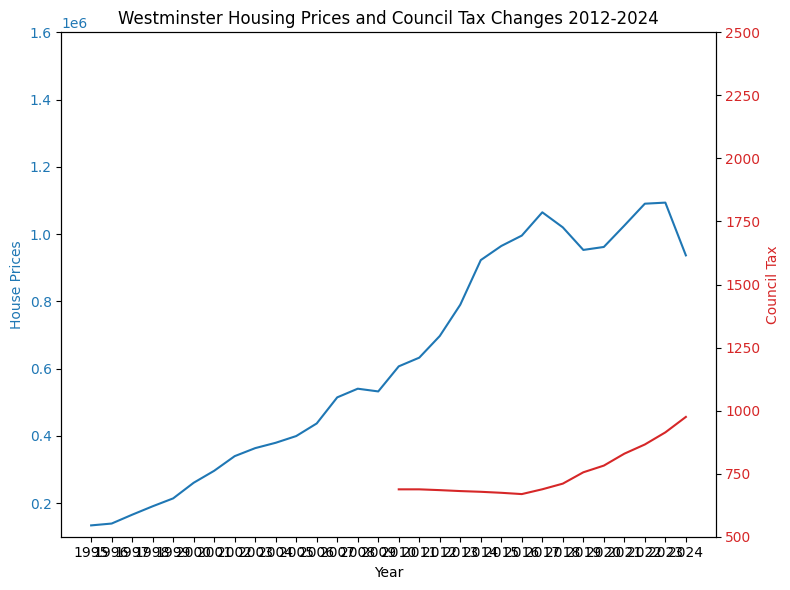

In [168]:
house_prices = df_avgprice_yearly_t_v.loc['Westminster']
council_tax = df_tax_r_v.loc['Westminster']

plot_housing_and_tax_data(house_prices, council_tax, 'Westminster')

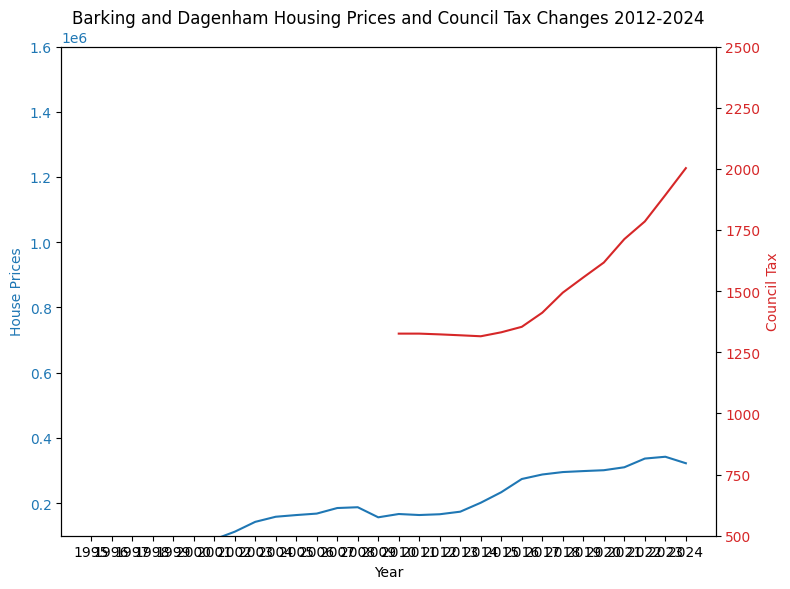

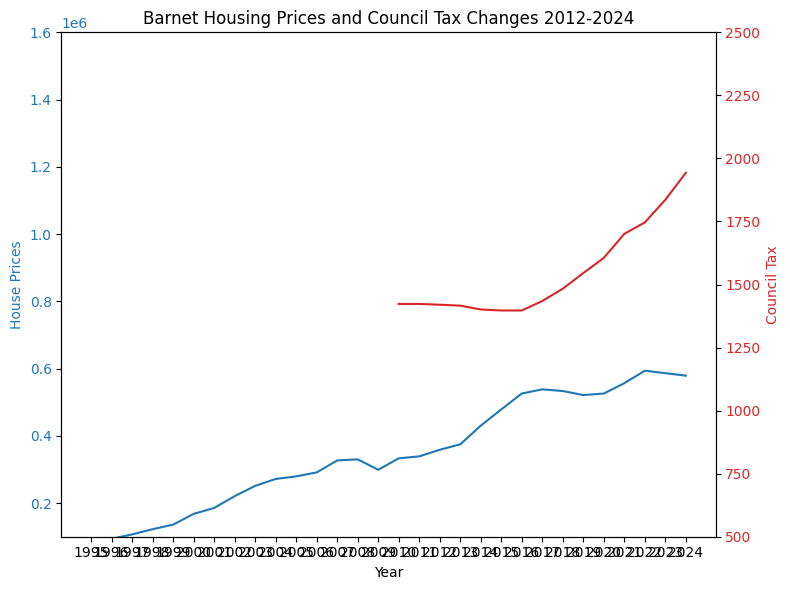

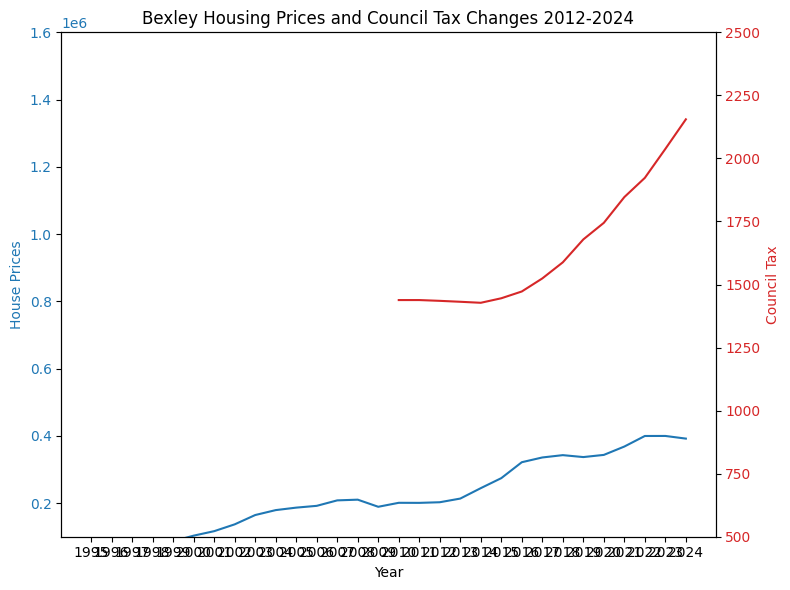

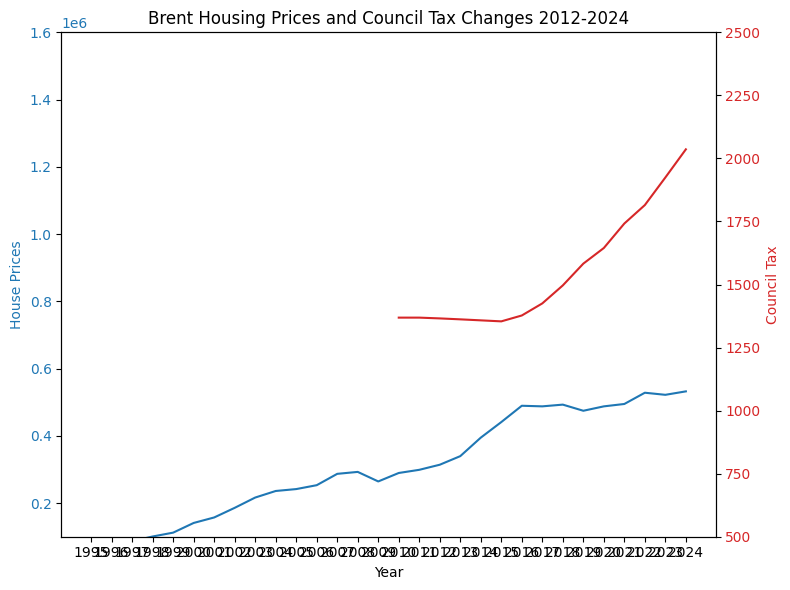

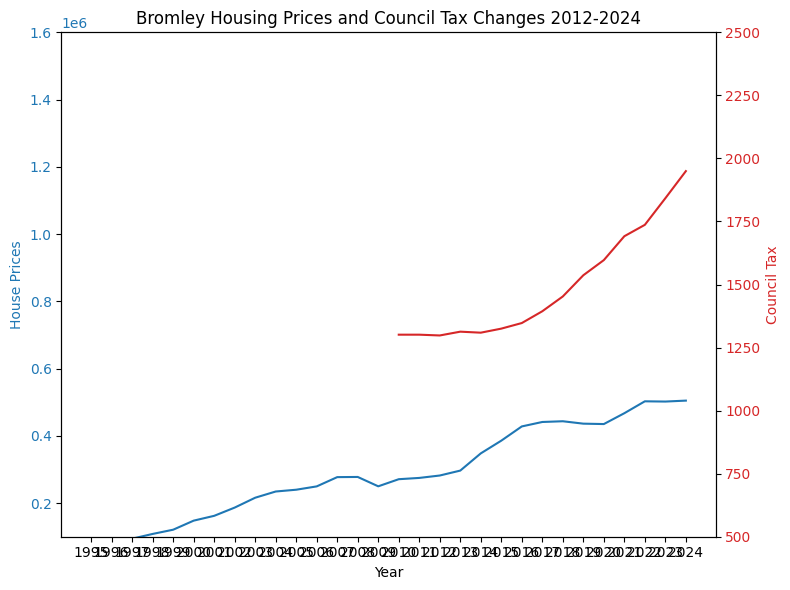

...

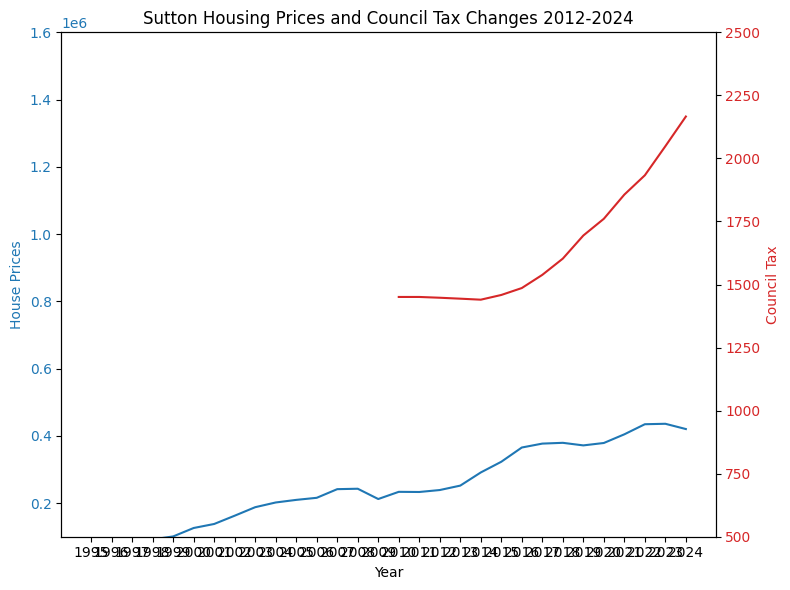

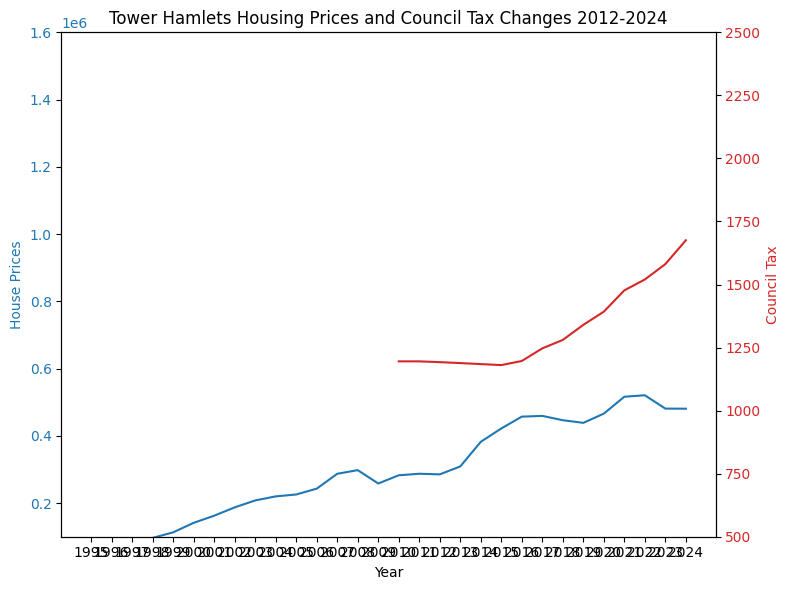

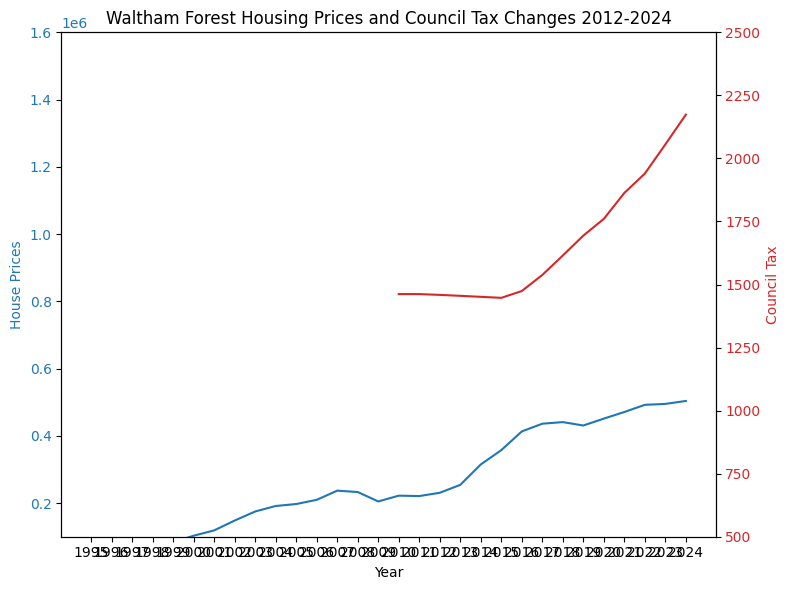

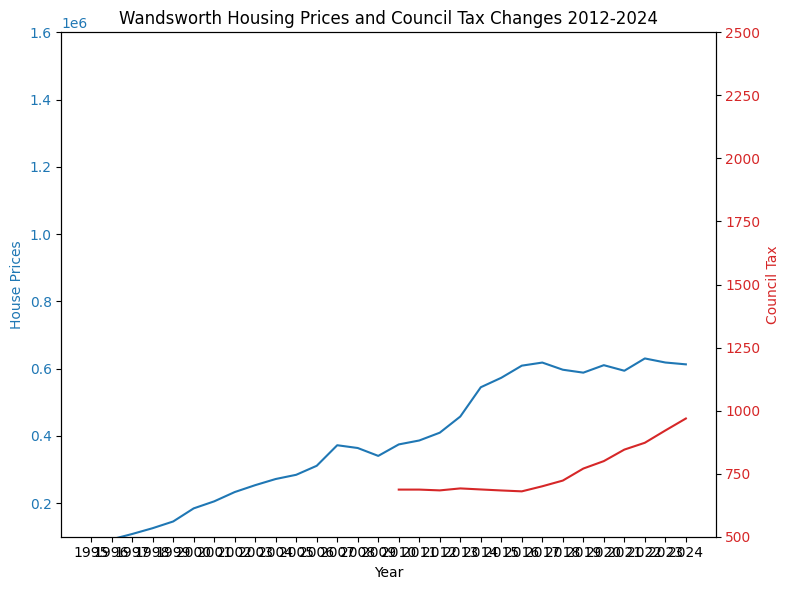

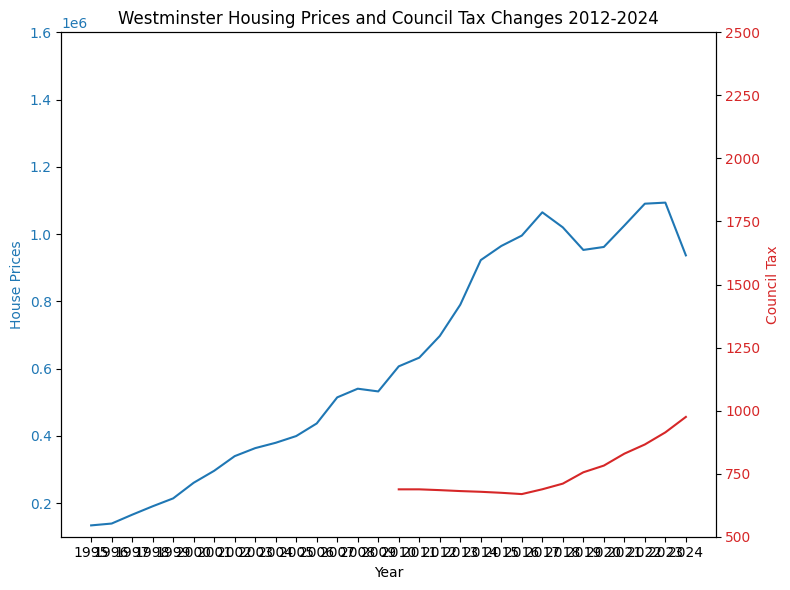

In [169]:
boroughs = borough_names
for borough in boroughs:
    house_prices = df_avgprice_yearly_t_v.loc[borough]
    council_tax = df_tax_r_v.loc[borough]
    plot_housing_and_tax_data(house_prices, council_tax, borough)

<br>
<br>

#### 2. Variation in Council Tax Across Different Boroughs from 2010 to 2024

Council tax in 2024

In [170]:
df_tax_2024 = pd.read_excel('Dataset/Council Tax/council-tax-bands-borough.xlsx', sheet_name=1)
df_tax_2024.head()

,Code,Local authority,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,E09000001,City of London,811.926667,947.247778,1082.568889,1217.89,1488.532222,1759.174444,2029.816667,2435.78
2,E09000002,Barking & Dagenham,1335.166667,1557.694444,1780.222222,2002.75,2447.805556,2892.861111,3337.916667,4005.50
3,E09000003,Barnet,1295.493333,1511.408889,1727.324444,1943.24,2375.071111,2806.902222,3238.733333,3886.48
4,E09000004,Bexley,1436.693333,1676.142222,1915.591111,2155.04,2633.937778,3112.835556,3591.733333,4310.08


In [171]:
df_tax_2024.drop(index=0, inplace=True)
df_tax_2024.drop(columns='Code', inplace=True)
df_tax_2024.reset_index(drop=True, inplace=True)

df_tax_2024.head()

,Local authority,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,City of London,811.926667,947.247778,1082.568889,1217.89,1488.532222,1759.174444,2029.816667,2435.78
1,Barking & Dagenham,1335.166667,1557.694444,1780.222222,2002.75,2447.805556,2892.861111,3337.916667,4005.50
2,Barnet,1295.493333,1511.408889,1727.324444,1943.24,2375.071111,2806.902222,3238.733333,3886.48
3,Bexley,1436.693333,1676.142222,1915.591111,2155.04,2633.937778,3112.835556,3591.733333,4310.08
4,Brent,1357.366667,1583.594444,1809.822222,2036.05,2488.505556,2940.961111,3393.416667,4072.10


In [172]:
df_tax_2024.rename(columns={'Local authority': 'borough'}, inplace=True)

df_tax_2024.head()

,borough,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,City of London,811.926667,947.247778,1082.568889,1217.89,1488.532222,1759.174444,2029.816667,2435.78
1,Barking & Dagenham,1335.166667,1557.694444,1780.222222,2002.75,2447.805556,2892.861111,3337.916667,4005.50
2,Barnet,1295.493333,1511.408889,1727.324444,1943.24,2375.071111,2806.902222,3238.733333,3886.48
3,Bexley,1436.693333,1676.142222,1915.591111,2155.04,2633.937778,3112.835556,3591.733333,4310.08
4,Brent,1357.366667,1583.594444,1809.822222,2036.05,2488.505556,2940.961111,3393.416667,4072.10


In [173]:
columns_to_clean = ['borough']
replacements = {',': '', '&': 'and', '-': ' '}

df_tax_2024 = clean_data(df_tax_2024, columns_to_clean, replacements)

df_tax_2024.head()

,borough,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,City of London,811.926667,947.247778,1082.568889,1217.89,1488.532222,1759.174444,2029.816667,2435.78
1,Barking and Dagenham,1335.166667,1557.694444,1780.222222,2002.75,2447.805556,2892.861111,3337.916667,4005.50
2,Barnet,1295.493333,1511.408889,1727.324444,1943.24,2375.071111,2806.902222,3238.733333,3886.48
3,Bexley,1436.693333,1676.142222,1915.591111,2155.04,2633.937778,3112.835556,3591.733333,4310.08
4,Brent,1357.366667,1583.594444,1809.822222,2036.05,2488.505556,2940.961111,3393.416667,4072.10


In [174]:
df_tax_2024.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   borough  33 non-null     object 
 1   Band A   33 non-null     float64
 2   Band B   33 non-null     float64
 3   Band C   33 non-null     float64
 4   Band D   33 non-null     float64
 5   Band E   33 non-null     float64
 6   Band F   33 non-null     float64
 7   Band G   33 non-null     float64
 8   Band H   33 non-null     float64
dtypes: float64(8), object(1)
memory usage: 2.4+ KB


In [175]:
df_tax_2024_bandD = df_tax_2024[['borough', 'Band D']]

In [176]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")
gdf = gdf.rename(columns={"NAME": "borough"}) 

In [177]:
gdf_tax_2024 = gdf.merge(df_tax_2024_bandD, on='borough')

gdf_tax_2024.head()

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Band D
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",2375.35
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",2366.91
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",1949.71
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",1991.01
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",1948.34


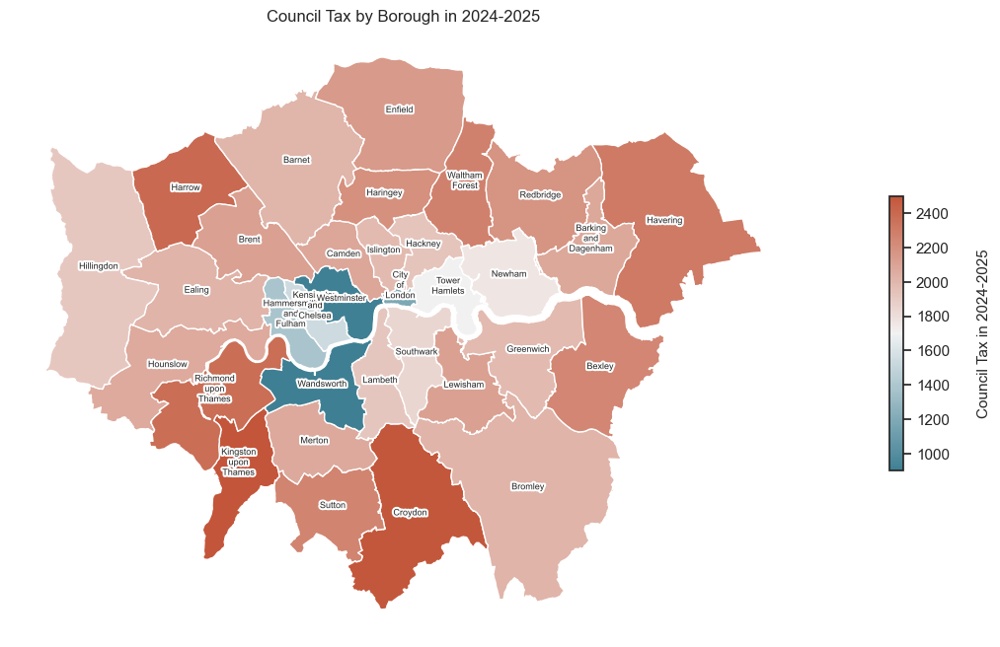

In [178]:
# Set seaborn style
sns.set(style="white")

cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Create figure and axis objects
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Plot the geospatial data using the reversed colormap
gdf_tax_2024.plot(column='Band D', ax=ax, legend=False, cmap=cmap)

# Compute centroids for placing borough names accurately
gdf_tax_2024['centroid'] = gdf_tax_2024.geometry.centroid

# Add borough names on each polygon
for idx, row in gdf_tax_2024.iterrows():
    name = row['borough']
    centroid = row['centroid']
    # Ensure the centroid is within the polygon for text placement
    if not row['geometry'].contains(centroid):
        centroid = row['geometry'].representative_point()
    if len(name) > 10:  # Display in two lines if name length exceeds 10
        name = name.replace(" ", "\n")
    plt.text(s=name, x=centroid.x, y=centroid.y,
             horizontalalignment='center', fontsize=6.5,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a gradient color legend
norm = Normalize(vmin=900, vmax=2500)
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Add colorbar, place it on the right side of the map
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', aspect=20, shrink=0.6, pad=0.1, fraction=0.015)
cbar.set_label('Council Tax in 2024-2025', size=11, labelpad=20)
    
# Set title and hide axes
plt.title('Council Tax by Borough in 2024-2025', size=12)
ax.set_axis_off()

plt.show()

Council Tax in 2010

In [179]:
df_tax_2010 = pd.read_excel('Dataset/Council Tax/council-tax-bands-borough.xlsx', sheet_name=15)
df_tax_2010.drop(index=0, inplace=True)
df_tax_2010.drop(columns='Code', inplace=True)
df_tax_2010.reset_index(drop=True, inplace=True)

df_tax_2010.rename(columns={'Local authority': 'borough'}, inplace=True)

columns_to_clean = ['borough']
replacements = {',': '', '&': 'and', '-': ' '}
df_tax_2010 = clean_data(df_tax_2010, columns_to_clean, replacements)

df_tax_2010.head()

,borough,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,City of London,633.533333,739.122222,844.711111,950.30,1161.477778,1372.655556,1583.833333,1900.60
1,Barking and Dagenham,884.146667,1031.504444,1178.862222,1326.22,1620.935556,1915.651111,2210.366667,2652.44
2,Barnet,948.680000,1106.793333,1264.906667,1423.02,1739.246667,2055.473333,2371.700000,2846.04
3,Bexley,958.940000,1118.763333,1278.586667,1438.41,1758.056667,2077.703333,2397.350000,2876.82
4,Brent,912.506667,1064.591111,1216.675556,1368.76,1672.928889,1977.097778,2281.266667,2737.52


In [180]:
df_tax_2010_bandD = df_tax_2010[['borough', 'Band D']]

In [181]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")
gdf = gdf.rename(columns={"NAME": "borough"}) 

gdf_tax_2010 = gdf.merge(df_tax_2010_bandD, on='borough')
gdf_tax_2010.head()

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Band D
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",1662.54
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",1459.93
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",1301.13
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",1400.47
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",1369.75


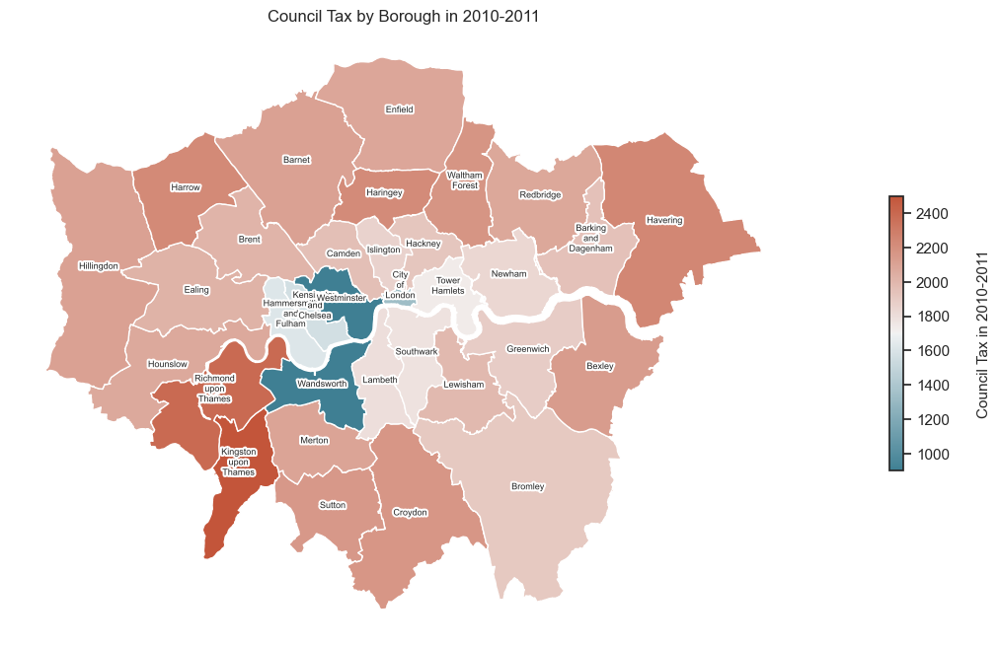

In [182]:
# Set seaborn style
sns.set(style="white")

cmap = sns.diverging_palette(220, 20, as_cmap=True)

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

gdf_tax_2010.plot(column='Band D', ax=ax, legend=False, cmap=cmap)

# Compute centroids for placing borough names accurately
gdf_tax_2010['centroid'] = gdf_tax_2010.geometry.centroid

# Add borough names on each polygon
for idx, row in gdf_tax_2010.iterrows():
    name = row['borough']
    centroid = row['centroid']
    # Ensure the centroid is within the polygon for text placement
    if not row['geometry'].contains(centroid):
        centroid = row['geometry'].representative_point()
    if len(name) > 10:  # Display in two lines if name length exceeds 10
        name = name.replace(" ", "\n")
    plt.text(s=name, x=centroid.x, y=centroid.y,
             horizontalalignment='center', fontsize=6.5,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a gradient color legend
norm = Normalize(vmin=900, vmax=2500)
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Add colorbar, place it on the right side of the map
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', aspect=20, shrink=0.6, pad=0.1, fraction=0.015)
cbar.set_label('Council Tax in 2010-2011', size=11, labelpad=20)
    
# Set title and hide axes
plt.title('Council Tax by Borough in 2010-2011', size=12)
ax.set_axis_off()

plt.show()

In [183]:
excel_file_path = 'Dataset/Council Tax/council-tax-bands-borough.xlsx'
geo_file_path = "Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp"

In [184]:
xls = pd.ExcelFile(excel_file_path)
print(xls.sheet_names)

['Metadata', '2024-25', '2023-24', '2022-23', '2021-22', '2020-21', '2019-20', '2018-19', '2017-18', '2016-17', '2015-16', '2014-15', '2013-14', '2012-13', '2011-12', '2010-11', '2009-10', '2008-09', '2007-08', '2006-07', '2005-06', '2004-05', '2003-04', '2002-03', '2001-02', '2000-01', '1999-00']


In [185]:
def read_and_clean_data(file_path, sheet_year):
    # Maps years to sheet numbers in an Excel file
    sheet_map = {
        2024: 1, 2023: 2, 2022: 3, 2021: 4,
        2020: 5, 2019: 6, 2018: 7, 2017: 8,
        2016: 9, 2015: 10, 2014: 11, 2013: 12,
        2012: 13, 2011: 14, 2010: 15
    }
    df = pd.read_excel(file_path, sheet_name=sheet_map[sheet_year])
    df.drop(index=0, inplace=True)  # Remove the first row, usually headers or unwanted data
    df.drop(columns='Code', inplace=True)  # Remove the 'Code' column
    df.reset_index(drop=True, inplace=True)
    df.rename(columns={'Local authority': 'borough'}, inplace=True)
    # Assuming clean_data is defined elsewhere
    df = clean_data(df, ['borough'], {',': '', '&': 'and', '-': ' '})
    df_bandD = df[['borough', 'Band D']]
    return df_bandD

In [186]:
def merge_geodata_with_tax(geo_file_path, df_tax):
    gdf = gpd.read_file(geo_file_path)
    gdf = gdf.rename(columns={"NAME": "borough"})
    gdf_tax = gdf.merge(df_tax, on='borough')
    return gdf_tax

In [187]:
def plot_council_tax(gdf_tax, year):
    sns.set(style="white")
    cmap = sns.diverging_palette(220, 20, as_cmap=True)
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    gdf_tax.plot(column='Band D', ax=ax, legend=False, cmap=cmap)
    gdf_tax['centroid'] = gdf_tax.geometry.centroid
    for idx, row in gdf_tax.iterrows():
        name = row['borough']
        centroid = row['centroid']
        if not row['geometry'].contains(centroid):
            centroid = row['geometry'].representative_point()
        if len(name) > 10:
            name = name.replace(" ", "\n")
        plt.text(s=name, x=centroid.x, y=centroid.y,
                 horizontalalignment='center', fontsize=6.5,
                 path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])
    norm = Normalize(vmin=900, vmax=2500)
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', aspect=20, shrink=0.6, pad=0.1, fraction=0.015)
    cbar.set_label('Council Tax in £ (Band D)', size=11, labelpad=20)
    plt.title(f'Council Tax by Borough in {year}-{year+1}', size=11)
    ax.set_axis_off()
    plt.show()

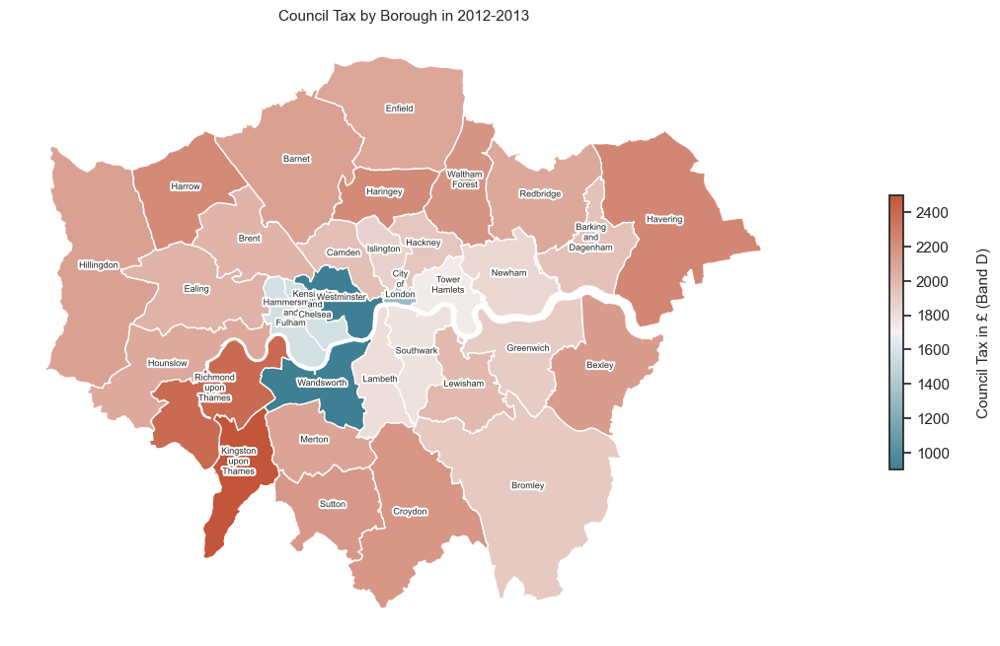

In [188]:
year = 2012

df_tax = read_and_clean_data(excel_file_path, year)
gdf_tax = merge_geodata_with_tax(geo_file_path, df_tax)
plot_council_tax(gdf_tax, year)

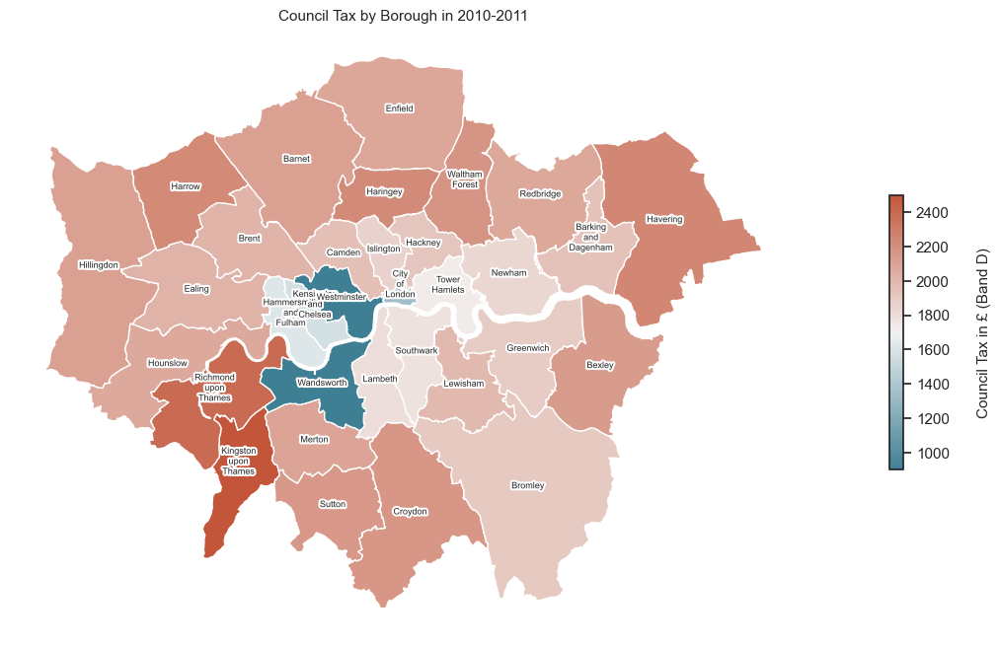

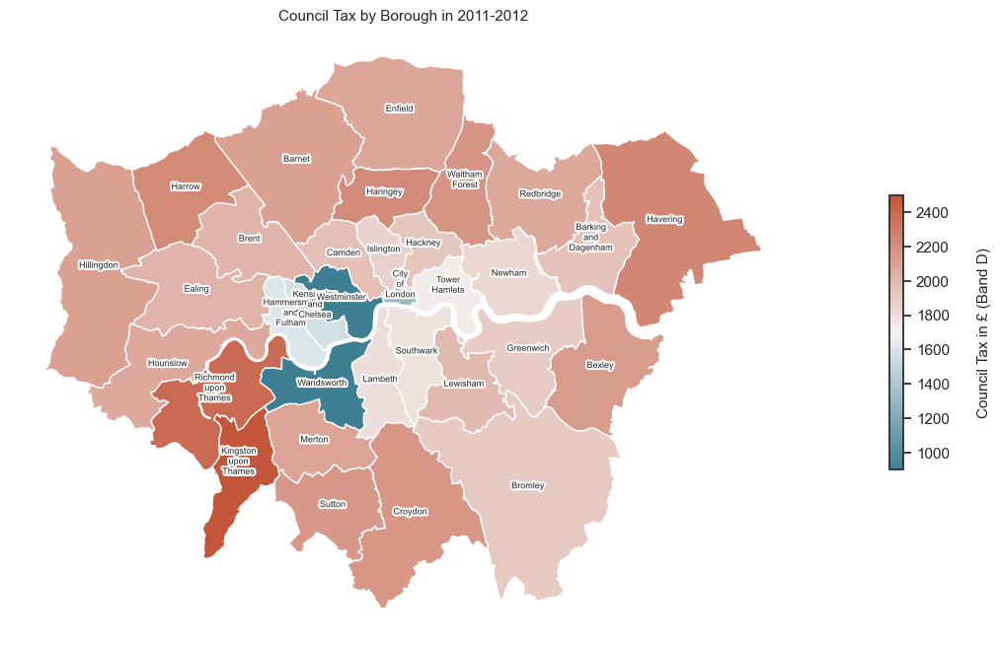

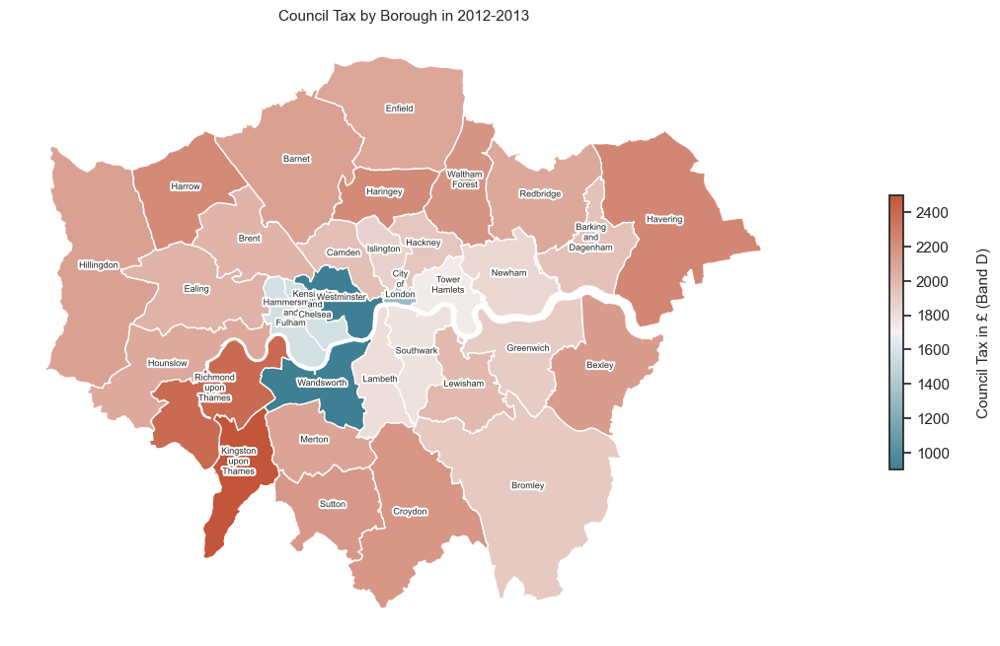

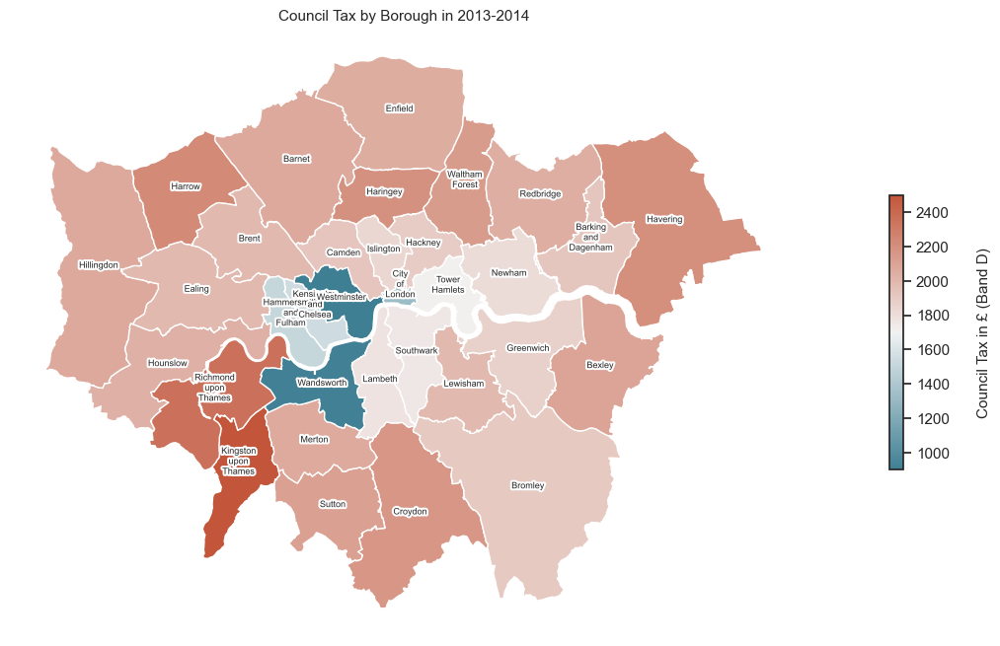

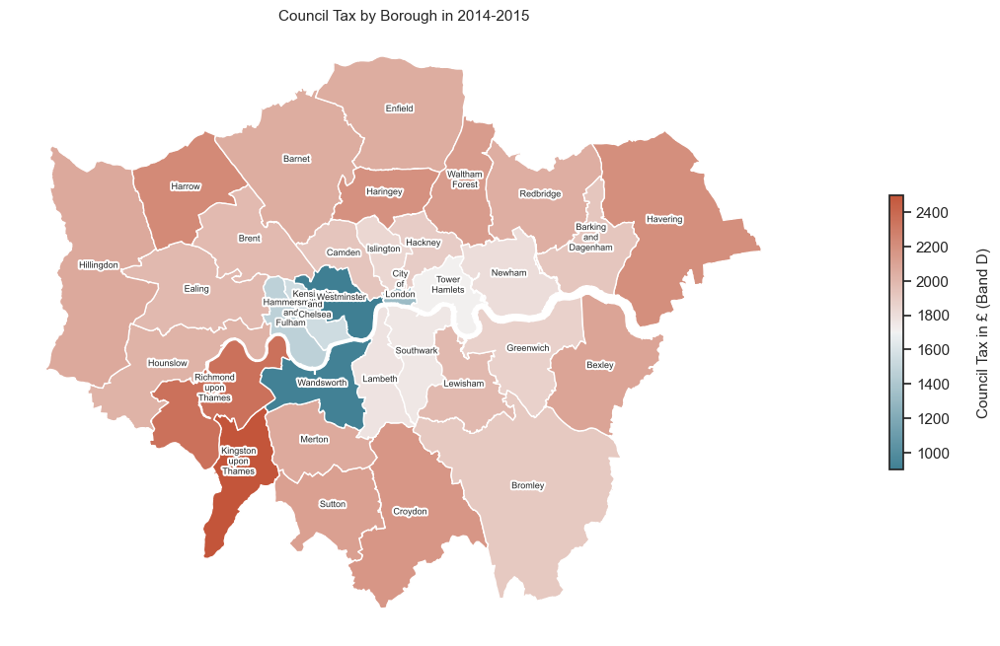

...

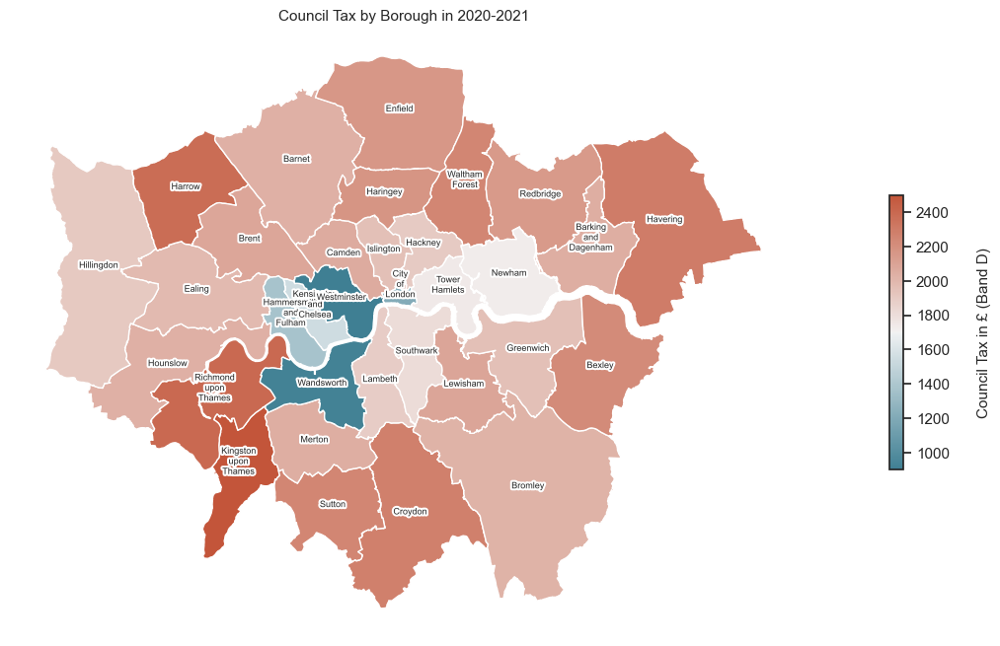

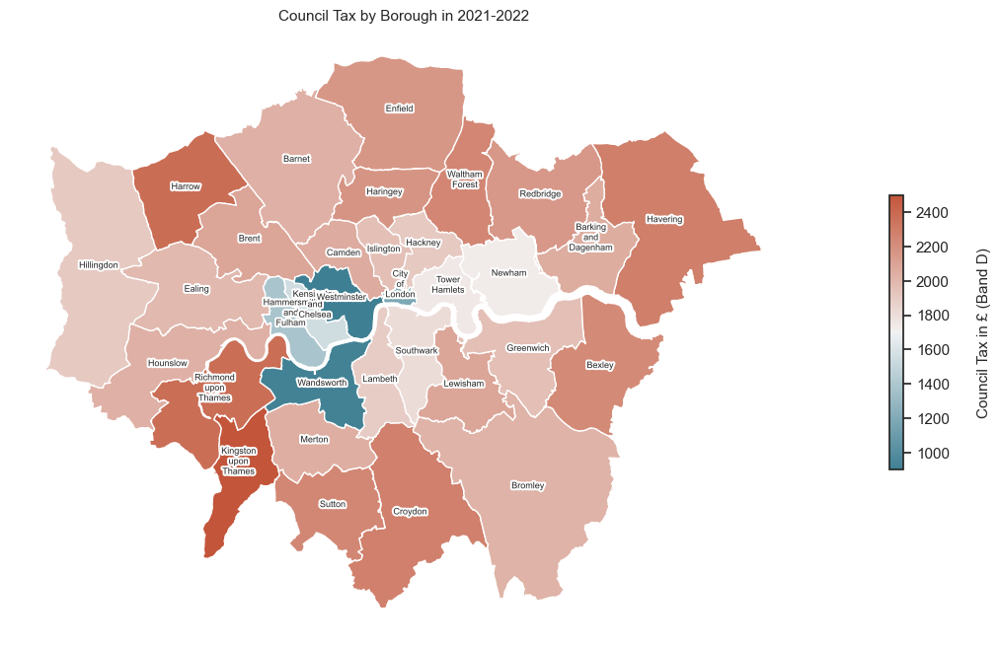

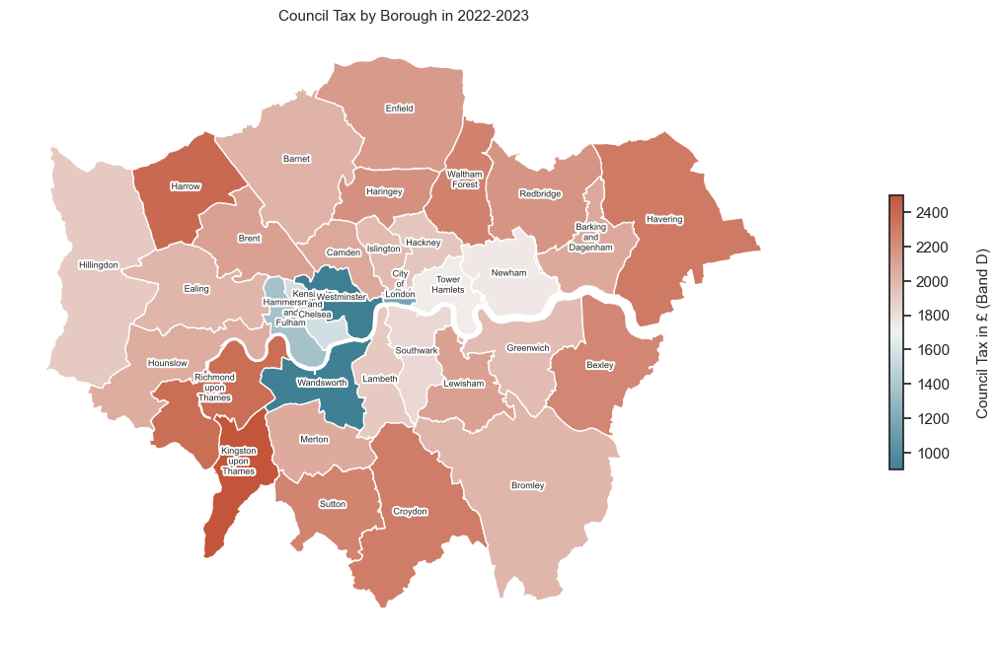

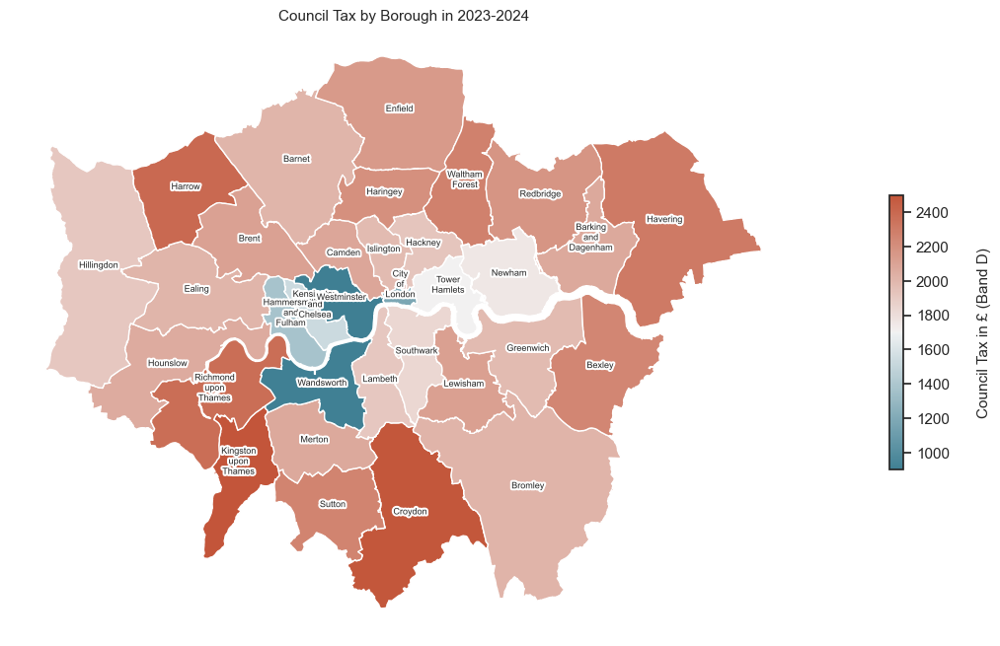

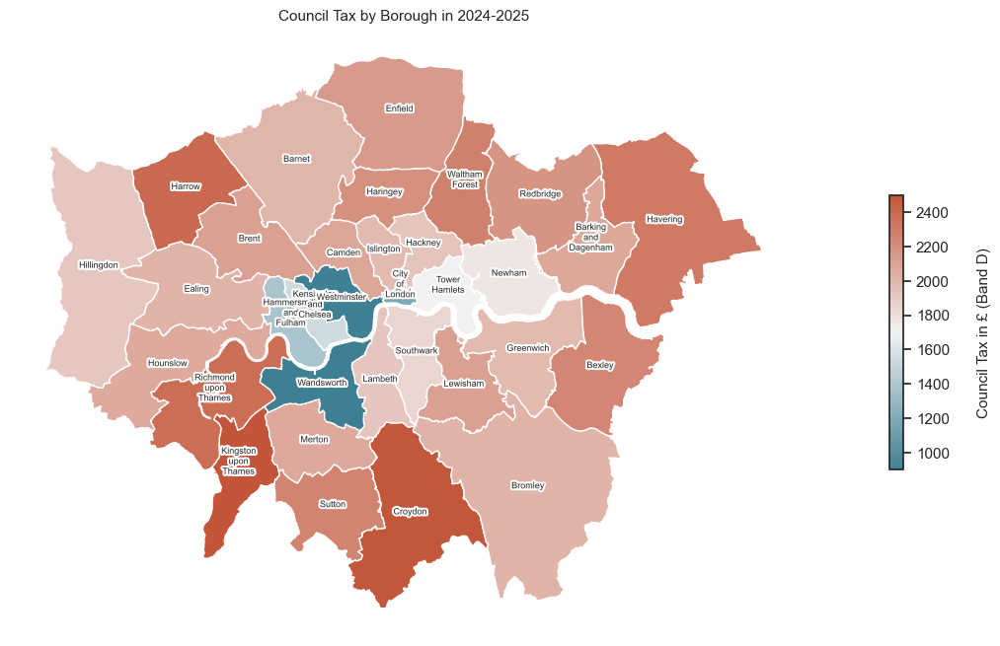

In [189]:
years = range(2010, 2025)
for year in years:
    df_tax = read_and_clean_data(excel_file_path, year)
    gdf_tax = merge_geodata_with_tax(geo_file_path, df_tax)
    plot_council_tax(gdf_tax, year)

The plots highlight distinct variations in Band D council tax rates across London boroughs from 2010 to 2024. Inner London boroughs, such as Westminster and Wandsworth, have maintained stable and relatively low rates. In contrast, outer London boroughs have seen more significant increases, a trend accentuated post-COVID-19 pandemic in 2022, with Croydon experiencing the sharpest rise. Throughout the period, Kingston upon Thames has consistently recorded the highest council tax rates among all boroughs. (plots from 2010 to 2024 can be found in Jupyter Notebook)

<br>
<br>

#### 4. Fairness of Council Tax

__a. Ratio of Council Tax to average housing price (2010-2024)__

In [190]:
df_tax_year.head()

,Code,Local authority,2024-2025,2023-2024,2022-2023,2021-2022,2020-2021,2019-2020,2018-2019,2017-2018,2016-2017,2015-2016,2014-2015,2013-2014,2012-2013,2011-2012,2010-2011
0,E09000001,City of London,1217.89,1145.64,1074.57,1049.44,1007.19,972.66,933.41,931.20,931.20,943.44,941.79,943.39,935.93,939.18,950.30
1,E09000002,Barking and Dagenham,2002.75,1892.71,1784.83,1712.57,1616.87,1556.01,1493.86,1411.85,1354.03,1331.67,1315.40,1319.40,1323.12,1326.22,1326.22
2,E09000003,Barnet,1943.24,1836.17,1746.29,1700.99,1605.84,1545.41,1483.57,1434.72,1397.07,1397.07,1401.07,1416.20,1419.92,1423.02,1423.02
3,E09000004,Bexley,2155.04,2037.76,1922.99,1846.72,1744.64,1678.88,1588.04,1524.19,1472.43,1445.53,1427.59,1431.59,1435.31,1438.41,1438.41
4,E09000005,Brent,2036.05,1924.45,1815.07,1741.92,1644.81,1582.85,1496.54,1425.18,1377.24,1353.94,1357.94,1361.94,1365.66,1368.76,1368.76


In [191]:
df_avgprice_yearly_t.head()

,borough,1995,1996,1997,1998,1999,2000,2001,2002,2003,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,99085.008156,105651.057557,117113.442375,148031.894542,171300.061875,218679.025542,250625.554442,269632.243283,270811.450892,...,760253.019233,818315.551142,849790.096133,784808.908635,796386.7026,828132.232692,823334.75,934270.333333,870618.25,715466.0
1,Barking and Dagenham,51817.96939,51718.19269,55974.262309,60285.821083,65320.934441,77549.51329,88664.058223,112221.912482,142498.9278,...,233460.107425,273919.636042,287734.717358,295196.673612,298207.102333,300836.133975,309894.416667,336574.916667,342141.583333,322220.0
2,Barnet,91792.537433,94000.445448,106883.185546,122359.468033,136004.512067,167952.633958,185563.3526,220746.059225,251212.927683,...,478687.949875,525939.5773,538281.017008,533266.534055,521293.325225,525757.268125,556596.083333,593797.333333,586345.666667,579029.0
3,Bexley,64291.532845,65490.417234,70789.406603,80632.020822,86777.715903,103186.665184,116527.13475,136797.964475,164482.038908,...,274209.280967,321563.508775,335694.468958,342603.605654,336872.501558,343326.448458,368176.5,399580.25,399684.583333,391782.0
4,Brent,73029.84184,75235.918367,86749.070663,100692.590417,112157.469808,140962.500458,157287.404625,185898.147992,216501.757008,...,440951.665383,489469.418367,487703.754375,492845.371253,474597.716283,487681.147733,494764.5,528224.333333,522013.416667,532273.0


In [192]:
# Merge data and add a '_merge' column to indicate the result of the merge
df_equal_1 = pd.merge(df_tax_r, df_avgprice_yearly_t, on='borough', suffixes=('_tax', '_price'), how='outer', indicator=True)

# Identify boroughs that did not match in both datasets
unmatched_boroughs = df_equal_1[df_equal_1['_merge'] != 'both']

# Print unmatched boroughs and indicate which dataset they come from
print("Unmatched boroughs:")
print(unmatched_boroughs[['borough', '_merge']])

# Optionally, show boroughs that are only in df_tax_r1 or only in df_avgprice_yearly_t
print("\nUnmatched boroughs from df_tax_r1:")
print(unmatched_boroughs[unmatched_boroughs['_merge'] == 'left_only']['borough'])

print("\nUnmatched boroughs from df_avgprice_yearly_t:")
print(unmatched_boroughs[unmatched_boroughs['_merge'] == 'right_only']['borough'])

Unmatched boroughs:
Empty DataFrame
Columns: [borough, _merge]
Index: []

Unmatched boroughs from df_tax_r1:
Series([], Name: borough, dtype: object)

Unmatched boroughs from df_avgprice_yearly_t:
Series([], Name: borough, dtype: object)


In [193]:
df_ratios_1 = df_equal_1[['borough']].copy()

for year in range(2010, 2025):
    year_tax = str(year) + '_tax'
    year_price = str(year) + '_price'
    if year_tax in df_equal_1 and year_price in df_equal_1:
        df_ratios_1[str(year)] = df_equal_1[year_tax] / df_equal_1[year_price]

df_ratios_1.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,0.002095,0.002024,0.001782,0.001655,0.001328,0.001241,0.001138,0.001096,0.001189,0.001221,0.001216,0.001275,0.00115,0.001316,0.001702
1,Barking and Dagenham,0.007962,0.008113,0.007977,0.007594,0.006539,0.005704,0.004943,0.004907,0.005061,0.005218,0.005375,0.005526,0.005303,0.005532,0.006215
2,Barnet,0.004272,0.004198,0.003959,0.003779,0.003256,0.002919,0.002656,0.002665,0.002782,0.002965,0.003054,0.003056,0.002941,0.003132,0.003356
3,Bexley,0.007161,0.007168,0.007086,0.006706,0.00584,0.005272,0.004579,0.00454,0.004635,0.004984,0.005082,0.005016,0.004813,0.005098,0.005501
4,Brent,0.004727,0.004578,0.004348,0.00401,0.003441,0.00307,0.002814,0.002922,0.003037,0.003335,0.003373,0.003521,0.003436,0.003687,0.003825


In [194]:
df_ratios_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   borough  33 non-null     object
 1   2010     33 non-null     object
 2   2011     33 non-null     object
 3   2012     33 non-null     object
 4   2013     33 non-null     object
 5   2014     33 non-null     object
 6   2015     33 non-null     object
 7   2016     33 non-null     object
 8   2017     33 non-null     object
 9   2018     33 non-null     object
 10  2019     33 non-null     object
 11  2020     33 non-null     object
 12  2021     33 non-null     object
 13  2022     33 non-null     object
 14  2023     33 non-null     object
 15  2024     33 non-null     object
dtypes: object(16)
memory usage: 4.3+ KB


In [195]:
df_long = df_ratios_1.melt(id_vars='borough', var_name='Year', value_name='Ratio')

In [196]:
# Define the year groups
def year_group(year):
    year = int(year)
    if year <= 2014:
        return '2010-2014'
    elif year <= 2019:
        return '2015-2019'
    elif year <= 2022:
        return '2020-2022'
    else:
        return '2023-2024'

# Apply the grouping function
df_long['Year Group'] = df_long['Year'].apply(year_group)

# Calculate the average for each group
df_grouped = df_long.groupby(['borough', 'Year Group']).mean().reset_index()

# Reshape the results back to wide format
df_pivot = df_grouped.pivot(index='borough', columns='Year Group', values='Ratio').reset_index()

# Rename columns to clearly indicate they represent average ratios
df_pivot.columns.name = None  # Clear the column index name
df_pivot.rename(columns=lambda x: x if x == 'borough' else x, inplace=True)

df_pivot.head()

,borough,2010-2014,2015-2019,2020-2022,2023-2024
0,Barking and Dagenham,0.007637,0.005166,0.005401,0.005874
1,Barnet,0.003893,0.002797,0.003017,0.003244
2,Bexley,0.006792,0.004802,0.00497,0.0053
3,Brent,0.004221,0.003036,0.003443,0.003756
4,Bromley,0.004465,0.003308,0.003582,0.003766


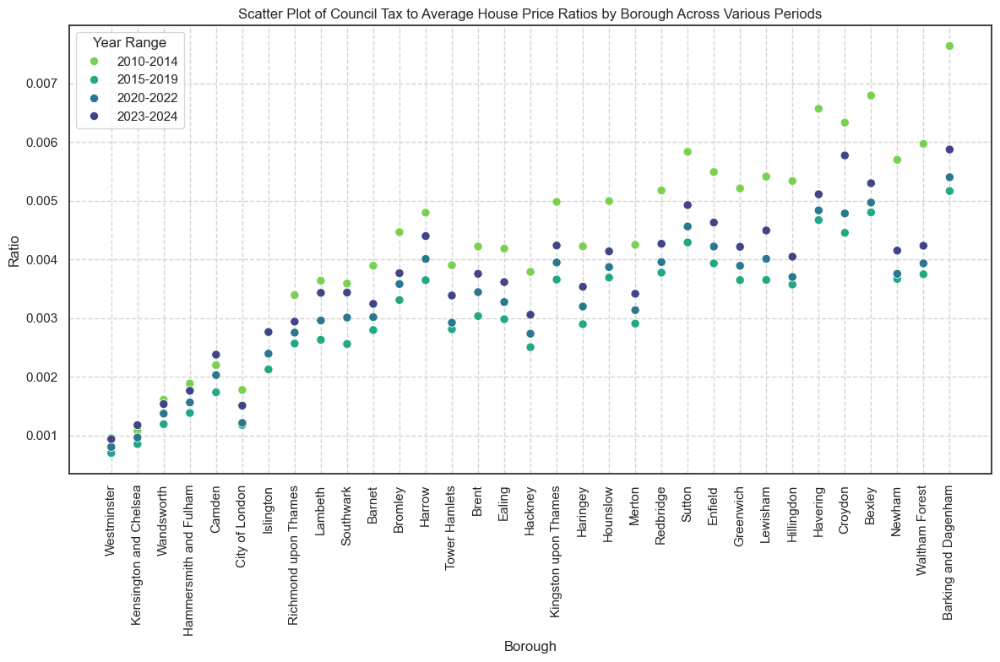

In [197]:
# Calculating the standard deviation of the ratios across all periods for each borough
df_pivot['diff'] = df_pivot[['2010-2014', '2015-2019', '2020-2022', '2023-2024']].std(axis=1)

# Sorting by the calculated difference (standard deviation) - smaller values indicate less variability
df_pivot_sorted = df_pivot.sort_values(by='diff', ascending=True)

# Melting the DataFrame for easier plotting with Seaborn
df_melted = df_pivot_sorted.melt(id_vars=["borough", "diff"], var_name="Year", value_name="Ratio")

# Defining a custom color palette
colors = sns.color_palette("viridis", n_colors=4)[::-1]

# Plotting using Seaborn with the custom color palette
plt.figure(figsize=(12, 8))
ax = sns.scatterplot(data=df_melted, x="borough", y="Ratio", hue="Year", palette=colors, s=55)
ax.set_title('Scatter Plot of Council Tax to Average House Price Ratios by Borough Across Various Periods')
ax.set_xlabel('Borough')
ax.set_ylabel('Ratio')
plt.xticks(rotation=90)
plt.legend(title="Year Range")
plt.grid(True, color='lightgray', linestyle='--')
plt.tight_layout()
plt.show()

The boroughs are ordered by the standard deviation. A higher ratio indicated a greater financial burden on residents. Overall, compared to the period from 2010-2014, the burden of council tax has decreased, partly due to subsidies from local governments during the pandemic period (2020-2022). In terms of individual boroughs, Westminster and Kensington & Chelsea showed stability in the ratios, while Barking and Dagenham, and Waltham Forest experienced significant changes in the ratios.

<br>

In [198]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")
gdf = gdf.rename(columns={"NAME": "borough"})

gdf_merged = gdf.merge(df_ratios_1[['borough', '2024']], on='borough', how='left')
gdf_merged

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,2024
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",0.004391
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",0.00603
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",0.003863
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",0.00432
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",0.003781
5,Havering,E09000016,11445.735,210.763,F,None,None,"POLYGON ((549893.900 181459.800, 549894.600 18...",0.005266
6,Hillingdon,E09000017,11570.063,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510615.200 19...",0.004214
7,Harrow,E09000015,5046.330,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510660.000 19...",0.004547
8,Brent,E09000005,4323.270,0.000,F,None,None,"POLYGON ((525201.000 182512.600, 525181.500 18...",0.003825
9,Barnet,E09000003,8674.837,0.000,F,None,None,"POLYGON ((524579.900 198355.200, 524594.300 19...",0.003356


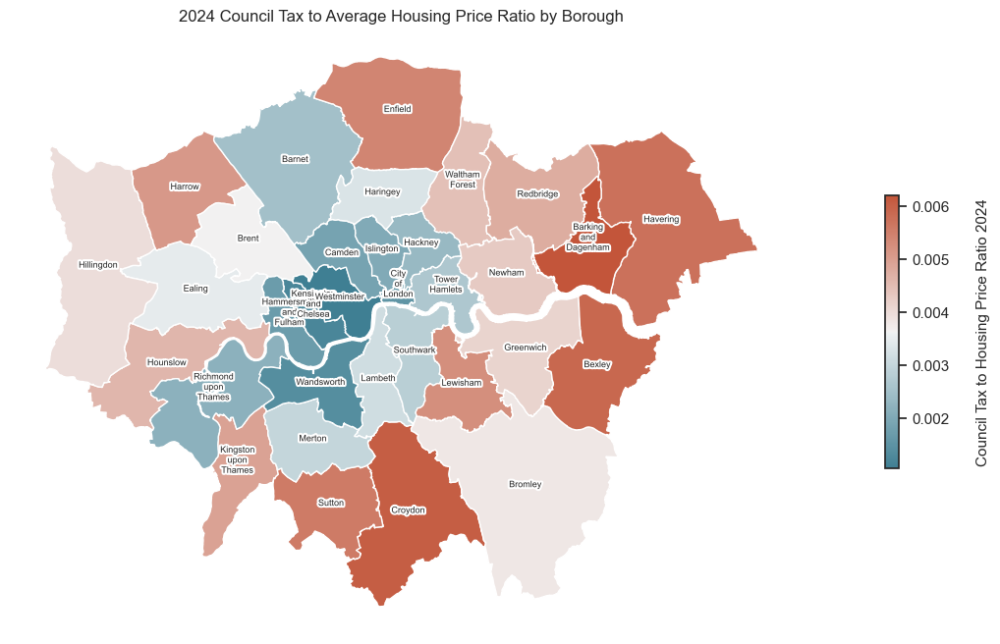

In [199]:
# Set seaborn style
sns.set(style="white")

cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Create figure and axis objects
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Plot the geospatial data using the reversed colormap
gdf_merged.plot(column='2024', ax=ax, legend=False, cmap=cmap)

# Compute centroids for placing borough names accurately
gdf_merged['centroid'] = gdf_merged.geometry.centroid

# Add borough names on each polygon
for idx, row in gdf_merged.iterrows():
    name = row['borough']
    centroid = row['centroid']
    # Ensure the centroid is within the polygon for text placement
    if not row['geometry'].contains(centroid):
        centroid = row['geometry'].representative_point()
    if len(name) > 10:  # Display in two lines if name length exceeds 10
        name = name.replace(" ", "\n")
    plt.text(s=name, x=centroid.x, y=centroid.y,
             horizontalalignment='center', fontsize=6.5,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a gradient color legend
norm = Normalize(vmin=gdf_merged['2024'].min(), vmax=gdf_merged['2024'].max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Add colorbar, place it on the right side of the map
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', aspect=20, shrink=0.6, pad=0.1, fraction=0.015)
cbar.set_label('Council Tax to Housing Price Ratio 2024', size=11, labelpad=20)
    
# Set title and hide axes
plt.title('2024 Council Tax to Average Housing Price Ratio by Borough', size=12)
ax.set_axis_off()

plt.show()

Boroughs located on the outer eastern side of London bear a significant burden.

<br>

__b. Ratio of Council Tax to average taxpayer income (2010-2021)__

In [200]:
df_tax_r.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,950.30,939.18,935.93,943.39,941.79,943.44,931.20,931.20,933.41,972.66,1007.19,1049.44,1074.57,1145.64,1217.89
1,Barking and Dagenham,1326.22,1326.22,1323.12,1319.40,1315.40,1331.67,1354.03,1411.85,1493.86,1556.01,1616.87,1712.57,1784.83,1892.71,2002.75
2,Barnet,1423.02,1423.02,1419.92,1416.20,1401.07,1397.07,1397.07,1434.72,1483.57,1545.41,1605.84,1700.99,1746.29,1836.17,1943.24
3,Bexley,1438.41,1438.41,1435.31,1431.59,1427.59,1445.53,1472.43,1524.19,1588.04,1678.88,1744.64,1846.72,1922.99,2037.76,2155.04
4,Brent,1368.76,1368.76,1365.66,1361.94,1357.94,1353.94,1377.24,1425.18,1496.54,1582.85,1644.81,1741.92,1815.07,1924.45,2036.05


In [201]:
df_tax_r2 = df_tax_r.copy()
df_tax_r2 = df_tax_r.iloc[:, :13]

df_tax_r2.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,City of London,950.30,939.18,935.93,943.39,941.79,943.44,931.20,931.20,933.41,972.66,1007.19,1049.44
1,Barking and Dagenham,1326.22,1326.22,1323.12,1319.40,1315.40,1331.67,1354.03,1411.85,1493.86,1556.01,1616.87,1712.57
2,Barnet,1423.02,1423.02,1419.92,1416.20,1401.07,1397.07,1397.07,1434.72,1483.57,1545.41,1605.84,1700.99
3,Bexley,1438.41,1438.41,1435.31,1431.59,1427.59,1445.53,1472.43,1524.19,1588.04,1678.88,1744.64,1846.72
4,Brent,1368.76,1368.76,1365.66,1361.94,1357.94,1353.94,1377.24,1425.18,1496.54,1582.85,1644.81,1741.92


In [202]:
df_avg_income.head()

,borough,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020,2020-2021,2021-2022
0,City of London,10000,109800,40400,10000,137000,65000,12000,92900,38300,11000,78700,37000
1,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,16200,67000,19100,17000
2,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,18700,150000,32300,19700
3,Bexley,105000,20500,17200,116000,19800,17300,112000,22000,18300,114000,21500,17800
4,Brent,122000,20000,16500,130000,22200,16800,127000,21100,16500,116000,21700,16400


In [203]:
df_income_r = df_avg_income.copy()

years = [str(year) for year in range(2010, 2022)]
df_income_r.columns = ['borough'] + years

df_income_r.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,City of London,10000,109800,40400,10000,137000,65000,12000,92900,38300,11000,78700,37000
1,Barking and Dagenham,62000,16200,15100,71000,18100,15600,56000,18600,16200,67000,19100,17000
2,Barnet,161000,26800,18700,156000,30800,19400,159000,30400,18700,150000,32300,19700
3,Bexley,105000,20500,17200,116000,19800,17300,112000,22000,18300,114000,21500,17800
4,Brent,122000,20000,16500,130000,22200,16800,127000,21100,16500,116000,21700,16400


In [204]:
df_income_r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   borough  33 non-null     object
 1   2010     33 non-null     int64 
 2   2011     33 non-null     int64 
 3   2012     33 non-null     int64 
 4   2013     33 non-null     int64 
 5   2014     33 non-null     int64 
 6   2015     33 non-null     int64 
 7   2016     33 non-null     int64 
 8   2017     33 non-null     int64 
 9   2018     33 non-null     int64 
 10  2019     33 non-null     int64 
 11  2020     33 non-null     int64 
 12  2021     33 non-null     int64 
dtypes: int64(12), object(1)
memory usage: 3.5+ KB


In [205]:
# Merge data and add a '_merge' column to indicate the result of the merge
df_equal_2 = pd.merge(df_tax_r2, df_income_r, on='borough', suffixes=('_tax', '_price'), how='outer', indicator=True)

# Identify boroughs that did not match in both datasets
unmatched_boroughs = df_equal_2[df_equal_2['_merge'] != 'both']

print("Unmatched boroughs:")
print(unmatched_boroughs[['borough', '_merge']])

print("\nUnmatched boroughs from df_tax_r2:")
print(unmatched_boroughs[unmatched_boroughs['_merge'] == 'left_only']['borough'])

print("\nUnmatched boroughs from df_income_r:")
print(unmatched_boroughs[unmatched_boroughs['_merge'] == 'right_only']['borough'])

Unmatched boroughs:
Empty DataFrame
Columns: [borough, _merge]
Index: []

Unmatched boroughs from df_tax_r2:
Series([], Name: borough, dtype: object)

Unmatched boroughs from df_income_r:
Series([], Name: borough, dtype: object)


In [206]:
df_ratios_2 = df_equal_2[['borough']].copy()

for year in range(2010, 2025):
    year_tax = str(year) + '_tax'
    year_price = str(year) + '_price'
    if year_tax in df_equal_2 and year_price in df_equal_2:
        df_ratios_2[str(year)] = df_equal_2[year_tax] / df_equal_2[year_price]

df_ratios_2.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,City of London,0.095030,0.008554,0.023167,0.094339,0.006874,0.014514,0.077600,0.010024,0.024371,0.088424,0.012798,0.028363
1,Barking and Dagenham,0.021391,0.081865,0.087624,0.018583,0.072674,0.085363,0.024179,0.075906,0.092214,0.023224,0.084653,0.100739
2,Barnet,0.008839,0.053098,0.075932,0.009078,0.045489,0.072014,0.008787,0.047195,0.079335,0.010303,0.049716,0.086345
3,Bexley,0.013699,0.070166,0.083448,0.012341,0.072101,0.083557,0.013147,0.069281,0.086778,0.014727,0.081146,0.103748
4,Brent,0.011219,0.068438,0.082767,0.010476,0.061168,0.080592,0.010844,0.067544,0.090699,0.013645,0.075798,0.106215


In [207]:
df_ratios_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   borough  33 non-null     object 
 1   2010     33 non-null     float64
 2   2011     33 non-null     float64
 3   2012     33 non-null     float64
 4   2013     33 non-null     float64
 5   2014     33 non-null     float64
 6   2015     33 non-null     float64
 7   2016     33 non-null     float64
 8   2017     33 non-null     float64
 9   2018     33 non-null     float64
 10  2019     33 non-null     float64
 11  2020     33 non-null     float64
 12  2021     33 non-null     float64
dtypes: float64(12), object(1)
memory usage: 3.5+ KB


In [208]:
df_long_2 = df_ratios_2.melt(id_vars='borough', var_name='Year', value_name='Ratio')

In [209]:
# Define the year groups
def year_group(year):
    year = int(year)
    if year <= 2014:
        return '2010-2014'
    elif year <= 2019:
        return '2015-2019'
    else:
        return '2020-2021'

# Apply the grouping function
df_long_2['Year Group'] = df_long_2['Year'].apply(year_group)

# Calculate the average for each group
df_grouped_2 = df_long_2.groupby(['borough', 'Year Group']).mean().reset_index()

# Reshape the results back to wide format
df_pivot_2 = df_grouped_2.pivot(index='borough', columns='Year Group', values='Ratio').reset_index()

# Rename columns to clearly indicate they represent average ratios
df_pivot_2.columns.name = None  # Clear the column index name
df_pivot_2.rename(columns=lambda x: x if x == 'borough' else x, inplace=True)

df_pivot_2.head()

,borough,2010-2014,2015-2019,2020-2021
0,Barking and Dagenham,0.056427,0.060177,0.092696
1,Barnet,0.038487,0.043527,0.068031
2,Bexley,0.050351,0.053498,0.092447
3,Brent,0.046814,0.052665,0.091006
4,Bromley,0.037487,0.042542,0.070901


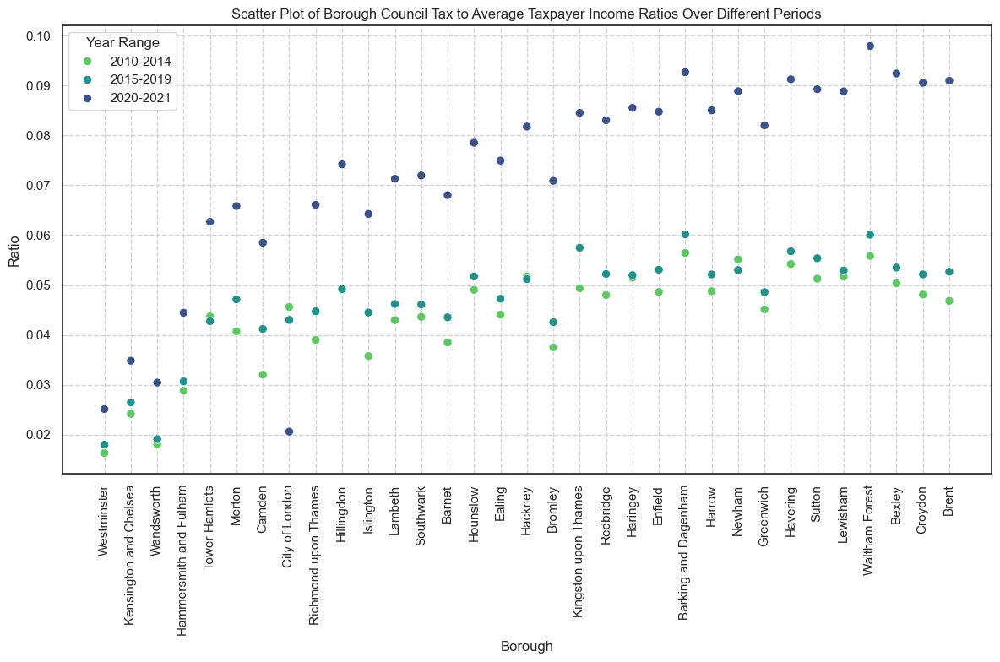

In [210]:
# Calculating the standard deviation of the ratios across all periods for each borough
df_pivot_2['diff'] = df_pivot_2[['2010-2014', '2015-2019', '2020-2021']].std(axis=1)

# Sorting by the calculated difference (standard deviation) - smaller values indicate less variability
df_pivot_2_sorted = df_pivot_2.sort_values(by='diff', ascending=True)

# Melting the DataFrame for easier plotting with Seaborn
df_melted_2 = df_pivot_2_sorted.melt(id_vars=["borough", "diff"], var_name="Year", value_name="Ratio")

# Defining a custom color palette with three colors for the three time periods
colors = sns.color_palette("viridis", n_colors=3)[::-1]

# Plotting using Seaborn with the custom color palette
plt.figure(figsize=(12, 8))
ax = sns.scatterplot(data=df_melted_2, x="borough", y="Ratio", hue="Year", palette=colors, s=55)
ax.set_title('Scatter Plot of Borough Council Tax to Average Taxpayer Income Ratios Over Different Periods')
ax.set_xlabel('Borough')
ax.set_ylabel('Ratio')
plt.xticks(rotation=90)
plt.legend(title="Year Range")
plt.grid(True, color='lightgray', linestyle='--')
plt.tight_layout()
plt.show()

The boroughs are organized by the standard deviation. Overall, the tax burden has been increasing annually. In 2021, council tax in Waltham Forest accounted for 0.1% of the average income, which is five times higher than in the City of London. Although areas with higher incomes should ostensibly pay more tax, the plots demonstrate that this is not consistently the case.

In [211]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")
gdf = gdf.rename(columns={"NAME": "borough"})

gdf_merged_2 = gdf.merge(df_ratios_2[['borough', '2021']], on='borough', how='left')
gdf_merged_2

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,2021
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",0.099383
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",0.104897
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",0.084155
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",0.091518
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",0.088077
5,Havering,E09000016,11445.735,210.763,F,None,None,"POLYGON ((549893.900 181459.800, 549894.600 18...",0.103459
6,Hillingdon,E09000017,11570.063,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510615.200 19...",0.085286
7,Harrow,E09000015,5046.330,0.000,F,None,None,"POLYGON ((510599.800 191689.500, 510660.000 19...",0.101153
8,Brent,E09000005,4323.270,0.000,F,None,None,"POLYGON ((525201.000 182512.600, 525181.500 18...",0.106215
9,Barnet,E09000003,8674.837,0.000,F,None,None,"POLYGON ((524579.900 198355.200, 524594.300 19...",0.086345


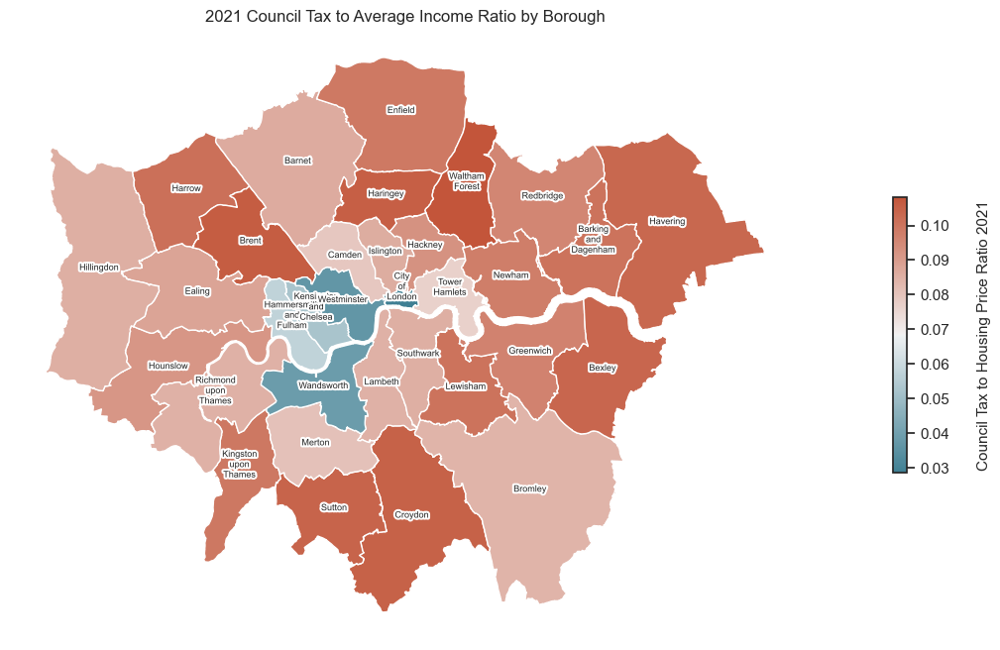

In [212]:
# Set seaborn style
sns.set(style="white")

# Define the color map using reversed colors
cmap = sns.diverging_palette(220, 20, as_cmap=True)

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

gdf_merged_2.plot(column='2021', ax=ax, legend=False, cmap=cmap)

# Compute centroids for placing borough names accurately
gdf_merged['centroid'] = gdf_merged.geometry.centroid

# Add borough names on each polygon
for idx, row in gdf_merged.iterrows():
    name = row['borough']
    centroid = row['centroid']
    # Ensure the centroid is within the polygon for text placement
    if not row['geometry'].contains(centroid):
        centroid = row['geometry'].representative_point()
    if len(name) > 10:  # Display in two lines if name length exceeds 10
        name = name.replace(" ", "\n")
    plt.text(s=name, x=centroid.x, y=centroid.y,
             horizontalalignment='center', fontsize=6.5,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a color gradient legend
norm = Normalize(vmin=gdf_merged_2['2021'].min(), vmax=gdf_merged_2['2021'].max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Necessary for the colorbar to work correctly

# Add a colorbar to the right of the map
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', aspect=20, shrink=0.6, pad=0.1, fraction=0.015)
cbar.set_label('Council Tax to Housing Price Ratio 2021', size=11, labelpad=20)

# Set the title and hide the axes
plt.title('2021 Council Tax to Average Income Ratio by Borough', size=12)
ax.set_axis_off()

# Display the plot
plt.show()

Boroughs in outer London face a heavier tax burden, while the city center of London bears the least. 

<br>

#### c.	Tax Pressure Index

In [213]:
df_ratios_1.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,City of London,0.002095,0.002024,0.001782,0.001655,0.001328,0.001241,0.001138,0.001096,0.001189,0.001221,0.001216,0.001275,0.00115,0.001316,0.001702
1,Barking and Dagenham,0.007962,0.008113,0.007977,0.007594,0.006539,0.005704,0.004943,0.004907,0.005061,0.005218,0.005375,0.005526,0.005303,0.005532,0.006215
2,Barnet,0.004272,0.004198,0.003959,0.003779,0.003256,0.002919,0.002656,0.002665,0.002782,0.002965,0.003054,0.003056,0.002941,0.003132,0.003356
3,Bexley,0.007161,0.007168,0.007086,0.006706,0.00584,0.005272,0.004579,0.00454,0.004635,0.004984,0.005082,0.005016,0.004813,0.005098,0.005501
4,Brent,0.004727,0.004578,0.004348,0.00401,0.003441,0.00307,0.002814,0.002922,0.003037,0.003335,0.003373,0.003521,0.003436,0.003687,0.003825


In [214]:
df_ratios_2.head()

,borough,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,City of London,0.095030,0.008554,0.023167,0.094339,0.006874,0.014514,0.077600,0.010024,0.024371,0.088424,0.012798,0.028363
1,Barking and Dagenham,0.021391,0.081865,0.087624,0.018583,0.072674,0.085363,0.024179,0.075906,0.092214,0.023224,0.084653,0.100739
2,Barnet,0.008839,0.053098,0.075932,0.009078,0.045489,0.072014,0.008787,0.047195,0.079335,0.010303,0.049716,0.086345
3,Bexley,0.013699,0.070166,0.083448,0.012341,0.072101,0.083557,0.013147,0.069281,0.086778,0.014727,0.081146,0.103748
4,Brent,0.011219,0.068438,0.082767,0.010476,0.061168,0.080592,0.010844,0.067544,0.090699,0.013645,0.075798,0.106215


In [215]:
df_ratios_1_index = df_ratios_1[['borough', '2021']]
df_ratios_1_index.rename(columns={'2021': 'average housing price'}, inplace=True)
df_ratios_2_index = df_ratios_2[['borough', '2021']]
df_ratios_2_index.rename(columns={'2021': 'average income'}, inplace=True)

In [216]:
# def standardize(series):
#     return (series - series.mean()) / series.std()

# df_ratios_1_index['average housing price_Std'] = df_ratios_1_index['average housing price'].transform(standardize)
# df_ratios_2_index['average income_Std'] = df_ratios_2_index['average income'].transform(standardize)

In [217]:
# df_ratios_1_index.head()

In [218]:
# df_ratios_2_index.head()

In [219]:
df_index = pd.merge(df_ratios_1_index, df_ratios_2_index, on='borough')
df_index.head()

,borough,average housing price,average income
0,City of London,0.001275,0.028363
1,Barking and Dagenham,0.005526,0.100739
2,Barnet,0.003056,0.086345
3,Bexley,0.005016,0.103748
4,Brent,0.003521,0.106215


In [220]:
df_index['Tax_Pressure_Index'] = df_index['average housing price'] * df_index['average income'] *1000

df_index.head()

,borough,average housing price,average income,Tax_Pressure_Index
0,City of London,0.001275,0.028363,0.036152
1,Barking and Dagenham,0.005526,0.100739,0.556716
2,Barnet,0.003056,0.086345,0.263874
3,Bexley,0.005016,0.103748,0.520387
4,Brent,0.003521,0.106215,0.37395


In [221]:
min_value = df_index['Tax_Pressure_Index'].min()
max_value = df_index['Tax_Pressure_Index'].max()

df_index['Normalized_Tax_Pressure_Index'] = 1 + 9 * ((df_index['Tax_Pressure_Index'] - min_value) / (max_value - min_value))

In [222]:
df_index.to_csv('tax_pressure_Index_index.csv', index=False)

plot on the map

In [223]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")
gdf = gdf.rename(columns={"NAME": "borough"})

gdf_index = gdf.merge(df_index[['borough', 'Normalized_Tax_Pressure_Index']], on='borough', how='left')
gdf_index.head()

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Normalized_Tax_Pressure_Index
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",7.317559
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",9.140412
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",5.697254
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",6.580894
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",5.44815


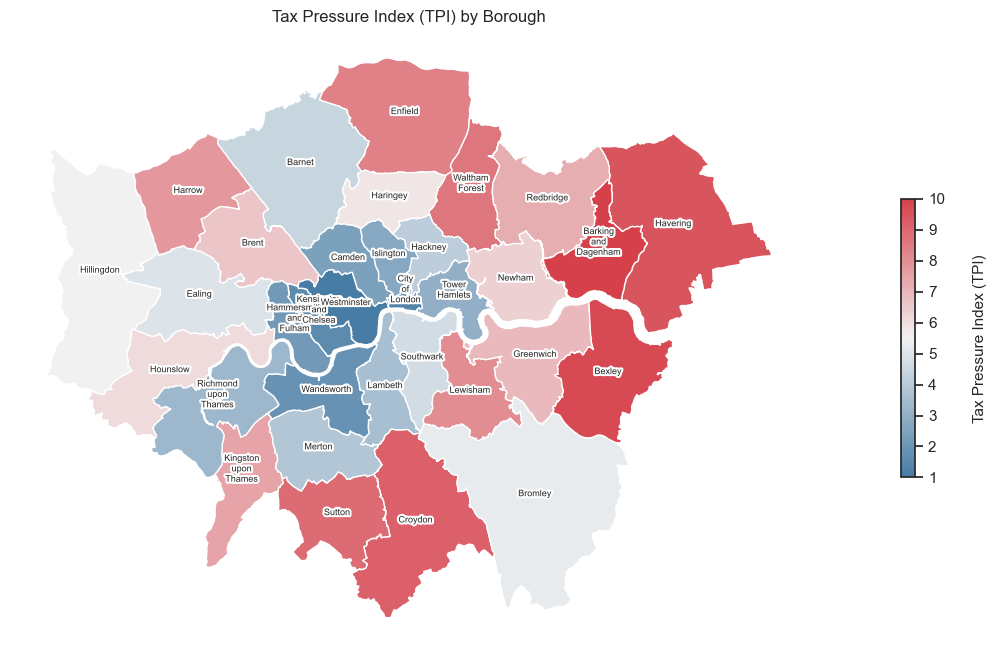

In [224]:
# Define the color map using reversed colors
cmap = sns.diverging_palette(240, 10, s=70, l=50, as_cmap=True)

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

gdf_index.plot(column='Normalized_Tax_Pressure_Index', ax=ax, legend=False, cmap=cmap)

# Compute centroids for placing borough names accurately
gdf_index['centroid'] = gdf_index.geometry.centroid

# Add borough names on each polygon
for idx, row in gdf_index.iterrows():
    name = row['borough']
    centroid = row['centroid']
    # Ensure the centroid is within the polygon for text placement
    if not row['geometry'].contains(centroid):
        centroid = row['geometry'].representative_point()
    if len(name) > 10:  # Display in two lines if name length exceeds 10
        name = name.replace(" ", "\n")
    plt.text(s=name, x=centroid.x, y=centroid.y,
             horizontalalignment='center', fontsize=6.5,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a color gradient legend
norm = Normalize(vmin=gdf_index['Normalized_Tax_Pressure_Index'].min(), vmax=gdf_index['Normalized_Tax_Pressure_Index'].max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
# Add a colorbar to the right of the map
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', aspect=20, shrink=0.6, pad=0.1, fraction=0.015)
cbar.set_label('Tax Pressure Index (TPI)', size=11, labelpad=20)

# Set the title and hide the axes
plt.title('Tax Pressure Index (TPI) by Borough', size=12)
ax.set_axis_off()

# Display the plot
plt.show()

From the map, it is evident that wealthier areas like Central London experience the lowest tax burdens. Conversely, poorer boroughs such as Barking and Dagenham, Bexley, and Havering—located on the eastern side of London—bear the heaviest burdens. These areas should be considered for improvements in tax burden ratios to address disparities.

<br>
<br>
<br>

### 5. Corelation with Council Tax

In [225]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 40 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   borough                                                          33 non-null     object 
 1   Council Tax                                                      33 non-null     int32  
 2   population                                                       33 non-null     int32  
 3   0-18 ratio                                                       33 non-null     float64
 4   19-64 ratio                                                      33 non-null     float64
 5   65+ ratio                                                        33 non-null     float64
 6   White ratio                                                      33 non-null     float64
 7   Asian ratio                                   

In [226]:
# Exclude non-numeric columns by selecting only numeric columns
df_numeric = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr_matrix = df_numeric.corr()

band_d_corr = corr_matrix['Council Tax'].map(lambda x: round(x, 3))

# Sort the correlations by value
sorted_band_d_corr = band_d_corr.sort_values(ascending=False)

sorted_band_d_corr

Council Tax                                                        1.000
0-18 ratio                                                         0.671
Green and Blue Space                                               0.652
Semi-Detached House ratio                                          0.621
Small Business ratio                                               0.575
Owner Occupied                                                     0.549
Detached House ratio                                               0.490
Terraced House ratio                                               0.444
Bungalow ratio                                                     0.409
65+ ratio                                                          0.383
Annexe ratio                                                       0.337
Asian ratio                                                        0.261
Caravan/ Houseboat/ Mobile Home ratio                              0.230
population                                         

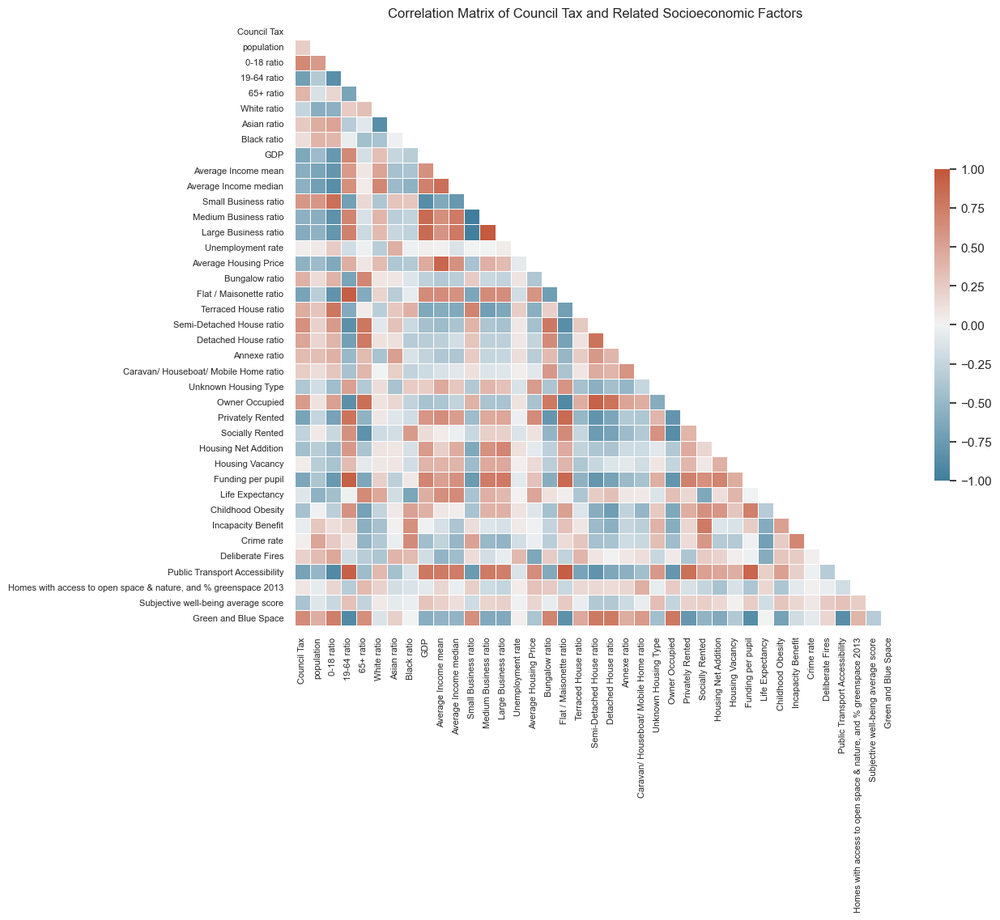

In [227]:
sns.set_theme(style="white")

corr = df.select_dtypes(include=[np.number]).corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns_heatmap = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Reduce the size of the axis labels
sns_heatmap.set_xticklabels(sns_heatmap.get_xticklabels(), fontsize=8)
sns_heatmap.set_yticklabels(sns_heatmap.get_yticklabels(), fontsize=8)

plt.title("Correlation Matrix of Council Tax and Related Socioeconomic Factors")

plt.show()

Counucil Tax was calculated base on the housing price; however, from the correlation matrix, the average housing price and council tax show negative relationship in different borough. In addition, borough has higher income(`Mean` and `Medium`) tend to pay less council tax. 


__Strong Positive Correlations (> 0.5)__  
`0-18 ratio`, `Green and Blue Space`, `Semi-detached houses` and `Small Businesses ratio`

Council tax rates are positively correlated with factors such as the percentage of `young residents`, `green and blue space`, `semi-detached houses`, and `small businesses` in an area. This suggests that affluent areas with higher property values and a family-oriented demographic tend to have higher council tax rates.  



__Strong Negative Correlations (< -0.5)__  
`Privately rent`, `Percentage of Flat/Maisonette`, `Public Transportation Accessibility`, `19-64 ratio`

Variables like `privately rent`, `percentage of Flat/ Maisonette`, `Public Transportation Accessibility` and `Percentage of 青壯年` has a strong negative correlation with council tax, indicating that areas with more rental properties, flats, better public transport accessibility, and larger working-age population tend to have lower council tax rates due to lower property values or different socio-economic demographics.

__Weak Correlations (~0)__
Factors such as `Crime rate` and `Unemployment rate` show very weak correlations with council tax,  suggesting that variations in these rates across boroughs do not significantly influence the council tax rate directly.

<br>

##### Clustering

In [228]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 40 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   borough                                                          33 non-null     object 
 1   Council Tax                                                      33 non-null     int32  
 2   population                                                       33 non-null     int32  
 3   0-18 ratio                                                       33 non-null     float64
 4   19-64 ratio                                                      33 non-null     float64
 5   65+ ratio                                                        33 non-null     float64
 6   White ratio                                                      33 non-null     float64
 7   Asian ratio                                   

In [229]:
df_cluster = df.copy()

In [230]:
# Select features that are highly correlated with "Council Tax"
df_cluster_1 = df_cluster[['borough', '0-18 ratio', 'Green and Blue Space', 'Semi-Detached House ratio', 
                         'Small Business ratio', 'Owner Occupied', 'Detached House ratio',
                         'Average Housing Price', 'Medium Business ratio', 'Average Income mean',
                         'Large Business ratio', 'GDP', 'Funding per pupil', 'Privately Rented',
                         'Flat / Maisonette ratio', 'Public Transport Accessibility', '19-64 ratio']]

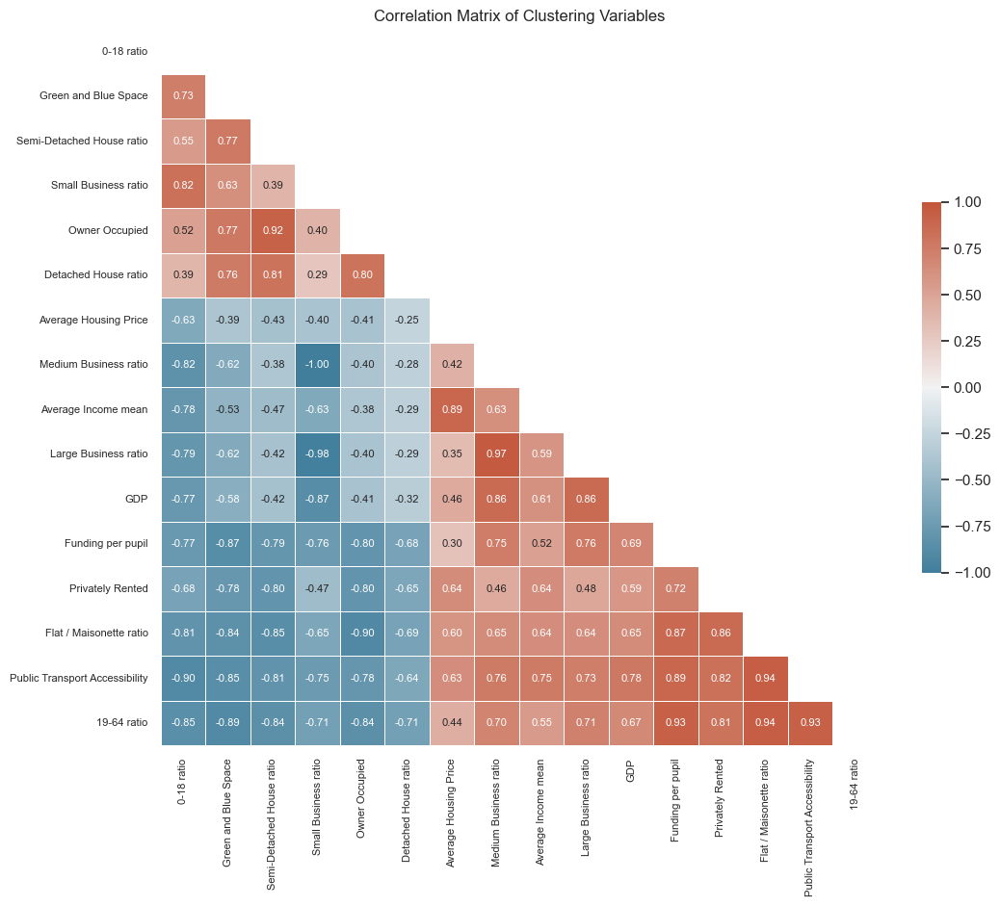

In [231]:
df_numeric_1 = df_cluster_1.select_dtypes(include=[np.number])

corr_matrix = df_numeric_1.corr()

# Set the plot theme to a white background
sns.set_theme(style="white")

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 10))

# Generate a custom diverging color palette
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns_heatmap = sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                          square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f",
                          annot_kws={"size": 8})

sns_heatmap.set_xticklabels(sns_heatmap.get_xticklabels(), fontsize=8)
sns_heatmap.set_yticklabels(sns_heatmap.get_yticklabels(), fontsize=8)

plt.title("Correlation Matrix of Clustering Variables")

plt.show()

In [232]:
df_cluster_2 = df_cluster[['borough', '0-18 ratio', 'Green and Blue Space', 'Owner Occupied', 'Average Housing Price',
                           'Large Business ratio', 'Flat / Maisonette ratio', '19-64 ratio']]

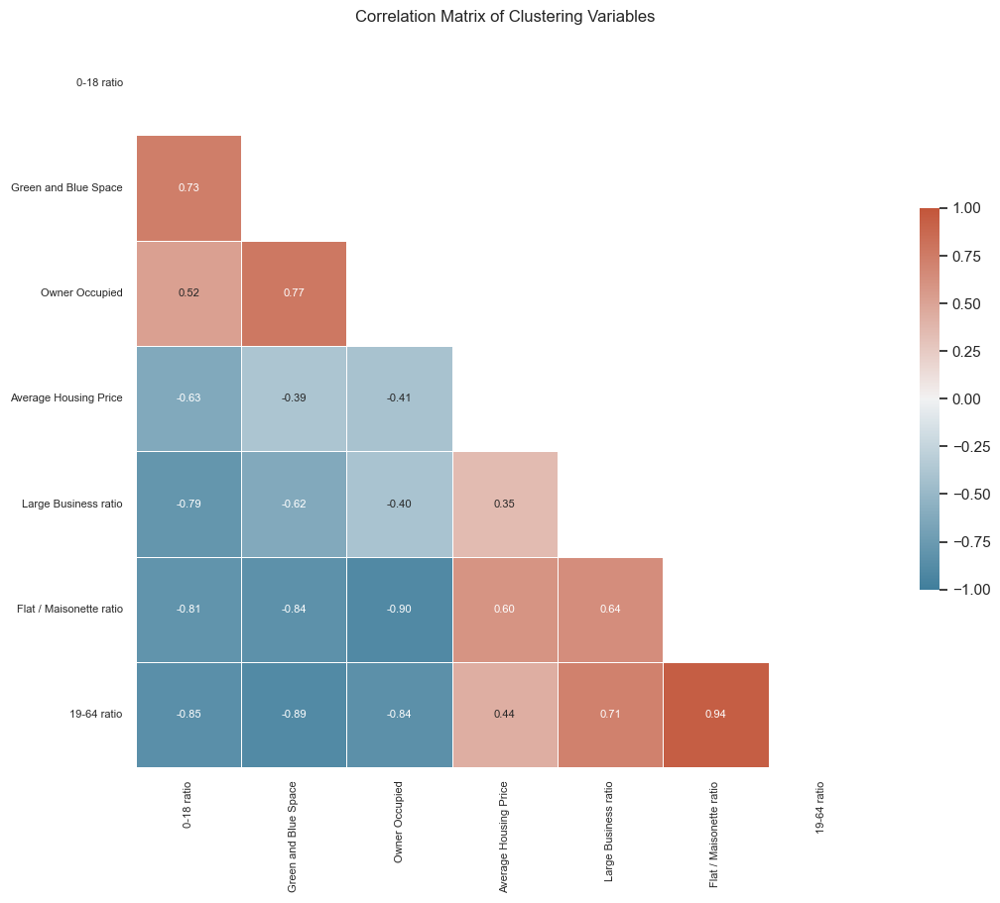

In [233]:
df_numeric_2 = df_cluster_2.select_dtypes(include=[np.number])

corr_matrix = df_numeric_2.corr()

# Set the plot theme to a white background
sns.set_theme(style="white")

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 10))

# Generate a custom diverging color palette
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns_heatmap = sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                          square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f",
                          annot_kws={"size": 8})

sns_heatmap.set_xticklabels(sns_heatmap.get_xticklabels(), fontsize=8)
sns_heatmap.set_yticklabels(sns_heatmap.get_yticklabels(), fontsize=8)

plt.title("Correlation Matrix of Clustering Variables")

plt.show()

In [234]:
df_cluster_numeric = df_cluster_2.select_dtypes(include=[np.number])

vif_data = pd.DataFrame()
vif_data["feature"] = df_cluster_numeric.columns
vif_data["VIF"] = [variance_inflation_factor(df_cluster_numeric.values, i) for i in range(df_cluster_numeric.shape[1])]

print(vif_data)

                   feature         VIF
0               0-18 ratio  143.190423
1     Green and Blue Space   84.218636
2           Owner Occupied  145.475336
3    Average Housing Price   18.516380
4     Large Business ratio    8.127824
5  Flat / Maisonette ratio  283.442410
6              19-64 ratio  833.171967


In [235]:
# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_cluster_numeric)

# Apply PCA
pca = PCA(n_components=0.95)  # Preserve 95% of the variance
pca.fit(df_scaled)
reduced = pca.transform(df_scaled)

print("Number of original features:", df_scaled.shape[1])
print("Number of features after reduction:", reduced.shape[1])

Number of original features: 7
Number of features after reduction: 4


In [236]:
# Create a DataFrame for PCA loadings with column names from the original dataset
loadings = pd.DataFrame(pca.components_, columns=df_cluster_numeric.columns)
print("PCA Loadings:\n", loadings)

PCA Loadings:
    0-18 ratio  Green and Blue Space  Owner Occupied  Average Housing Price  \
0   -0.396187             -0.396254       -0.365938               0.270841   
1   -0.367049              0.269114        0.485871               0.651992   
2   -0.199101             -0.086121        0.351496              -0.617520   
3   -0.274938             -0.698617        0.404614               0.005242   

   Large Business ratio  Flat / Maisonette ratio  19-64 ratio  
0              0.335470                 0.428049     0.427769  
1              0.284010                -0.117632    -0.192846  
2              0.637765                -0.175352     0.102806  
3             -0.467319                -0.229809     0.037469  


In [237]:
# Iterate over each principal component to identify the top three features
for i in range(len(pca.components_)):
    component = loadings.iloc[i]
    print(f"Component {i+1}:")
    # Print the four features with the highest loadings for each component
    print(component.nlargest(4))
    print()

Component 1:
Flat / Maisonette ratio    0.428049
19-64 ratio                0.427769
Large Business ratio       0.335470
Average Housing Price      0.270841
Name: 0, dtype: float64

Component 2:
Average Housing Price    0.651992
Owner Occupied           0.485871
Large Business ratio     0.284010
Green and Blue Space     0.269114
Name: 1, dtype: float64

Component 3:
Large Business ratio    0.637765
Owner Occupied          0.351496
19-64 ratio             0.102806
Green and Blue Space   -0.086121
Name: 2, dtype: float64

Component 4:
Owner Occupied             0.404614
19-64 ratio                0.037469
Average Housing Price      0.005242
Flat / Maisonette ratio   -0.229809
Name: 3, dtype: float64



##### Hierarchical Clustering

In [238]:
# Evaluate the effectiveness of different numbers of clusters using the silhouette coefficient
range_n_clusters = list(range(2,10))  # Assuming considering clusters from 2 to 9
silhouette_avg = []
for num_clusters in range_n_clusters:
    # Initialize the clustering model
    clusterer = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    
    preds = clusterer.fit_predict(reduced)
    # Get cluster labels
    centers = clusterer.labels_
    score = silhouette_score(reduced, preds)
    silhouette_avg.append(score)
    print("For n_clusters = {}, silhouette score is {})".format(num_clusters, score))

# Choose the number of clusters with the highest silhouette score
best_cluster_num = range_n_clusters[silhouette_avg.index(max(silhouette_avg))]
print("Best cluster number: ", best_cluster_num)

For n_clusters = 2, silhouette score is 0.49873322923523167)
For n_clusters = 3, silhouette score is 0.353809918996174)
For n_clusters = 4, silhouette score is 0.3744208431248655)
For n_clusters = 5, silhouette score is 0.358883610586832)
For n_clusters = 6, silhouette score is 0.27052470570604725)
For n_clusters = 7, silhouette score is 0.23015382594862005)
For n_clusters = 8, silhouette score is 0.2513018388856473)
For n_clusters = 9, silhouette score is 0.23562404880800483)
Best cluster number:  2


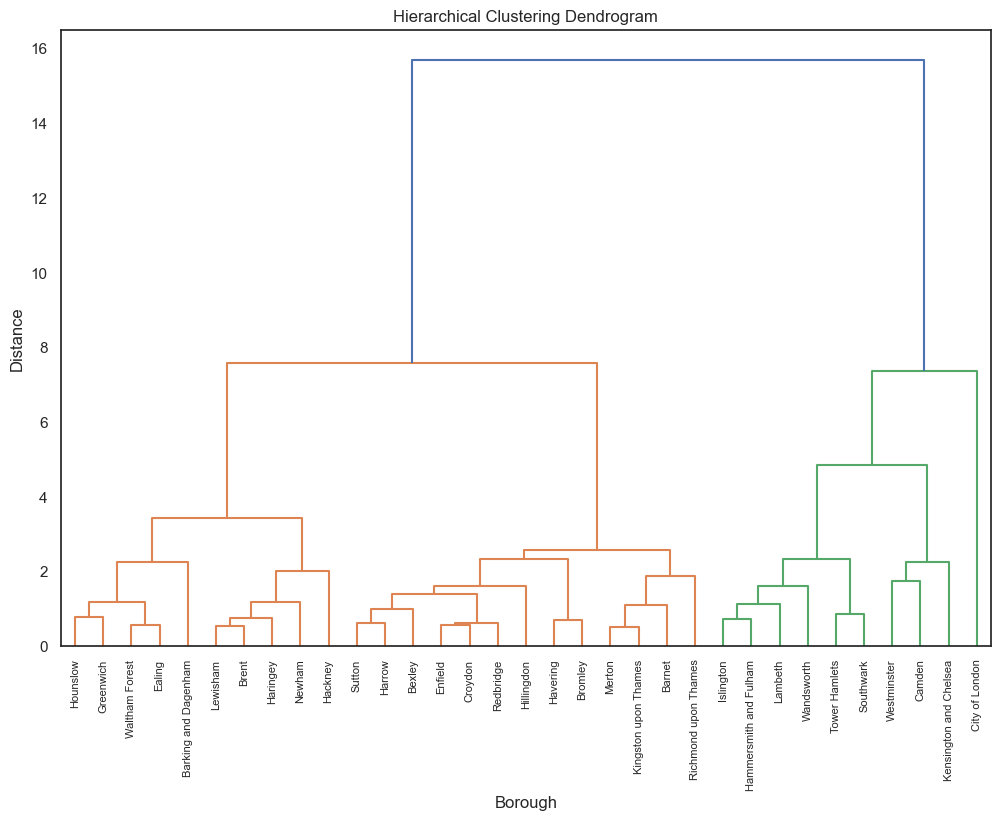

In [239]:
linked = linkage(reduced, 'ward')

# Draw the dendrogram
plt.figure(figsize=(12, 8))
dendrogram(linked,
            orientation='top',
            labels=np.array(df_cluster_2['borough']), # Ensure the borough names are used as labels
            distance_sort='descending',
            show_leaf_counts=True,
            leaf_rotation=90)  # Rotate labels by 90 degrees for better visibility
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Borough')
plt.ylabel('Distance')
plt.show()

# Select the number of clusters and apply
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
cluster_labels = cluster.fit_predict(reduced)

# Add the clustering results back to the original DataFrame
df_cluster_2['Cluster'] = cluster_labels

In [240]:
df_cluster_2

,borough,0-18 ratio,Green and Blue Space,Owner Occupied,Average Housing Price,Large Business ratio,Flat / Maisonette ratio,19-64 ratio,Cluster
0,Barking and Dagenham,0.304484,45.30,48.44,367499,0.001902,0.344332,0.607199,1
1,Barnet,0.244024,58.69,57.68,727816,0.001584,0.495860,0.607757,2
2,Bexley,0.242423,49.72,72.14,487472,0.001756,0.269417,0.590219,2
3,Brent,0.227375,40.97,44.70,630219,0.002902,0.614659,0.653430,1
4,Bromley,0.231089,68.74,70.46,620831,0.002782,0.323902,0.590537,2
5,Camden,0.179680,44.19,34.02,1073092,0.005879,0.867859,0.703934,0
6,City of London,0.063704,13.31,42.74,811032,0.016382,0.983709,0.816447,3
7,Croydon,0.242231,55.66,59.34,486377,0.002399,0.422355,0.618899,2
8,Ealing,0.229388,44.90,52.48,610904,0.001988,0.534082,0.646024,1
9,Enfield,0.261515,58.11,58.14,506337,0.002361,0.406282,0.597890,2


In [241]:
df_cluster_2['Cluster'] = cluster_labels

# Retrieve unique cluster labels
unique_clusters = df_cluster_2['Cluster'].unique()

for cluster in unique_clusters:
    # Find all boroughs under the current cluster label
    cluster_boroughs = df_cluster_2[df_cluster_2['Cluster'] == cluster]['borough']
    print(f"Cluster {cluster}:")
    print(cluster_boroughs.tolist())
    print()

Cluster 1:
['Barking and Dagenham', 'Brent', 'Ealing', 'Greenwich', 'Hackney', 'Haringey', 'Hounslow', 'Lewisham', 'Newham', 'Waltham Forest']

Cluster 2:
['Barnet', 'Bexley', 'Bromley', 'Croydon', 'Enfield', 'Harrow', 'Havering', 'Hillingdon', 'Kingston upon Thames', 'Merton', 'Redbridge', 'Richmond upon Thames', 'Sutton']

Cluster 0:
['Camden', 'Hammersmith and Fulham', 'Islington', 'Kensington and Chelsea', 'Lambeth', 'Southwark', 'Tower Hamlets', 'Wandsworth', 'Westminster']

Cluster 3:
['City of London']



__Plot on map__

In [242]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")

gdf = gdf.rename(columns={"NAME": "borough"}) 

In [243]:
gdf = gdf.merge(df_cluster_2[['borough', 'Cluster']], on="borough", how="left")
gdf.head()

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Cluster
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",2
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",2
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",2
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",1
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",1


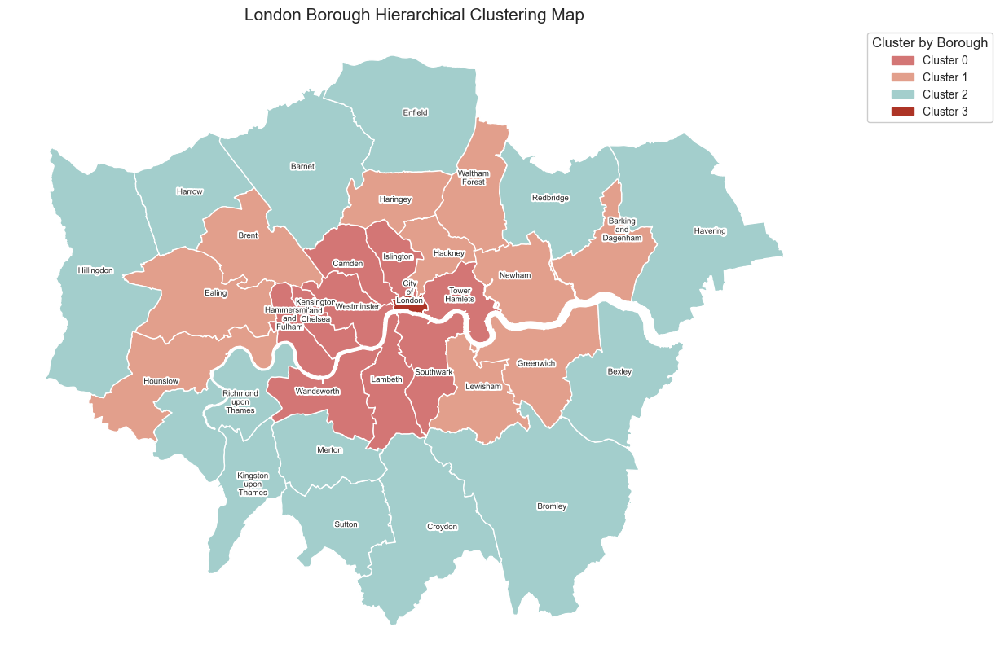

In [244]:
sns.set(style="white")

base_colors = ["#d37675", "#E29F8C", "#a3cecc", "#ad3426"]
cmap = ListedColormap(sns.color_palette(base_colors))

gdf['coords'] = gdf['geometry'].apply(lambda x: x.representative_point().coords[:])
gdf['coords'] = [coords[0] for coords in gdf['coords']]

# Plot
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='Cluster', ax=ax, legend=False, cmap=cmap)

# Add borough names
for idx, row in gdf.iterrows():
    name = row['borough']
    if len(name) > 10:
        name = name.replace(" ", "\n")
    plt.text(s=name, x=row['coords'][0], y=row['coords'][1],
             horizontalalignment='center', fontsize=7,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a legend
legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']
patches = [Patch(color=cmap.colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
legend = ax.legend(handles=patches, loc='upper left', title="Cluster by Borough",
                   frameon=True, framealpha=1, prop={'size': 10},
                   bbox_to_anchor=(1.05, 1))
legend.get_frame().set_facecolor('white')

# Hide coordinate axes
ax.set_axis_off()

plt.title('London Borough Hierarchical Clustering Map', size=15)
plt.show()

In [245]:
for cluster in unique_clusters:
    print(f"Cluster {cluster}:")
    cluster_data = df_cluster_2[df_cluster_2['Cluster'] == cluster]
    print(cluster_data.describe())

Cluster 1:
       0-18 ratio  Green and Blue Space  Owner Occupied  \
count   10.000000             10.000000       10.000000   
mean     0.238558             44.874000       44.370000   
std      0.024918              4.190609        7.782223   
min      0.217390             40.100000       27.830000   
25%      0.224298             41.035000       41.795000   
50%      0.232794             44.620000       45.195000   
75%      0.240484             48.825000       50.270000   
max      0.304484             50.590000       52.480000   

       Average Housing Price  Large Business ratio  Flat / Maisonette ratio  \
count              10.000000             10.000000                10.000000   
mean           561364.800000              0.002299                 0.559102   
std            102693.927792              0.001194                 0.123004   
min            367499.000000              0.000765                 0.344332   
25%            500181.500000              0.001638            

| Feature                  | Cluster 0        | Cluster 1       | Cluster 2       | Cluster 3       |
|--------------------------|------------------|-----------------|-----------------|-----------------|
| **0-18 Ratio**           | Low (18%)        | Medium (23.9%)  | High (24.2%)    | Very Low (6.4%) |
| **19-64 Ratio**          | High (71.8%)     | Medium (65.9%)  | Low (60.7%)     | Very High (81.6%)|
| **Green and Blue Space** | Low (37.29%)     | Medium (44.87%) | High (57.72%)   | Very Low (13.31%)|
| **Owner Occupied**       | Low (35.04%)     | Medium (44.37%) | High (64.30%)   | Medium (42.74%) |
| **Average Housing Price**| High (£970,365)  | Medium (£561,365)| High (£607,342) | High (£811,032) |
| **Large Business Ratio** | High (0.56%)     | Very Low (0.23%)| Low (0.26%)     | Very High (1.64%)|
| **Flat/Maisonette Ratio**| Very High (81.0%)| High (55.91%)   | Low (37.37%)    | Very High (98.37%)|
| **Boroughs**             | Camden, Hammersmith and Fulham, Islington, Kensington and Chelsea, Lambeth, Southwark, Tower Hamlets, Wandsworth, Westminster | Barking and Dagenham, Brent, Ealing, Greenwich, Hackney, Haringey, Hounslow, Lewisham, Newham, Waltham Forest | Barnet, Bexley, Bromley, Croydon, Enfield, Harrow, Havering, Hillingdon, Kingston upon Thames, Merton, Redbridge, Richmond upon Thames, Sutton | City of London |

__Cluster Descriptions__

`Cluster 0`
- Predominantly older age groups with very high ratios of flats/maisonettes.
- Lowest green spaces and second highest average housing prices, likely urban centers with high business activity.

`Cluster 1`
- Family-oriented with moderate levels of green spaces and owner-occupied housing.
- An even distribution of age groups with a substantial proportion of flats/maisonettes.

`Cluster 2`
- Young families with the highest green space and high owner occupancy.
- Higher housing prices but lower flat/maisonette ratio, suggesting suburban areas with spacious living conditions.

`Cluster 3`
- Extremely low young population and highest business ratio indicating central business districts.
- Very high flat/maisonette ratio and very low green space, reflecting high-density urban living.

__Findings__

Based on the borough profiles, the 33 boroughs were categorized into four clusters, each with distinct characteristics. The City of London(`Cluster 3`) stands out due to its thriving business sector. The demographic profile of the area is also notable, with over 80% of the population being working adults and a smaller proportion of children. Additionally, the majority of properties are flats or maisonettes, and the area has the least amount of green and blue space.

`Cluster 0` is characterized by a high rate of business activities. Housing prices in this cluster are the highest among all clusters. Compared to others, this cluster has the lowest proportion of owner-occupied housing, with most residents renting their homes. `Clusters 1` and `2` are similar, primarily indicated by the higher percentage of the 0-18 age group, suggesting a larger number of families reside in these areas. There is less commercial activity. Both clusters feature extensive green and blue spaces. The primary difference between them is that residents in `Cluster 2` are more likely to own their properties, whereas those in `Cluster 1` tend to rent.


<br>

##### K-mean Clustering

In [246]:
df_Kcluster = df_cluster_2.copy()
df_Kcluster.head()

,borough,0-18 ratio,Green and Blue Space,Owner Occupied,Average Housing Price,Large Business ratio,Flat / Maisonette ratio,19-64 ratio,Cluster
0,Barking and Dagenham,0.304484,45.30,48.44,367499,0.001902,0.344332,0.607199,1
1,Barnet,0.244024,58.69,57.68,727816,0.001584,0.495860,0.607757,2
2,Bexley,0.242423,49.72,72.14,487472,0.001756,0.269417,0.590219,2
3,Brent,0.227375,40.97,44.70,630219,0.002902,0.614659,0.653430,1
4,Bromley,0.231089,68.74,70.46,620831,0.002782,0.323902,0.590537,2


In [247]:
df_Kcluster = df_Kcluster.drop(columns='Cluster')
df_Kcluster.head()

,borough,0-18 ratio,Green and Blue Space,Owner Occupied,Average Housing Price,Large Business ratio,Flat / Maisonette ratio,19-64 ratio
0,Barking and Dagenham,0.304484,45.30,48.44,367499,0.001902,0.344332,0.607199
1,Barnet,0.244024,58.69,57.68,727816,0.001584,0.495860,0.607757
2,Bexley,0.242423,49.72,72.14,487472,0.001756,0.269417,0.590219
3,Brent,0.227375,40.97,44.70,630219,0.002902,0.614659,0.653430
4,Bromley,0.231089,68.74,70.46,620831,0.002782,0.323902,0.590537


In [248]:
df_Kcluster_numeric = df_Kcluster.select_dtypes(include=[np.number])

In [249]:
# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_Kcluster_numeric)

# Apply PCA
pca = PCA(n_components=0.95)  # Preserve 95% of the variance
reduced = pca.fit_transform(df_scaled)

In [250]:
# Elbow Method
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

In [251]:
# Silhouette Score
silhouette_scores = []
for i in range(2, 10):  # At least 2 clusters are needed to calculate the silhouette score
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(df_scaled)
    score = silhouette_score(df_scaled, kmeans.labels_)
    silhouette_scores.append(score)

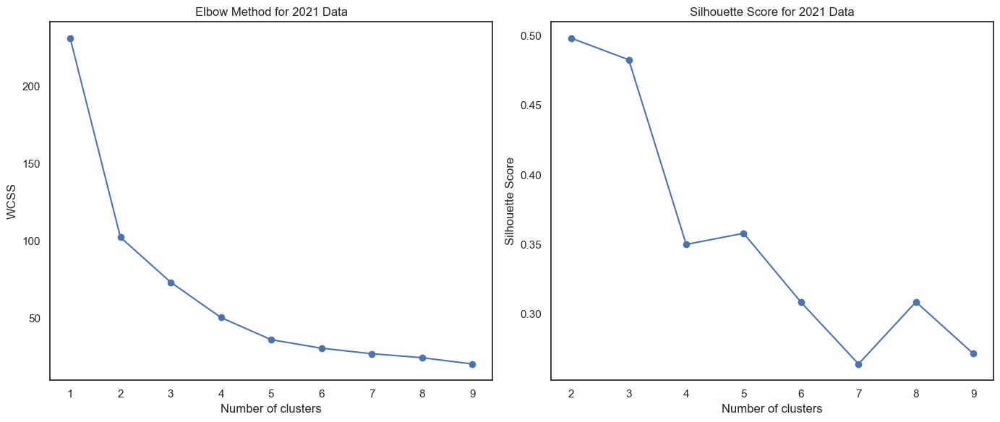

In [252]:
# Plotting the results
plt.figure(figsize=(14, 6))

# Plot for Elbow Method
plt.subplot(1, 2, 1)
plt.plot(range(1, 10), wcss, marker='o')
plt.title('Elbow Method for 2021 Data')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

# Plot for Silhouette Score
plt.subplot(1, 2, 2)
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.title('Silhouette Score for 2021 Data')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

#### K = 3

In [253]:
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(reduced)

KMeans(n_clusters=3, random_state=0)

In [254]:
# Clustering results
clusters = kmeans.labels_

In [255]:
# Add clustering results back to the original DataFrame
df_Kcluster['Cluster_3'] = clusters

# Print the centers of each cluster
print("Cluster Centers:")
print(kmeans.cluster_centers_)

Cluster Centers:
[[-1.3916783  -0.02721342  0.08313664  0.03943281]
 [ 2.4174212  -0.04602577 -0.50719507 -0.13497017]
 [ 6.44271065  1.05895289  3.24294459  0.4821799 ]]


In [256]:
# Print the number of features before and after dimension reduction
print("Number of original features:", df_scaled.shape[1])
print("Number of features after reduction:", reduced.shape[1])

Number of original features: 7
Number of features after reduction: 4


In [257]:
df_Kcluster

,borough,0-18 ratio,Green and Blue Space,Owner Occupied,Average Housing Price,Large Business ratio,Flat / Maisonette ratio,19-64 ratio,Cluster_3
0,Barking and Dagenham,0.304484,45.30,48.44,367499,0.001902,0.344332,0.607199,0
1,Barnet,0.244024,58.69,57.68,727816,0.001584,0.495860,0.607757,0
2,Bexley,0.242423,49.72,72.14,487472,0.001756,0.269417,0.590219,0
3,Brent,0.227375,40.97,44.70,630219,0.002902,0.614659,0.653430,0
4,Bromley,0.231089,68.74,70.46,620831,0.002782,0.323902,0.590537,0
5,Camden,0.179680,44.19,34.02,1073092,0.005879,0.867859,0.703934,1
6,City of London,0.063704,13.31,42.74,811032,0.016382,0.983709,0.816447,2
7,Croydon,0.242231,55.66,59.34,486377,0.002399,0.422355,0.618899,0
8,Ealing,0.229388,44.90,52.48,610904,0.001988,0.534082,0.646024,0
9,Enfield,0.261515,58.11,58.14,506337,0.002361,0.406282,0.597890,0


In [258]:
df_Kcluster['Cluster_3'] = kmeans.labels_

# Retrieve unique cluster labels
unique_clusters = df_Kcluster['Cluster_3'].unique()

for cluster in unique_clusters:
    cluster_boroughs = df_Kcluster[df_Kcluster['Cluster_3'] == cluster]['borough']
    print(f"Cluster {cluster}:")
    print(cluster_boroughs.tolist())
    print()

Cluster 0:
['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Haringey', 'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Kingston upon Thames', 'Lewisham', 'Merton', 'Newham', 'Redbridge', 'Richmond upon Thames', 'Sutton', 'Waltham Forest']

Cluster 1:
['Camden', 'Hackney', 'Hammersmith and Fulham', 'Islington', 'Kensington and Chelsea', 'Lambeth', 'Southwark', 'Tower Hamlets', 'Wandsworth', 'Westminster']

Cluster 2:
['City of London']



#### plot on the map

In [259]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")

gdf = gdf.rename(columns={"NAME": "borough"})

In [260]:
gdf = gdf.merge(df_Kcluster[['borough', 'Cluster_3']], on="borough", how="left")
gdf.head()

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Cluster_3
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",0
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",0
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",0
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",0
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",0


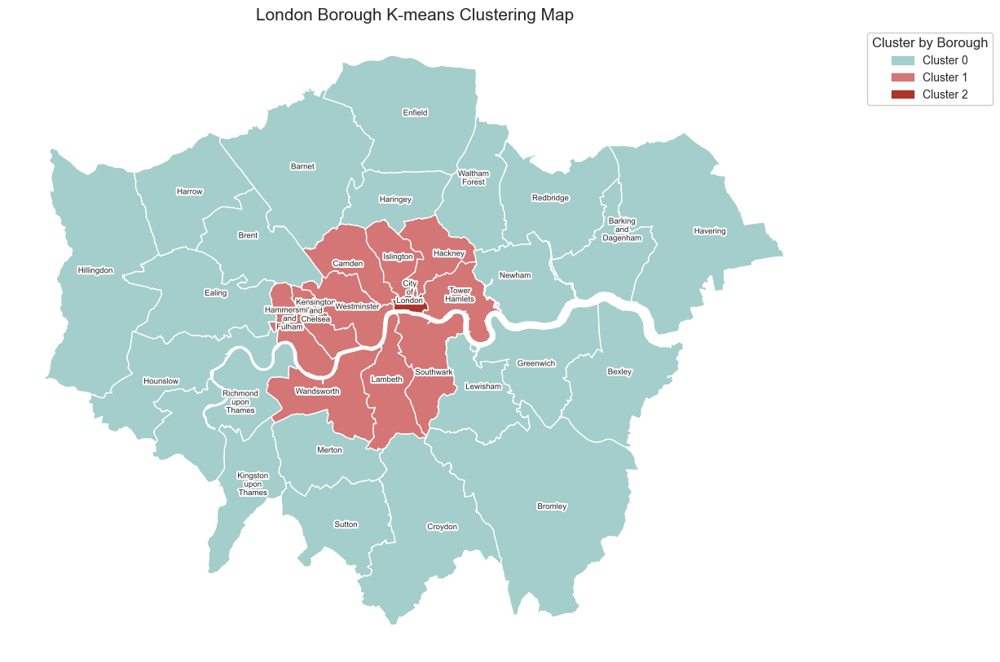

In [261]:
sns.set(style="white")

#base_colors = ["#d37675", "#E29F8C", "#a3cecc", "#ad3426"]
base_colors = ["#a3cecc", "#d37675", "#ad3426"]
cmap = ListedColormap(sns.color_palette(base_colors))

gdf['coords'] = gdf['geometry'].apply(lambda x: x.representative_point().coords[:])
gdf['coords'] = [coords[0] for coords in gdf['coords']]

# Plot
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='Cluster_3', ax=ax, legend=False, cmap=cmap)

# Add borough names
for idx, row in gdf.iterrows():
    name = row['borough']
    if len(name) > 10:
        name = name.replace(" ", "\n")
    plt.text(s=name, x=row['coords'][0], y=row['coords'][1],
             horizontalalignment='center', fontsize=7,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a legend
legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2']
patches = [Patch(color=cmap.colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
legend = ax.legend(handles=patches, loc='upper left', title="Cluster by Borough",
                   frameon=True, framealpha=1, prop={'size': 10},
                   bbox_to_anchor=(1.05, 1))
legend.get_frame().set_facecolor('white')

# Hide coordinate axes
ax.set_axis_off()

plt.title('London Borough K-means Clustering Map', size=15)
plt.show()

In [262]:
# Retrieve unique cluster labels
unique_clusters = df_Kcluster['Cluster_3'].unique()

In [263]:
for cluster in unique_clusters:
    print(f"Cluster {cluster}:")
    cluster_data = df_Kcluster[df_Kcluster['Cluster_3'] == cluster]
    print(cluster_data.describe())

Cluster 0:
       0-18 ratio  Green and Blue Space  Owner Occupied  \
count   22.000000             22.000000       22.000000   
mean     0.241318             52.642273       56.897727   
std      0.017677              8.514635       10.481559   
min      0.217390             40.100000       36.040000   
25%      0.230349             46.382500       49.050000   
50%      0.237975             50.765000       58.675000   
75%      0.245196             57.367500       63.465000   
max      0.304484             69.490000       73.160000   

       Average Housing Price  Large Business ratio  Flat / Maisonette ratio  \
count              22.000000             22.000000                22.000000   
mean           581870.318182              0.002481                 0.437756   
std            119591.760706              0.001158                 0.108084   
min            367499.000000              0.000765                 0.250696   
25%            496686.750000              0.001627            

<br>

#### K = 4

In [264]:
# Choose the number of clusters
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans.fit(reduced)

# Clustering results
clusters = kmeans.labels_

# Add clustering results back to the original DataFrame
df_Kcluster['Cluster_4'] = clusters

# Print the centers of each cluster
print("Cluster Centers:")
print(kmeans.cluster_centers_)

Cluster Centers:
[[ 2.4174212  -0.04602577 -0.50719507 -0.13497017]
 [-2.01522897  0.5256094   0.21438684 -0.01077501]
 [-0.490994   -0.82573526 -0.10644697  0.11195521]
 [ 6.44271065  1.05895289  3.24294459  0.4821799 ]]


In [265]:
# Print the number of features before and after dimension reduction
print("Number of original features:", df_scaled.shape[1])
print("Number of features after reduction:", reduced.shape[1])

Number of original features: 7
Number of features after reduction: 4


In [266]:
df_Kcluster

,borough,0-18 ratio,Green and Blue Space,Owner Occupied,Average Housing Price,Large Business ratio,Flat / Maisonette ratio,19-64 ratio,Cluster_3,Cluster_4
0,Barking and Dagenham,0.304484,45.30,48.44,367499,0.001902,0.344332,0.607199,0,2
1,Barnet,0.244024,58.69,57.68,727816,0.001584,0.495860,0.607757,0,1
2,Bexley,0.242423,49.72,72.14,487472,0.001756,0.269417,0.590219,0,1
3,Brent,0.227375,40.97,44.70,630219,0.002902,0.614659,0.653430,0,2
4,Bromley,0.231089,68.74,70.46,620831,0.002782,0.323902,0.590537,0,1
5,Camden,0.179680,44.19,34.02,1073092,0.005879,0.867859,0.703934,1,0
6,City of London,0.063704,13.31,42.74,811032,0.016382,0.983709,0.816447,2,3
7,Croydon,0.242231,55.66,59.34,486377,0.002399,0.422355,0.618899,0,1
8,Ealing,0.229388,44.90,52.48,610904,0.001988,0.534082,0.646024,0,2
9,Enfield,0.261515,58.11,58.14,506337,0.002361,0.406282,0.597890,0,1


In [267]:
df_Kcluster['Cluster_3'] = kmeans.labels_

# Retrieve unique cluster labels
unique_clusters = df_Kcluster['Cluster_4'].unique()

for cluster in unique_clusters:
    cluster_boroughs = df_Kcluster[df_Kcluster['Cluster_3'] == cluster]['borough']
    print(f"Cluster {cluster}:")
    print(cluster_boroughs.tolist())
    print()

Cluster 2:
['Barking and Dagenham', 'Brent', 'Ealing', 'Greenwich', 'Haringey', 'Hounslow', 'Lewisham', 'Newham', 'Waltham Forest']

Cluster 1:
['Barnet', 'Bexley', 'Bromley', 'Croydon', 'Enfield', 'Harrow', 'Havering', 'Hillingdon', 'Kingston upon Thames', 'Merton', 'Redbridge', 'Richmond upon Thames', 'Sutton']

Cluster 0:
['Camden', 'Hackney', 'Hammersmith and Fulham', 'Islington', 'Kensington and Chelsea', 'Lambeth', 'Southwark', 'Tower Hamlets', 'Wandsworth', 'Westminster']

Cluster 3:
['City of London']



#### Plot on map

In [268]:
gdf = gpd.read_file("Dataset/London Borough Profile/9. SHP/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")

gdf = gdf.rename(columns={"NAME": "borough"})

In [269]:
gdf = gdf.merge(df_Kcluster[['borough', 'Cluster_4']], on="borough", how="left")
gdf.head()

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Cluster_4
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"POLYGON ((516401.600 160201.800, 516407.300 16...",1
1,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.200 159504.700, 535005.500 15...",1
2,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.600 157530.400, 540361.200 15...",1
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"POLYGON ((521975.800 178100.000, 521967.700 17...",2
4,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.500 182881.600, 510249.900 18...",2


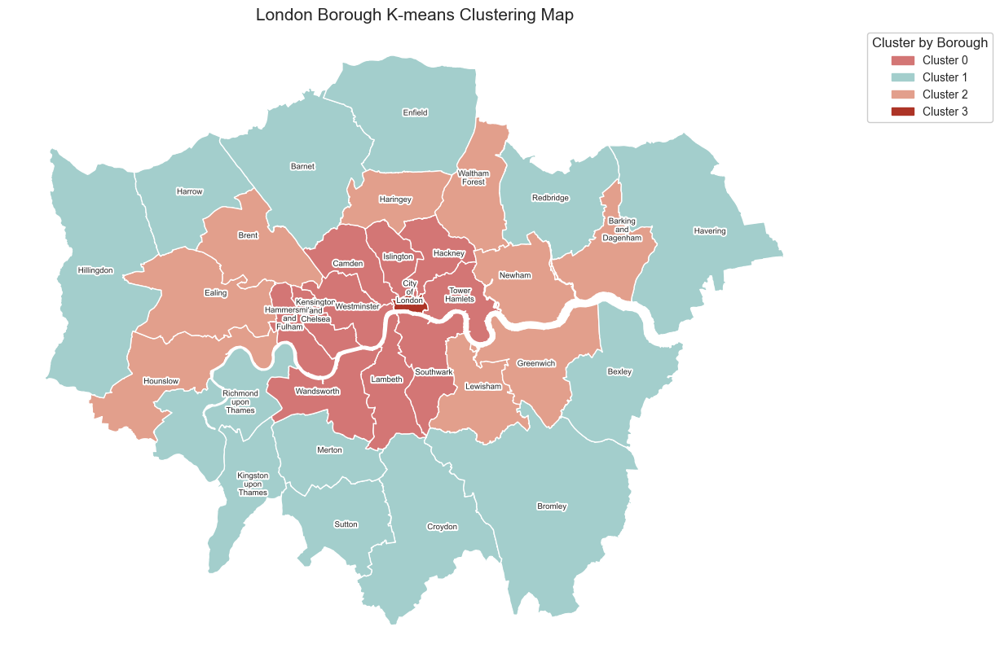

In [270]:
sns.set(style="white")

base_colors = ["#d37675", "#a3cecc", "#E29F8C", "#ad3426"]
# base_colors = ["#a3cecc", "#d37675", "#ad3426"]
cmap = ListedColormap(sns.color_palette(base_colors))

gdf['coords'] = gdf['geometry'].apply(lambda x: x.representative_point().coords[:])
gdf['coords'] = [coords[0] for coords in gdf['coords']]

# Plot
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='Cluster_4', ax=ax, legend=False, cmap=cmap)

# Add borough names
for idx, row in gdf.iterrows():
    name = row['borough']
    if len(name) > 10:
        name = name.replace(" ", "\n")
    plt.text(s=name, x=row['coords'][0], y=row['coords'][1],
             horizontalalignment='center', fontsize=7,
             path_effects=[patheffects.withStroke(linewidth=3, foreground="white")])

# Create a legend
legend_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3']
patches = [Patch(color=cmap.colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
legend = ax.legend(handles=patches, loc='upper left', title="Cluster by Borough",
                   frameon=True, framealpha=1, prop={'size': 10},
                   bbox_to_anchor=(1.05, 1))
legend.get_frame().set_facecolor('white')

# Hide coordinate axes
ax.set_axis_off()

plt.title('London Borough K-means Clustering Map', size=15)
plt.show()

In [271]:
# Retrieve unique cluster labels
unique_clusters = df_Kcluster['Cluster_4'].unique()

In [272]:
for cluster in unique_clusters:
    print(f"Cluster {cluster}:")
    cluster_data = df_Kcluster[df_Kcluster['Cluster_4'] == cluster]
    print(cluster_data.describe())

Cluster 2:
       0-18 ratio  Green and Blue Space  Owner Occupied  \
count    9.000000              9.000000        9.000000   
mean     0.240371             45.301111       46.207778   
std      0.025720              4.207622        5.489747   
min      0.217390             40.100000       36.040000   
25%      0.227375             41.050000       44.330000   
50%      0.236200             44.900000       45.690000   
75%      0.241700             50.000000       50.880000   
max      0.304484             50.590000       52.480000   

       Average Housing Price  Large Business ratio  Flat / Maisonette ratio  \
count               9.000000              9.000000                 9.000000   
mean           545078.444444              0.002332                 0.530290   
std             94235.278222              0.001261                 0.087646   
min            367499.000000              0.000765                 0.344332   
25%            493470.000000              0.001550            

| Feature                  | Cluster 0                                  | Cluster 1                                  | Cluster 2                                  | Cluster 3                               |
|--------------------------|--------------------------------------------|--------------------------------------------|--------------------------------------------|----------------------------------------|
| **0-18 Ratio**           | Low (18.44%)                               | Medium (24.20%)                            | Medium (24.20%)                              | Very Low (6.37%)                       |
| **19-64 Ratio**          | High (71.63%)                              | Medium (65.90%)                            | Medium (65.46%)                            | Very High (81.65%)                     |
| **Green and Blue Space** | Low (37.66%)                               | High (57.72%)                              | Medium (45.30%)                            | Very Low (13.31%)                      |
| **Owner Occupied**       | Low (34.32%)                               | High (64.30%)                              | Medium (46.21%)                            | Medium (42.74%)                        |
| **Average Housing Price**| Very High (£944,122)                       | Medium (£607,342)                            | Medium (£545,078)                         | High (£811,032)                        |
| **Large Business Ratio** | High (0.52%)                               | Low (0.26%)                                | Low (0.23%)                           | Very High (1.64%)                      |
| **Flat/Maisonette Ratio**| Very High (81.16%)                         | Low (37.37%)                               | High (53.03%)                              | Very High (98.37%)                     |
| **Boroughs**             | Camden, Hackney, Hammersmith and Fulham, Islington, Kensington and Chelsea, Lambeth, Southwark, Tower Hamlets, Wandsworth, Westminster | Barnet, Bexley, Bromley, Croydon, Enfield, Harrow, Havering, Hillingdon, Kingston upon Thames, Merton, Redbridge, Richmond upon Thames, Sutton | Barking and Dagenham, Brent, Ealing, Greenwich, Haringey, Hounslow, Lewisham, Newham, Waltham Forest | City of London                         |


<br>
<br>
<br>

## Conclusion and Recommendations 

Although council tax is currently calculated based on property values from 1991, our analysis has revealed that numerous factors influence it, highlighting significant concerns regarding equity, especially as poorer areas face disproportionately higher tax burdens. The existing council tax system does not reflect the modern economic landscape or the real needs of local authorities. To address these disparities and enhance fairness, the following steps are recommended:  

__1.	Annual Borough Profile Review__  
Given the available data, we should annually identify the specific characteristics of each borough. By understanding the similarities and differences among grouped boroughs, we can assign each a borough-specific coefficient to achieve fairer taxation.  

__2.	Update Council Tax Valuation__  
The method for evaluating council tax should be aligned with the calculation used for business rates, which are based on up-to-date rateable values and revised more frequently. As of April 1, 2021, rateable values are assessed every five years, with plans to shift to a triennial review starting in 2023. This ensures that evaluations are current and reflective of prevailing market conditions.  

__3.	Reform Council Tax Bands__
The existing council tax bands are outdated and exhibit a negative correlation with current housing prices, indicating a flawed system. Consider eliminating these bands, or directly linking council tax to updated housing values for simplicity and enhanced fairness.

__4.	Cross-Borough Collaboration with Equitable Distribution of Services__
Some boroughs face higher tax burdens due to larger populations of children or the elderly. Instead of basing calculations solely on updated housing values, introducing a local coefficient to account for demographic variances could foster greater equity across boroughs.


<br>

## Limitation

__1. Data Timeliness__  
   The Tax Pressure Index (TPI) relies on data from 2021, a period that may not accurately reflect typical fiscal conditions due to pandemic-related anomalies, including exceptional financial aid provided to local governments.  

__2. Data Granularity__  
  The study targets borough-level data, which comprises only 33 data points. This small sample size limits the model's ability to reduce multicollinearity and achieve high accuracy.

__3. Council Tax Relief__  
The analysis does not account for council tax relief measures, which could significantly alter the fiscal burden on residents and distort the perceived equity of the tax system.  

__4. Regulatory Caps on Increases__  
The legal regulation that caps council tax increases at below 5% annually means that the data might not fully capture the real demand for public services and the corresponding financial stress on local governments.

__5. Data Richness__  
Incorporating a broader set of features could enhance the differentiation of boroughs, or potentially smaller areas such as MSOAs or LSOAs, ensuring a more comprehensive analysis.

__6. Real-World Implementation Challenges__  
While the analysis employs several methods to highlight the inequities of council tax, real-world implementation encompasses more complex issues, such as political factors, which cannot be easily analysed or predicted with numerical data alone.

<br>
<br>
<br>

## Appendix

#### Regression

#### 1

In [273]:
df_reg = df.copy()

df_reg.head()

,borough,Council Tax,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,GDP,...,Funding per pupil,Life Expectancy,Childhood Obesity,Incapacity Benefit,Crime rate,Deliberate Fires,Public Transport Accessibility,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score,Green and Blue Space
0,Barking and Dagenham,1785,219992,0.304484,0.607199,0.084162,0.445946,0.247748,0.229730,4500,...,6247.965662,79.7,25.4,2.4,90.6,1.0,3.0,-1.7,7.7,45.30
1,Barnet,1746,389101,0.244024,0.607757,0.139275,0.640704,0.198492,0.070352,11366,...,5613.939440,83.0,18.7,1.5,68.7,0.3,3.0,-2.7,7.4,58.69
2,Bexley,1923,247835,0.242423,0.590219,0.158517,0.740157,0.078740,0.110236,7051,...,5347.299922,82.3,22.5,1.4,59.5,0.6,2.6,3.1,7.8,49.72
3,Brent,1815,341221,0.227375,0.653430,0.113533,0.352410,0.415663,0.120482,10565,...,6072.923018,82.2,23.6,1.8,85.9,0.3,3.7,-5.7,7.4,40.97
4,Bromley,1737,329578,0.231089,0.590537,0.167645,0.781065,0.073964,0.068047,9099,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74


In [275]:
import statsmodels.api as sm

In [276]:
X = df_reg['Average Housing Price']
y = df_reg['Council Tax']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            Council Tax   R-squared:                       0.303
Model:                            OLS   Adj. R-squared:                  0.281
Method:                 Least Squares   F-statistic:                     13.48
Date:                Tue, 14 May 2024   Prob (F-statistic):           0.000902
Time:                        13:36:38   Log-Likelihood:                -229.33
No. Observations:                  33   AIC:                             462.7
Df Residuals:                      31   BIC:                             465.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  2133.63

Even though the average housing price significantly impacts the current council tax (P<0.05), the relationship between the average housing price and council tax is negatively correlated, indicating that it is unsuitable to use a regression model to devise a better solution for council tax.

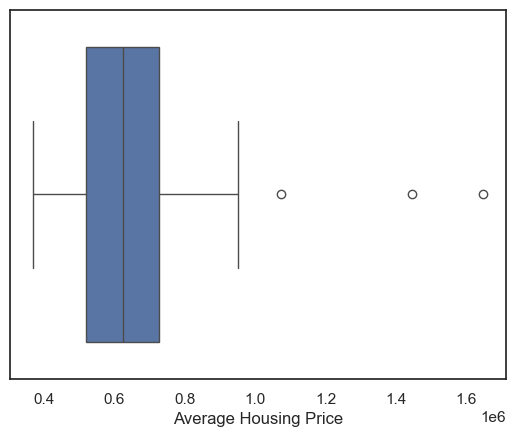

In [277]:
sns.boxplot(x=df['Average Housing Price'])
plt.show()

In [278]:
df_reg['Log_Average_Housing_Price'] = np.log(df_reg['Average Housing Price'])

In [279]:
X_new = df_reg[['Log_Average_Housing_Price']]
X_new = sm.add_constant(X_new)

model_new = sm.OLS(y, X_new).fit()

print(model_new.summary())

                            OLS Regression Results                            
Dep. Variable:            Council Tax   R-squared:                       0.294
Model:                            OLS   Adj. R-squared:                  0.271
Method:                 Least Squares   F-statistic:                     12.89
Date:                Tue, 14 May 2024   Prob (F-statistic):            0.00112
Time:                        13:36:38   Log-Likelihood:                -229.55
No. Observations:                  33   AIC:                             463.1
Df Residuals:                      31   BIC:                             466.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [280]:
X_new = df_reg[['65+ ratio', 'Log_Average_Housing_Price',
                'Green and Blue Space', 'Public Transport Accessibility']]
X_new = sm.add_constant(X_new)

model_new = sm.OLS(y, X_new).fit()

print(model_new.summary())

                            OLS Regression Results                            
Dep. Variable:            Council Tax   R-squared:                       0.535
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     8.054
Date:                Tue, 14 May 2024   Prob (F-statistic):           0.000188
Time:                        13:36:38   Log-Likelihood:                -222.66
No. Observations:                  33   AIC:                             455.3
Df Residuals:                      28   BIC:                             462.8
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [281]:
X_new = df_reg[['65+ ratio', 'Log_Average_Housing_Price', 'Large Business ratio']]
X_new = sm.add_constant(X_new)

model_new = sm.OLS(y, X_new).fit()

print(model_new.summary())

                            OLS Regression Results                            
Dep. Variable:            Council Tax   R-squared:                       0.575
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     13.09
Date:                Tue, 14 May 2024   Prob (F-statistic):           1.38e-05
Time:                        13:36:38   Log-Likelihood:                -221.16
No. Observations:                  33   AIC:                             450.3
Df Residuals:                      29   BIC:                             456.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

<br>

#### 2

In [282]:
df_tax_2024.head()

,borough,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,City of London,811.926667,947.247778,1082.568889,1217.89,1488.532222,1759.174444,2029.816667,2435.78
1,Barking and Dagenham,1335.166667,1557.694444,1780.222222,2002.75,2447.805556,2892.861111,3337.916667,4005.50
2,Barnet,1295.493333,1511.408889,1727.324444,1943.24,2375.071111,2806.902222,3238.733333,3886.48
3,Bexley,1436.693333,1676.142222,1915.591111,2155.04,2633.937778,3112.835556,3591.733333,4310.08
4,Brent,1357.366667,1583.594444,1809.822222,2036.05,2488.505556,2940.961111,3393.416667,4072.10


In [283]:
df_scrap_tax = pd.merge(df_scrap_fil, df_tax_2024, on='borough')
df_scrap_tax

,Address,Postcode,Council Tax Band,borough,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H
0,"6 ANDORRA COURT, WIDMORE ROAD",BR1 3AE,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42
1,"5 WINSTON COURT, WIDMORE ROAD",BR1 3AD,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42
2,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",BR1 3AD,E,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42
3,"9 ELIZABETH COURT, HIGHLAND ROAD",BR1 4AA,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42
4,FLAT 3 AT 7 HIGHLAND ROAD,BR1 4AA,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42
...,...,...,...,...,...,...,...,...,...,...,...,...
2475,32 MONTAGUE AVENUE,W7 3PH,E,Ealing,1298.893333,1515.375556,1731.857778,1948.34,2381.304444,2814.268889,3247.233333,3896.68
2476,165A UXBRIDGE ROAD,W7 3TH,C,Ealing,1298.893333,1515.375556,1731.857778,1948.34,2381.304444,2814.268889,3247.233333,3896.68
2477,25 LOWER BOSTON ROAD,W7 3TP,E,Ealing,1298.893333,1515.375556,1731.857778,1948.34,2381.304444,2814.268889,3247.233333,3896.68
2478,"19 BENJAMIN COURT, WESTMINSTER ROAD",W7 3UQ,C,Ealing,1298.893333,1515.375556,1731.857778,1948.34,2381.304444,2814.268889,3247.233333,3896.68


In [284]:
def get_tax(row):
    band = 'Band ' + row['Council Tax Band']
    return row[band]

In [285]:
df_scrap_tax['Council Tax Amount'] = df_scrap_tax.apply(get_tax, axis=1)
df_scrap_tax.head()

,Address,Postcode,Council Tax Band,borough,Band A,Band B,Band C,Band D,Band E,Band F,Band G,Band H,Council Tax Amount
0,"6 ANDORRA COURT, WIDMORE ROAD",BR1 3AE,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42,1733.075556
1,"5 WINSTON COURT, WIDMORE ROAD",BR1 3AD,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42,1733.075556
2,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",BR1 3AD,E,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42,2382.978889
3,"9 ELIZABETH COURT, HIGHLAND ROAD",BR1 4AA,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42,1733.075556
4,FLAT 3 AT 7 HIGHLAND ROAD,BR1 4AA,C,Bromley,1299.806667,1516.441111,1733.075556,1949.71,2382.978889,2816.247778,3249.516667,3899.42,1733.075556


In [286]:
df_scrap_tax = df_scrap_tax[['Postcode', 'borough', 'Address', 'Council Tax Band', 'Council Tax Amount']]
df_scrap_tax.head()

,Postcode,borough,Address,Council Tax Band,Council Tax Amount
0,BR1 3AE,Bromley,"6 ANDORRA COURT, WIDMORE ROAD",C,1733.075556
1,BR1 3AD,Bromley,"5 WINSTON COURT, WIDMORE ROAD",C,1733.075556
2,BR1 3AD,Bromley,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",E,2382.978889
3,BR1 4AA,Bromley,"9 ELIZABETH COURT, HIGHLAND ROAD",C,1733.075556
4,BR1 4AA,Bromley,FLAT 3 AT 7 HIGHLAND ROAD,C,1733.075556


In [287]:
df_regression = df_scrap_tax.merge(df, on="borough", how="left")
df_regression.head()

,Postcode,borough,Address,Council Tax Band,Council Tax Amount,Council Tax,population,0-18 ratio,19-64 ratio,65+ ratio,...,Funding per pupil,Life Expectancy,Childhood Obesity,Incapacity Benefit,Crime rate,Deliberate Fires,Public Transport Accessibility,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score,Green and Blue Space
0,BR1 3AE,Bromley,"6 ANDORRA COURT, WIDMORE ROAD",C,1733.075556,1737,329578,0.231089,0.590537,0.167645,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
1,BR1 3AD,Bromley,"5 WINSTON COURT, WIDMORE ROAD",C,1733.075556,1737,329578,0.231089,0.590537,0.167645,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
2,BR1 3AD,Bromley,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",E,2382.978889,1737,329578,0.231089,0.590537,0.167645,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
3,BR1 4AA,Bromley,"9 ELIZABETH COURT, HIGHLAND ROAD",C,1733.075556,1737,329578,0.231089,0.590537,0.167645,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
4,BR1 4AA,Bromley,FLAT 3 AT 7 HIGHLAND ROAD,C,1733.075556,1737,329578,0.231089,0.590537,0.167645,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74


In [288]:
df_regression = df_regression.drop(columns=['Council Tax'])

df_regression.head()

,Postcode,borough,Address,Council Tax Band,Council Tax Amount,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,...,Funding per pupil,Life Expectancy,Childhood Obesity,Incapacity Benefit,Crime rate,Deliberate Fires,Public Transport Accessibility,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score,Green and Blue Space
0,BR1 3AE,Bromley,"6 ANDORRA COURT, WIDMORE ROAD",C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
1,BR1 3AD,Bromley,"5 WINSTON COURT, WIDMORE ROAD",C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
2,BR1 3AD,Bromley,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",E,2382.978889,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
3,BR1 4AA,Bromley,"9 ELIZABETH COURT, HIGHLAND ROAD",C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
4,BR1 4AA,Bromley,FLAT 3 AT 7 HIGHLAND ROAD,C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74


In [289]:
df_regression = df_regression.copy()

In [290]:
df_regression.head()

,Postcode,borough,Address,Council Tax Band,Council Tax Amount,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,...,Funding per pupil,Life Expectancy,Childhood Obesity,Incapacity Benefit,Crime rate,Deliberate Fires,Public Transport Accessibility,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score,Green and Blue Space
0,BR1 3AE,Bromley,"6 ANDORRA COURT, WIDMORE ROAD",C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
1,BR1 3AD,Bromley,"5 WINSTON COURT, WIDMORE ROAD",C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
2,BR1 3AD,Bromley,"17 BLOOMSBURY MANSIONS 101, WIDMORE ROAD",E,2382.978889,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
3,BR1 4AA,Bromley,"9 ELIZABETH COURT, HIGHLAND ROAD",C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74
4,BR1 4AA,Bromley,FLAT 3 AT 7 HIGHLAND ROAD,C,1733.075556,329578,0.231089,0.590537,0.167645,0.781065,...,5305.352345,82.9,16.5,1.3,70.9,0.6,2.8,6.0,7.7,68.74


In [291]:
df_regression.to_csv('df_borough_profile.csv', index=False)

In [292]:
X = df_regression['Average Housing Price']
y = df_regression['Council Tax Amount']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:     Council Tax Amount   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     49.67
Date:                Tue, 14 May 2024   Prob (F-statistic):           2.35e-12
Time:                        13:36:38   Log-Likelihood:                -19210.
No. Observations:                2480   AIC:                         3.842e+04
Df Residuals:                    2478   BIC:                         3.844e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  1596.69

In [293]:
df_regression.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2480 entries, 0 to 2479
Data columns (total 43 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   Postcode                                                         2480 non-null   object 
 1   borough                                                          2480 non-null   object 
 2   Address                                                          2480 non-null   object 
 3   Council Tax Band                                                 2480 non-null   object 
 4   Council Tax Amount                                               2480 non-null   float64
 5   population                                                       2480 non-null   int32  
 6   0-18 ratio                                                       2480 non-null   float64
 7   19-64 ratio                               

In [294]:
df_regression_num = df_regression.select_dtypes(include=[np.number])

In [295]:
df_regression_num.corr()

,Council Tax Amount,population,0-18 ratio,19-64 ratio,65+ ratio,White ratio,Asian ratio,Black ratio,GDP,Average Income mean,...,Funding per pupil,Life Expectancy,Childhood Obesity,Incapacity Benefit,Crime rate,Deliberate Fires,Public Transport Accessibility,"Homes with access to open space & nature, and % greenspace 2013",Subjective well-being average score,Green and Blue Space
Council Tax Amount,1.000000,-0.062591,0.043566,-0.280582,0.399721,0.178549,-0.137064,-0.055784,-0.180697,0.110069,...,-0.363214,0.404671,-0.384370,-0.121729,-0.107344,-0.338000,-0.197149,0.035684,-0.240931,0.275898
population,-0.062591,1.000000,0.585157,-0.413565,0.163212,-0.539787,0.568271,-0.087119,-0.180963,-0.529325,...,-0.327538,0.189042,-0.072324,-0.663919,-0.277855,0.198974,-0.581305,0.145672,0.255983,0.348063
0-18 ratio,0.043566,0.585157,1.000000,-0.818168,0.461319,-0.375597,0.349184,0.305107,-0.646417,-0.784840,...,-0.611419,0.447551,-0.075555,-0.621332,-0.155591,-0.013740,-0.879184,0.427413,-0.148001,0.724344
19-64 ratio,-0.280582,-0.413565,-0.818168,1.000000,-0.887450,0.028888,-0.055473,-0.169639,0.727383,0.487383,...,0.906500,-0.820054,0.558098,0.671954,0.290518,0.396049,0.940475,-0.351509,0.382581,-0.927345
65+ ratio,0.399721,0.163212,0.461319,-0.887450,1.000000,0.255386,-0.199305,0.026802,-0.613320,-0.126302,...,-0.909459,0.906345,-0.796688,-0.532484,-0.311538,-0.608385,-0.746669,0.202931,-0.474006,0.845888
White ratio,0.178549,-0.539787,-0.375597,0.028888,0.255386,1.000000,-0.861570,0.045248,-0.126194,0.419403,...,-0.082650,0.170236,-0.390798,0.358720,0.222956,-0.408409,0.245580,-0.148655,-0.440581,0.095136
Asian ratio,-0.137064,0.568271,0.349184,-0.055473,-0.199305,-0.861570,1.000000,-0.394306,0.282980,-0.370215,...,-0.054213,-0.124292,0.200446,-0.538782,-0.549863,0.615959,-0.295868,0.102939,0.530883,0.008363
Black ratio,-0.055784,-0.087119,0.305107,-0.169639,0.026802,0.045248,-0.394306,1.000000,-0.518001,-0.303213,...,0.040633,-0.015686,0.415166,0.252759,0.662628,-0.287716,-0.116077,0.105482,-0.422197,0.106540
GDP,-0.180697,-0.180963,-0.646417,0.727383,-0.613320,-0.126194,0.282980,-0.518001,1.000000,0.564711,...,0.650454,-0.554949,0.326379,0.301358,-0.380916,0.617416,0.680366,-0.192564,0.414770,-0.564132
Average Income mean,0.110069,-0.529325,-0.784840,0.487383,-0.126302,0.419403,-0.370215,-0.303213,0.564711,1.000000,...,0.337757,0.004017,-0.180182,0.483897,-0.087703,-0.176107,0.671903,-0.322894,-0.117412,-0.352214


In [296]:
print(df_regression.columns)

Index(['Postcode', 'borough', 'Address', 'Council Tax Band',
       'Council Tax Amount', 'population', '0-18 ratio', '19-64 ratio',
       '65+ ratio', 'White ratio', 'Asian ratio', 'Black ratio', 'GDP',
       'Average Income mean', 'Average Income median', 'Small Business ratio',
       'Medium Business ratio', 'Large Business ratio', 'Unemployment rate',
       'Average Housing Price', 'Bungalow ratio', 'Flat / Maisonette ratio',
       'Terraced House ratio', 'Semi-Detached House ratio',
       'Detached House ratio', 'Annexe ratio',
       'Caravan/ Houseboat/ Mobile Home ratio', 'Unknown Housing Type',
       'Owner Occupied', 'Privately Rented', 'Socially Rented',
       'Housing Net Addition', 'Housing Vacancy', 'Funding per pupil',
       'Life Expectancy', 'Childhood Obesity', 'Incapacity Benefit',
       'Crime rate', 'Deliberate Fires', 'Public Transport Accessibility',
       'Homes with access to open space & nature, and % greenspace 2013',
       'Subjective well-being 

In [297]:
df_regression['log_population'] = np.log1p(df_regression['population'])
df_regression['log_GDP'] = np.log1p(df_regression['GDP'])
df_regression['log_Average Income mean'] = np.log1p(df_regression['Average Income mean'])
df_regression['log_Average Housing Price'] = np.log1p(df_regression['Average Housing Price'])
df_regression['log_funding_per_pupil'] = np.log1p(df_regression['Funding per pupil'])

#### 1

In [298]:
X = df_regression[['0-18 ratio', 'Average Housing Price', 'Large Business ratio', 'Semi-Detached House ratio',
                  'Flat / Maisonette ratio', 'Socially Rented', 'Funding per pupil', 'Childhood Obesity',
                  'Incapacity Benefit', 'Green and Blue Space', 'Subjective well-being average score']]

X_scaled = scaler.fit_transform(X)

X_scaled = sm.add_constant(X_scaled)

model = sm.OLS(y, X_scaled).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:     Council Tax Amount   R-squared:                       0.220
Model:                            OLS   Adj. R-squared:                  0.216
Method:                 Least Squares   F-statistic:                     63.21
Date:                Tue, 14 May 2024   Prob (F-statistic):          1.68e-124
Time:                        13:36:38   Log-Likelihood:                -18927.
No. Observations:                2480   AIC:                         3.788e+04
Df Residuals:                    2468   BIC:                         3.795e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2023.0303     10.047    201.350      0.0

In [299]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

                                feature          VIF
0                            0-18 ratio   928.171282
1                 Average Housing Price   163.773113
2                  Large Business ratio    11.663804
3             Semi-Detached House ratio    17.804534
4               Flat / Maisonette ratio   403.933092
5                       Socially Rented   274.904104
6                     Funding per pupil  3689.735952
7                     Childhood Obesity   791.662906
8                    Incapacity Benefit   234.008886
9                  Green and Blue Space   218.667347
10  Subjective well-being average score   895.743032


#### 2

In [300]:
X = df_regression[['log_population', '19-64 ratio', 'log_GDP',
                   'log_Average Housing Price', 'Large Business ratio', 
                   'Childhood Obesity', 'Incapacity Benefit', 'log_funding_per_pupil',
                   'Subjective well-being average score']]
y = df_regression['Council Tax Amount']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:     Council Tax Amount   R-squared:                       0.218
Model:                            OLS   Adj. R-squared:                  0.215
Method:                 Least Squares   F-statistic:                     76.29
Date:                Tue, 14 May 2024   Prob (F-statistic):          7.65e-125
Time:                        13:36:38   Log-Likelihood:                -18931.
No. Observations:                2480   AIC:                         3.788e+04
Df Residuals:                    2470   BIC:                         3.794e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

In [301]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

                               feature            VIF
0                                const  132244.225588
1                       log_population       3.590321
2                          19-64 ratio      16.709876
3                              log_GDP      18.848328
4            log_Average Housing Price       8.266856
5                 Large Business ratio      16.995394
6                    Childhood Obesity       6.921599
7                   Incapacity Benefit       4.544903
8                log_funding_per_pupil      16.173093
9  Subjective well-being average score       2.849066


In [302]:
df_regression['018ratio_Green_Interaction'] = df_regression['0-18 ratio'] * df_regression['Green and Blue Space']
df_regression['B_Interaction'] = df_regression['log_GDP'] * df_regression['log_Average Income mean'] * df_regression['Large Business ratio']
df_regression['1964ratio_Trans_Interaction'] = df_regression['19-64 ratio'] * df_regression['Public Transport Accessibility']* df_regression['log_funding_per_pupil']
df_regression['Owner_SemiDetached_Interaction'] = df_regression['Owner Occupied'] * df_regression['Semi-Detached House ratio']

In [303]:
# df_regression_num = df_regression.select_dtypes(include=[np.number])

#### 3

In [304]:
X = df_regression[['log_population', '018ratio_Green_Interaction',
                  '1964ratio_Trans_Interaction', 'Owner_SemiDetached_Interaction']]
y = df_regression['Council Tax Amount']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

print(model.summary())


X = df_regression[['0-18 ratio', 'Average Housing Price', 'Large Business ratio', 'Semi-Detached House ratio',
                  'Flat / Maisonette ratio', 'Socially Rented', 'Childhood Obesity',
                  'Incapacity Benefit', 'Green and Blue Space', 'Subjective well-being average score']]
y = df_regression['Council Tax Amount']


                            OLS Regression Results                            
Dep. Variable:     Council Tax Amount   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     84.61
Date:                Tue, 14 May 2024   Prob (F-statistic):           1.95e-67
Time:                        13:36:38   Log-Likelihood:                -19076.
No. Observations:                2480   AIC:                         3.816e+04
Df Residuals:                    2475   BIC:                         3.819e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [305]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

                               feature         VIF
0                           0-18 ratio  839.185176
1                Average Housing Price  160.890717
2                 Large Business ratio   11.359262
3            Semi-Detached House ratio   17.800304
4              Flat / Maisonette ratio  290.151330
5                      Socially Rented  132.744705
6                    Childhood Obesity  683.233569
7                   Incapacity Benefit  221.610570
8                 Green and Blue Space  215.612094
9  Subjective well-being average score  501.033776


<br>


##### RandomForest

In [306]:
X = df_regression_num.drop('Council Tax Amount', axis=1)
y = df_regression_num['Council Tax Amount']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
model.fit(X_train, y_train)

predictions = model.predict(X_test)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print("MSE:", mse)
print("R²:", r2)

feature_importances = model.feature_importances_

MSE: 244701.70747145853
R²: 0.2058969986465814


<br>
<br>
<br>